# Data initial information

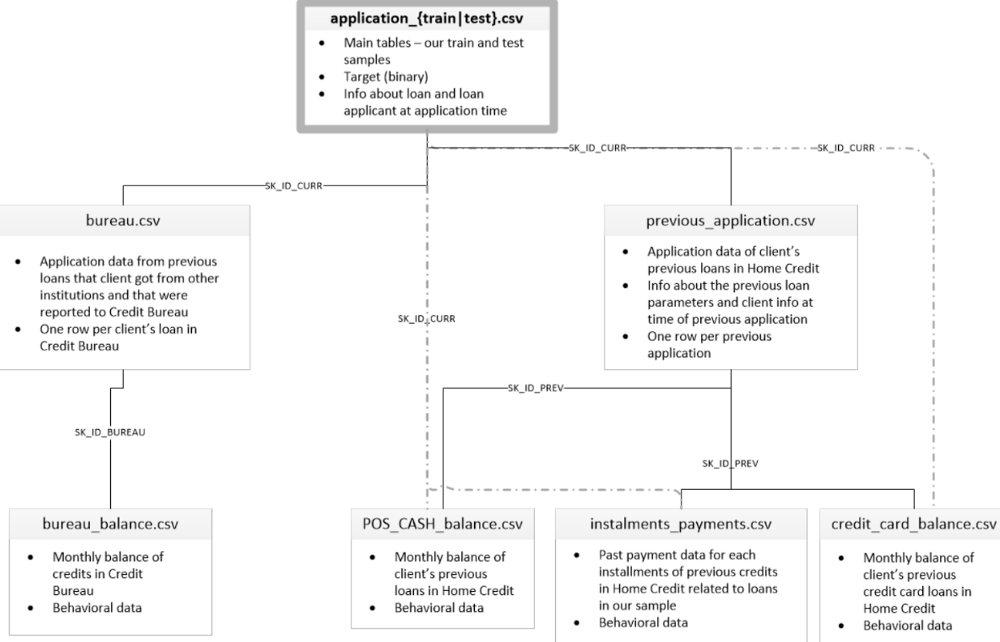

# Exploratoy Data Analysis

In this exploratory data analysis, the following strategies were employed:

1. **Read and load data**: Each CSV file was read and loaded into a PySpark DataFrame.
2. **Incorporate the target column**: The target column was merged into each DataFrame using information from the relational database and associated image IDs. Records with IDs that did not correspond to any label were removed.
3. **Count records eligible for target variable inclusion**: The number of records that could be merged into the main DataFrame with the 'TARGET' variable was counted. Depending on the count, these records were considered or excluded.
4. **Separate data by labels**: Data was separated according to each label.
5. **Automatic data type correction**: The data type of each column was automatically corrected.
6. **Outlier analysis**: An analysis of outliers was conducted using box plots.
7. **Analysis and handling of null values**: The percentage of null values in each DataFrame was analyzed. Columns with a null percentage higher than 50% were eliminated, provided there wasn't a significant percentage difference (50%) between labeled DataFrames. Remaining null values in categorical and numerical columns were filled with mode and mean values, respectively.
8. **Analysis of correlated columns**: Pearson and PhiK correlation matrices were used to identify highly correlated columns. Highly correlated columns were eliminated to avoid redundancy.
9. **Feature creation based on problem knowledge**: New relevant features were created based on specific domain knowledge.

### Load dataframes and join target 

In [1]:
# Import the created library
from EDA_tools import *

# Create a pyspark session
spark = SparkSession.builder \
    .appName("EDA") \
    .config("spark.driver.memory", "5g") \
    .config("spark.executor.memory", "5g") \
    .config("spark.executor.instances", "3") \
    .config("spark.executor.cores", "5") \
    .getOrCreate()

# Create an instance of EdaTools
edaTools = EDAtools(spark)

# Read the dataframes
application_df = edaTools.read_dataframe(csv='application.csv')
bureau_df = edaTools.read_dataframe(csv='bureau.csv')
bureau_balance_df = edaTools.read_dataframe(csv='bureau_balance.csv')
prevApp_df = edaTools.read_dataframe('previous_application.csv')
creditCard_df = edaTools.read_dataframe('credit_card_balance.csv')
POS_CASH_balance_df = edaTools.read_dataframe('POS_CASH_balance.csv')
installments_payments_df = edaTools.read_dataframe('installments_payments.csv')

# Idxs dataframes
target_idx  = application_df.select(['SK_ID_CURR', 'TARGET'])
prevApp_idxs = prevApp_df.select(['SK_ID_CURR','SK_ID_PREV'])
bureau_idxs  = bureau_df.select(['SK_ID_CURR', 'SK_ID_BUREAU'])

# Create a dataframe for the IDXS where the targets are included 
prevApp_idxs = edaTools.join_dataframes(prevApp_idxs,target_idx, 'SK_ID_CURR').drop('SK_ID_CURR')
bureau_idxs = edaTools.join_dataframes(bureau_idxs, target_idx, 'SK_ID_CURR').drop('SK_ID_CURR')

# Delate the idxs  with null target values
prevApp_idxs = prevApp_idxs.filter(prevApp_idxs.TARGET.isNotNull())
bureau_idxs = bureau_idxs.filter(bureau_idxs.TARGET.isNotNull())

# Delate the idxs dataframes that won't be used anymore
edaTools.borrar(target_idx)

# Add the target values to each dataframe
bureau_df = bureau_df.join(bureau_idxs, on='SK_ID_BUREAU', how='inner')
bureau_balance_df = bureau_balance_df.join(bureau_df.select(['SK_ID_CURR','SK_ID_BUREAU','TARGET']), on='SK_ID_BUREAU', how='inner')
prevApp_df = prevApp_df.join(prevApp_idxs, on='SK_ID_PREV', how='inner')
creditCard_df = creditCard_df.join(prevApp_idxs, on='SK_ID_PREV', how='inner')
POS_CASH_balance_df = POS_CASH_balance_df.join(prevApp_idxs, on='SK_ID_PREV', how='inner')
installments_payments_df = installments_payments_df.join(prevApp_idxs, on='SK_ID_PREV', how='inner')

24/06/27 17:33:39 WARN Utils: Your hostname, proyectosrym resolves to a loopback address: 127.0.1.1; using 148.204.64.184 instead (on interface eno1)
24/06/27 17:33:39 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/06/27 17:33:39 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


### Count records eligible for target variable inclusion for each dataframe

In [2]:
tot_bureau=bureau_df.select(['SK_ID_CURR']).distinct().count()
tot_bureau_balance=bureau_balance_df.select(['SK_ID_CURR']).distinct().count()
tot_prevApp=prevApp_df.select(['SK_ID_CURR']).distinct().count()
tot_creditCard=creditCard_df.select(['SK_ID_CURR']).distinct().count()
tot_POS_CASH_balance=POS_CASH_balance_df.select(['SK_ID_CURR']).distinct().count()
tot_installments_payments=installments_payments_df.select(['SK_ID_CURR']).distinct().count()
tot_application = application_df.select(['SK_ID_CURR']).distinct().count()

totals = tot_bureau, tot_bureau_balance, tot_prevApp, tot_creditCard, tot_POS_CASH_balance, tot_installments_payments
dfs_names = 'bureau','bureau_balance','tot_prevApp','tot_creditCard','tot_POS_CASH_balance','tot_instalmlents_payments'


for df_name,total in zip(dfs_names,totals):
    porc_data=round(abs(tot_application-total)/tot_application * 100 , 4)
    print(f'For {df_name}:\n\t\tThere is not   {porc_data}% SK_ID_CURR unique  data:  of  {tot_application} unique SK_ID_CURR data of the main dataframe, {df_name} has {total} SK_ID_UNIQUE_DATA')

For bureau:
		There is not   14.3149% SK_ID_CURR unique  data:  of  307511 unique SK_ID_CURR data of the main dataframe, bureau has 263491 SK_ID_UNIQUE_DATA
For bureau_balance:
		There is not   80.6618% SK_ID_CURR unique  data:  of  307511 unique SK_ID_CURR data of the main dataframe, bureau_balance has 59467 SK_ID_UNIQUE_DATA
For tot_prevApp:
		There is not   13.3159% SK_ID_CURR unique  data:  of  307511 unique SK_ID_CURR data of the main dataframe, tot_prevApp has 266563 SK_ID_UNIQUE_DATA
For tot_creditCard:
		There is not   83.2448% SK_ID_CURR unique  data:  of  307511 unique SK_ID_CURR data of the main dataframe, tot_creditCard has 51524 SK_ID_UNIQUE_DATA
For tot_POS_CASH_balance:
		There is not   20.1846% SK_ID_CURR unique  data:  of  307511 unique SK_ID_CURR data of the main dataframe, tot_POS_CASH_balance has 245441 SK_ID_UNIQUE_DATA
For tot_instalmlents_payments:
		There is not   60.5425% SK_ID_CURR unique  data:  of  307511 unique SK_ID_CURR data of the main dataframe, tot_ins

In [3]:
# Delete dataframes that won't be considered for the final dataframe 
edaTools.borrar(installments_payments_df)
edaTools.borrar(creditCard_df)
edaTools.borrar(bureau_balance_df)

### Create EDA pipeline

In [4]:
def eda_pipeline(dataframe, table, target_column, id_columns,
                 fillNulls_numerical=True, fillNulls_categorical=True, dropIrrelevantCols=True,dropOutliers=True):
    """
    A pipeline for performing Exploratory Data Analysis (EDA) on a given dataframe.

    Parameters:
    -----------
    dataframe : pyspark.sql.DataFrame
        The input dataframe to perform EDA on.
    table : str
        The name to be used for creating temporary views of the split dataframes.
    target_column : str
        The name of the target column to be used for splitting the dataframe.
    id_columns : list of str
        The list of identifier columns to be considered during the analysis.
    fillNulls_numerical : bool, optional (default=True)
        If True, fills null values in numerical columns.
    fillNulls_categorical : bool, optional (default=True)
        If True, fills null values in categorical columns.
    dropIrrelevantCols : bool, optional (default=True)
        If True, drops irrelevant columns based on correlation analysis.

    Returns:
    --------
    dataframe0 : pyspark.sql.DataFrame
        The dataframe containing rows where the target column has a value of 0.
    dataframe1 : pyspark.sql.DataFrame
        The dataframe containing rows where the target column has a value of 1.
    """

    # Correct the data types of the dataframe columns
    print('*' * 120)
    print('Correcting the data type of the dataframe columns...', end="")
    dataframe = edaTools.correct_col_type(dataframe)
    print("Finished\n", '*' * 120, end="\n")

    # Split the dataframe based on the target column
    print('Split the dataframe based on labels...', end="")
    dataframe0 = dataframe.filter(dataframe[target_column] == 0)
    dataframe1 = dataframe.filter(dataframe[target_column] == 1)
    print("Finished\n", '*' * 120, end="\n")

    # Create the associated temporary views
    dataframe0.createOrReplaceTempView(f'{table}_0')
    dataframe1.createOrReplaceTempView(f'{table}_1')

    # Analyze null values
    print('Analysis of null values...')
    dataframe0, dataframe1 = edaTools.analysis_nullValues(dataframe0, dataframe1, 
                                                          f'{table}_0', f'{table}_1',
                                                          'Label 0', 'Label 1',
                                                          fillNulls_numerical=fillNulls_numerical,
                                                          fillNulls_categorical=fillNulls_categorical)
    print('*' * 120)

    # Sample data
    sample0 = dataframe0.sample(False, 0.01)
    sample1 = dataframe1.sample(False, 0.01)

    # Plot correlations 
    print('Plot Correlations')
    highCorrelatedCols0 = edaTools.plot_correlations(data=sample0, target_column=target_column,
                                                     id_columns=id_columns, label=0)
    highCorrelatedCols1 = edaTools.plot_correlations(data=sample1, target_column=target_column,
                                                     id_columns=id_columns, label=1)
    print('*' * 120)

    if dropIrrelevantCols:
        # Select the columns to drop: those will be the intersection of both columns to be dropped
        correlatedCols0 = set(highCorrelatedCols0['Pearson']).union(set(highCorrelatedCols0['PhiK']))
        correlatedCols1 = set(highCorrelatedCols1['Pearson']).union(set(highCorrelatedCols1['PhiK']))
        colsToDrop = correlatedCols0.intersection(correlatedCols1)
        print('Drop irrelevant columns based on correlations...', end="")
        
        # Drop columns for dataframe0
        dataframe0 = dataframe0.drop(*colsToDrop)

        # Drop columns for dataframe1
        dataframe1 = dataframe1.drop(*colsToDrop)
        print("Finished", end="\n")
        print('*' * 120)

    # Analyze outliers
    print('Outlier analysis...', end="\n")
    dataframe0, dataframe1=edaTools.analyze_outliers(dataframe0, dataframe1, dropOutliers=dropOutliers)
    print('*' * 120, "\n\n\n")
    
    #Visualize data per label
    print('*' * 120)
    print('Visualize data...')
    edaTools.visualize_data(dataframe0, dataframe1)
    print('*' * 120, "\n\n\n")
    print('FINISHED')

    return dataframe0, dataframe1

## Application dataframe

************************************************************************************************************************
Correcting the data type of the dataframe columns...

24/06/27 17:33:55 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


Finished
 ************************************************************************************************************************
Split the dataframe based on labels...Finished
 ************************************************************************************************************************
Analysis of null values...


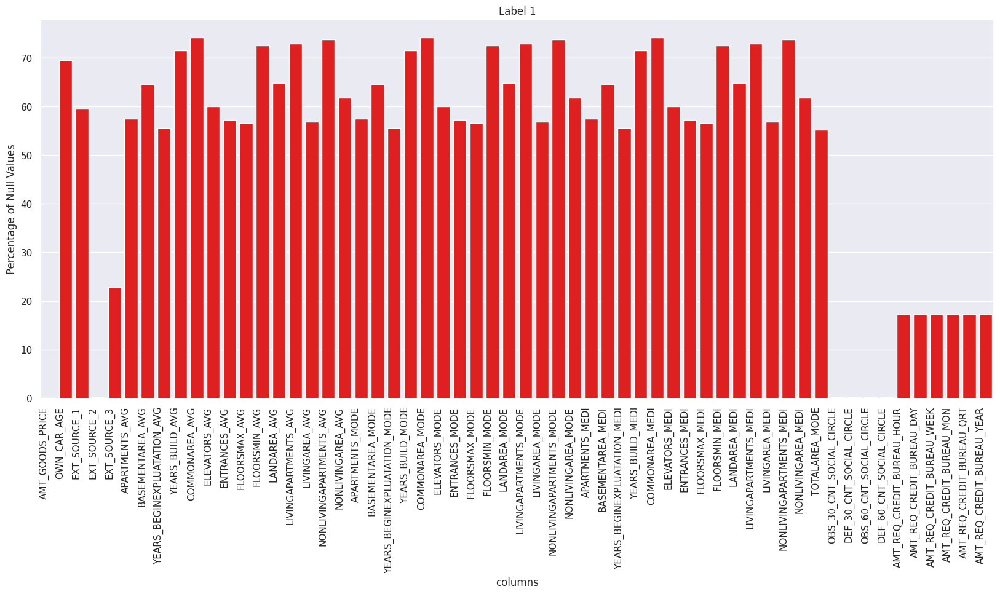

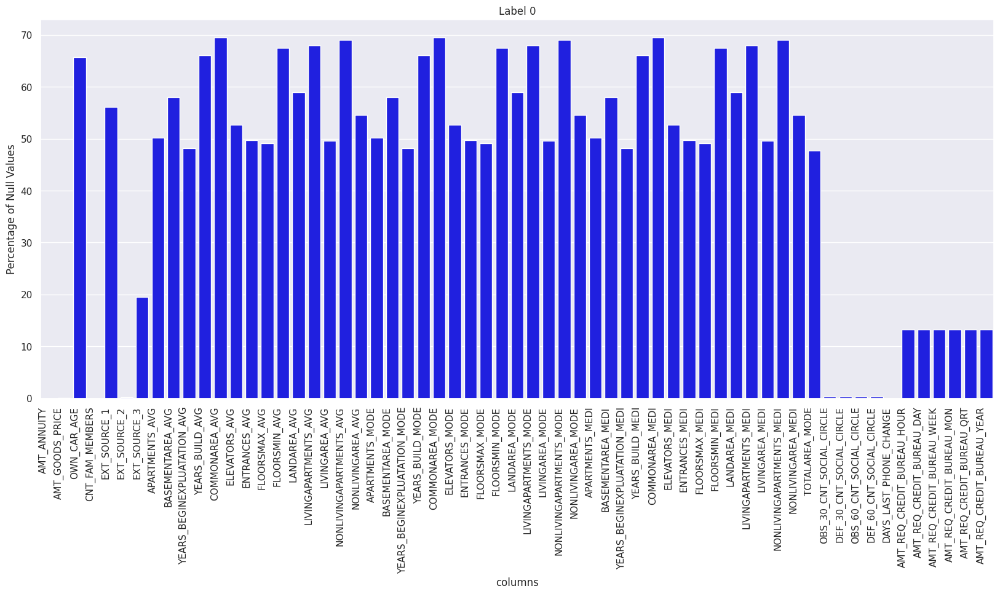

,percentage null values label 1,percentage null values label 0,difference percentages null values
SK_ID_CURR,0.00000,0.00000,0.00000
TARGET,0.00000,0.00000,0.00000
CNT_CHILDREN,0.00000,0.00000,0.00000
AMT_INCOME_TOTAL,0.00000,0.00000,0.00000
AMT_CREDIT,0.00000,0.00000,0.00000
AMT_ANNUITY,0.00000,0.00424,0.00424
AMT_GOODS_PRICE,0.08459,0.09091,0.00632
REGION_POPULATION_RELATIVE,0.00000,0.00000,0.00000
DAYS_REGISTRATION,0.00000,0.00000,0.00000
OWN_CAR_AGE,69.48238,65.68419,3.79819


************************************************************************************************************************
Plot Correlations


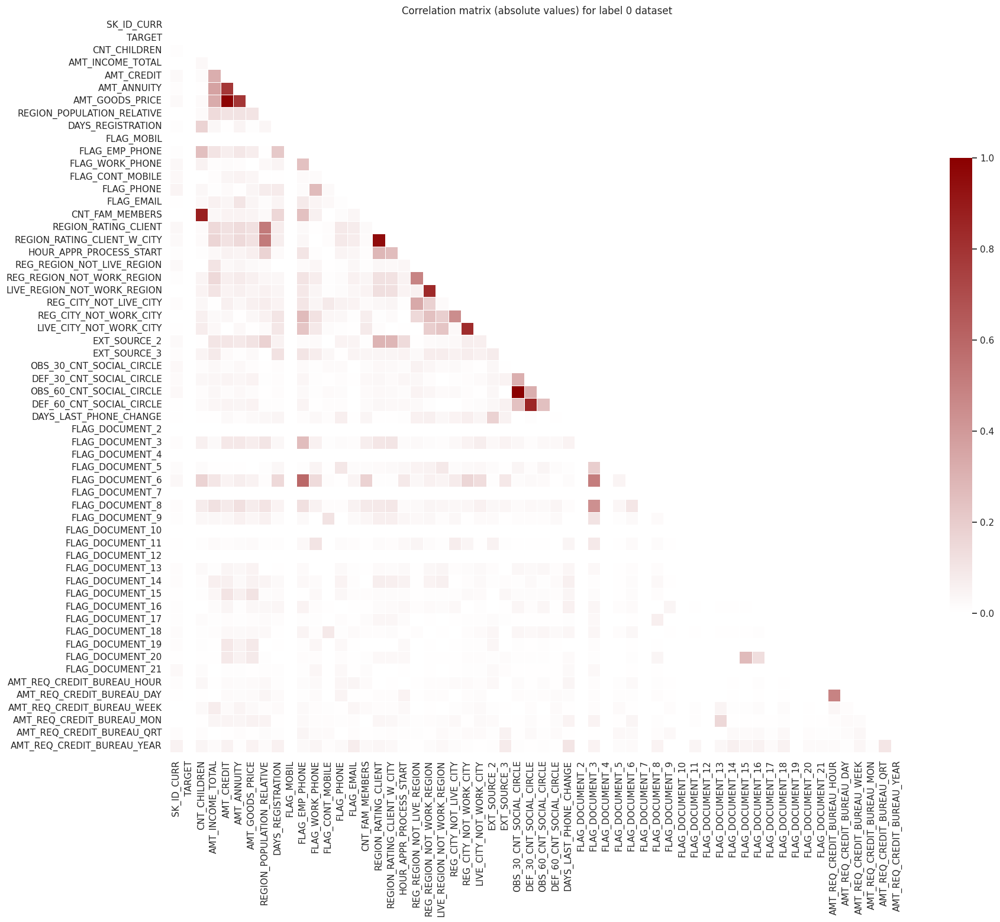

/home/amonroy/ambientes/spark/lib/python3.11/site-packages/pyspark/sql/dataframe.py:168: UserWarning: DataFrame.sql_ctx is an internal property, and will be removed in future releases. Use DataFrame.sparkSession instead.
  warnings.warn(
/home/amonroy/ambientes/spark/lib/python3.11/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable DAYS_BIRTH is large: 2556. Are you sure this is not an interval variable? Analysis for pairs of variables including DAYS_BIRTH can be slow.
  warnings.warn(
/home/amonroy/ambientes/spark/lib/python3.11/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable DAYS_EMPLOYED is large: 1769. Are you sure this is not an interval variable? Analysis for pairs of variables including DAYS_EMPLOYED can be slow.
  warnings.warn(
/home/amonroy/ambientes/spark/lib/python3.11/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable DAYS_ID_PUBLISH is large: 2122.

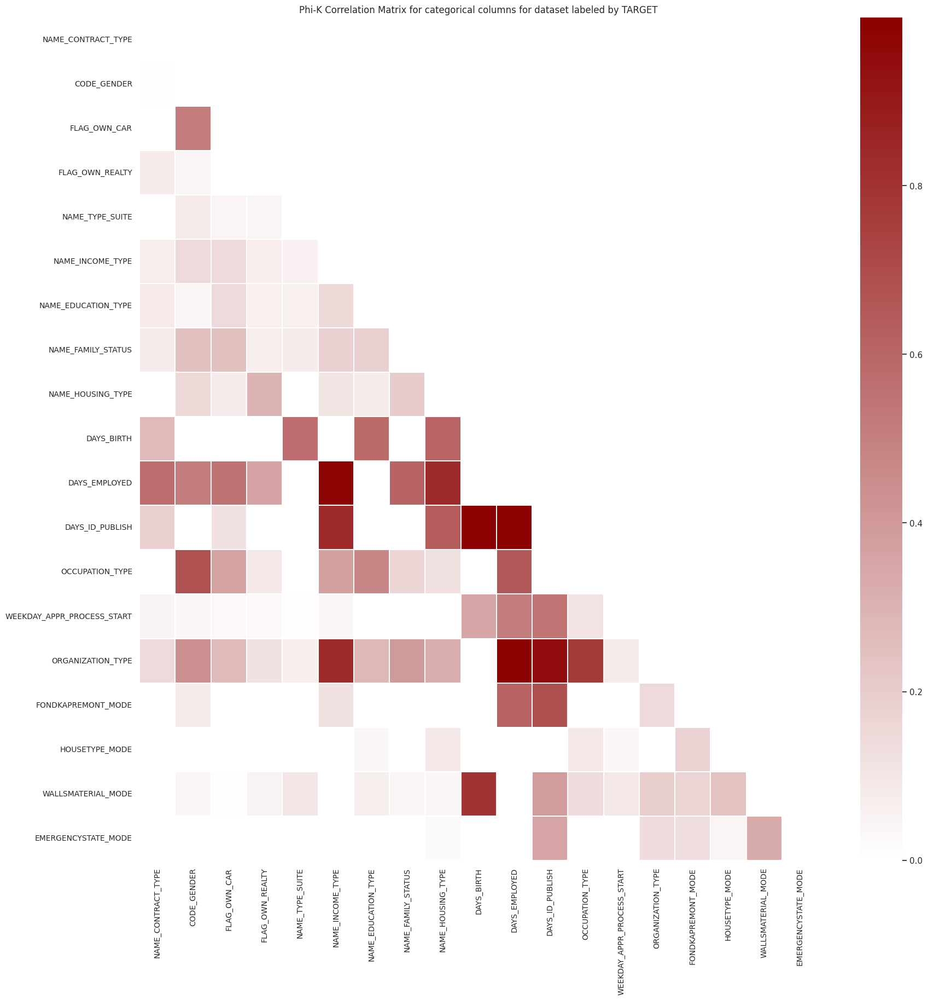

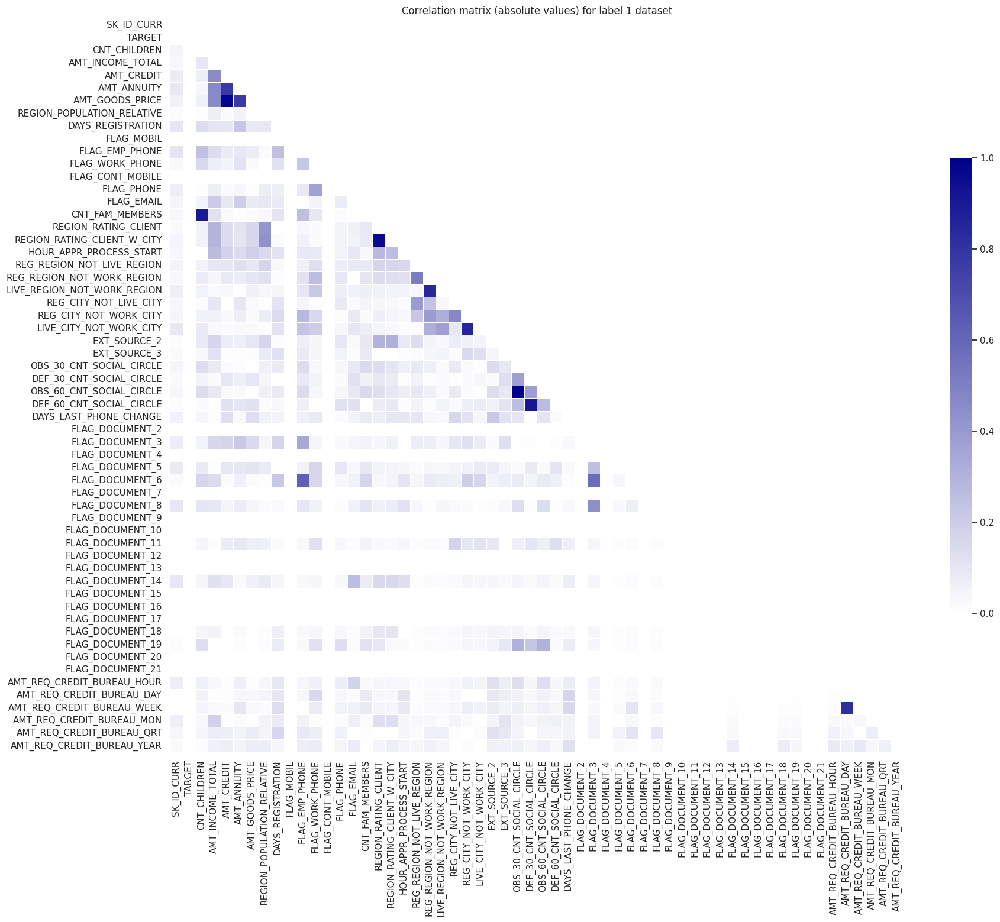

/home/amonroy/ambientes/spark/lib/python3.11/site-packages/pyspark/sql/dataframe.py:168: UserWarning: DataFrame.sql_ctx is an internal property, and will be removed in future releases. Use DataFrame.sparkSession instead.
  warnings.warn(


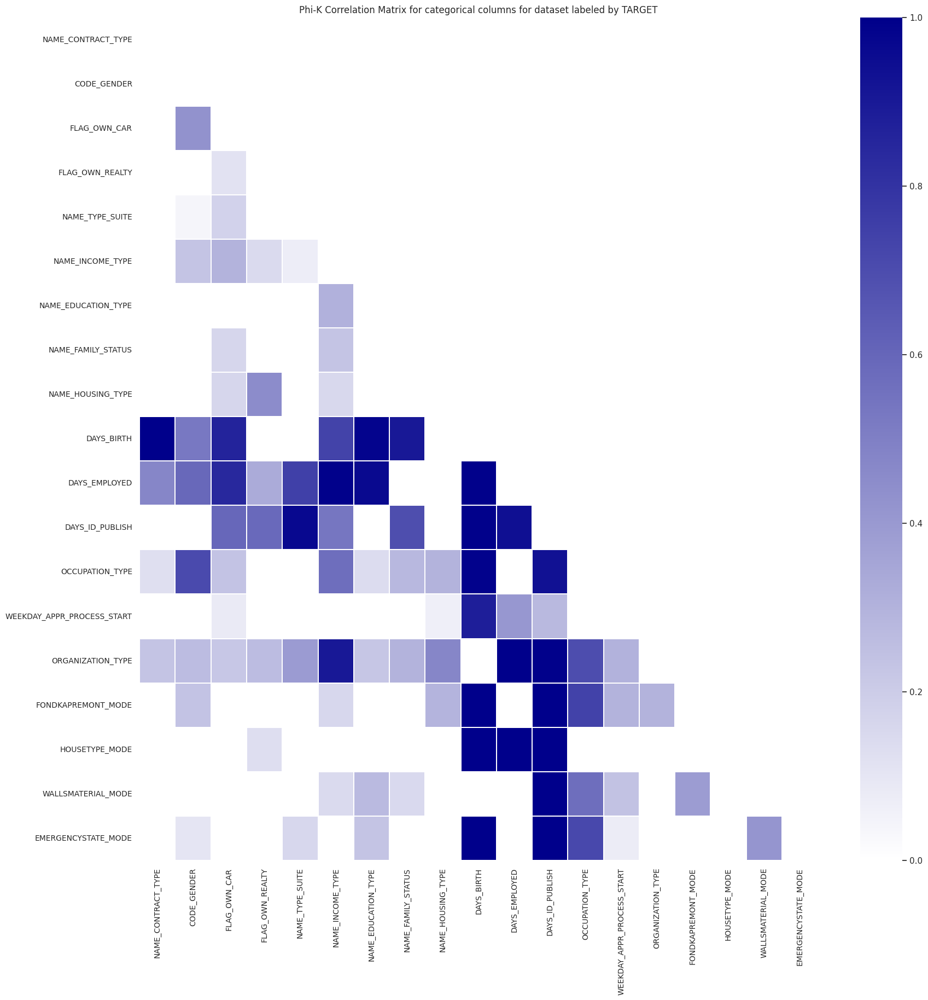

************************************************************************************************************************
Drop irrelevant columns based on correlations...Finished
************************************************************************************************************************
Outlier analysis...


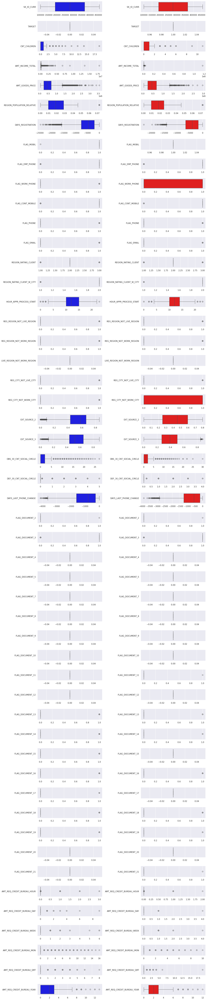

************************************************************************************************************************ 



************************************************************************************************************************
Visualize data...


/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

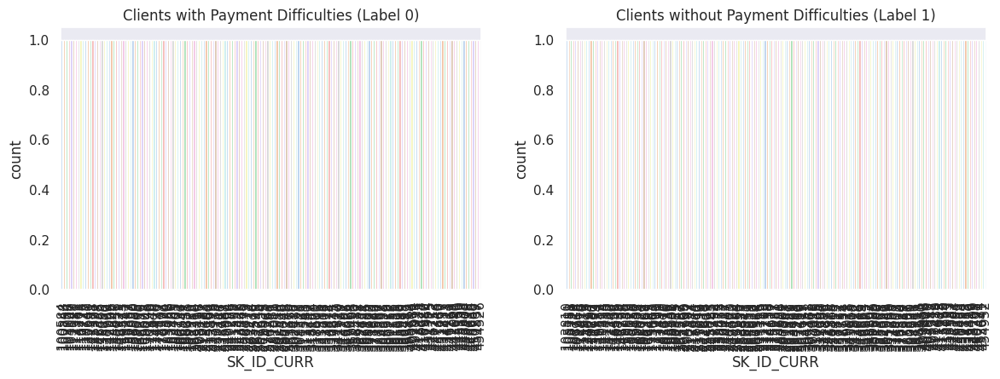

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

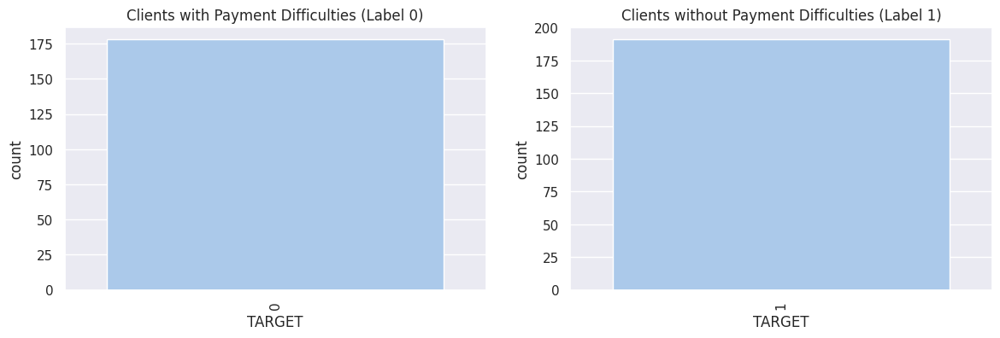

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

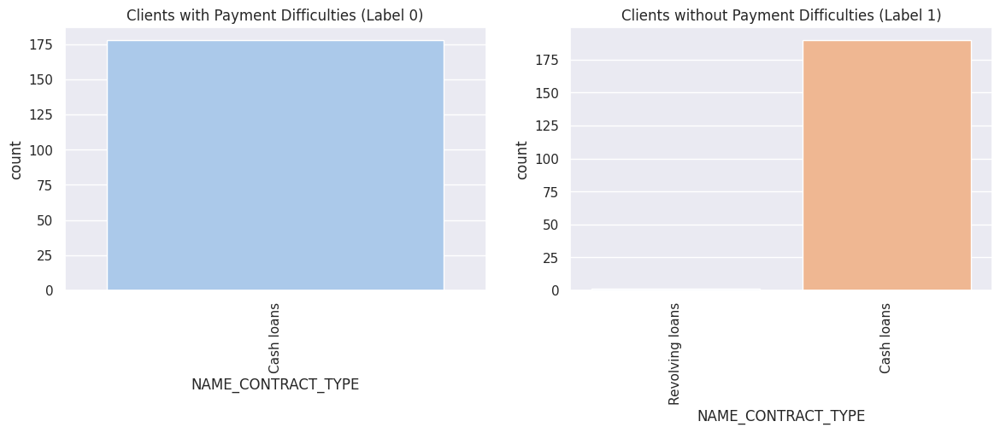

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

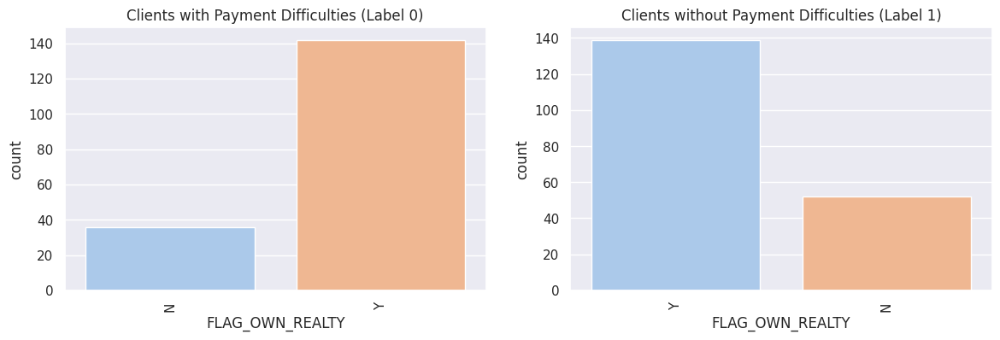

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

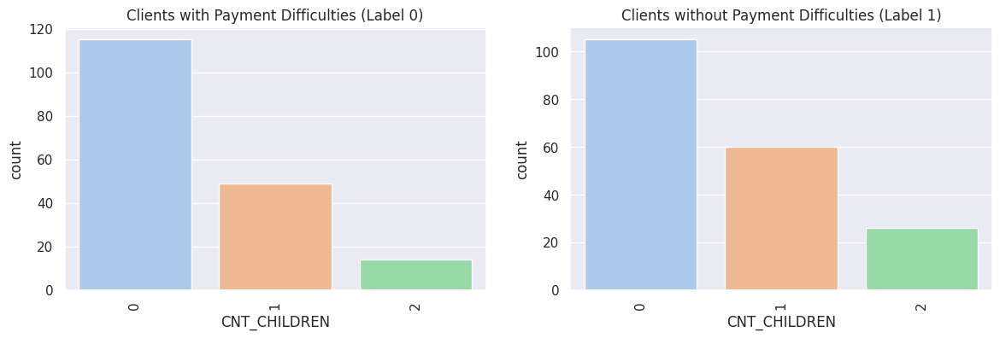

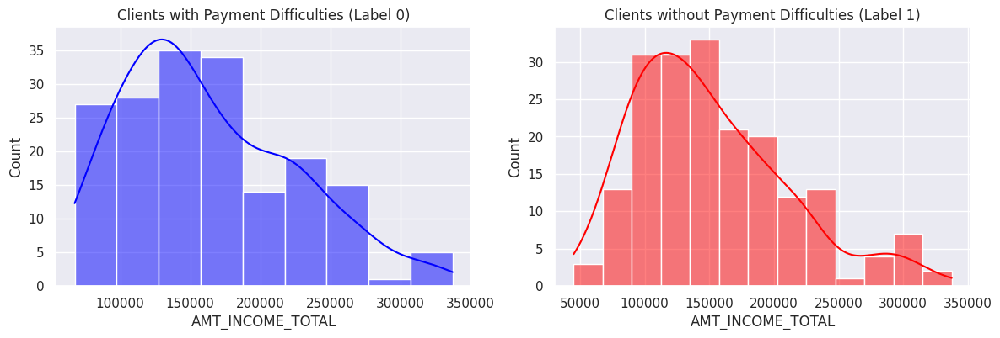

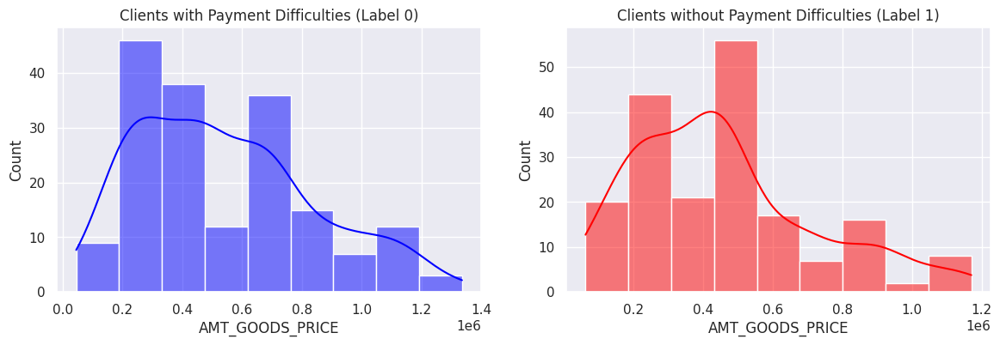

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

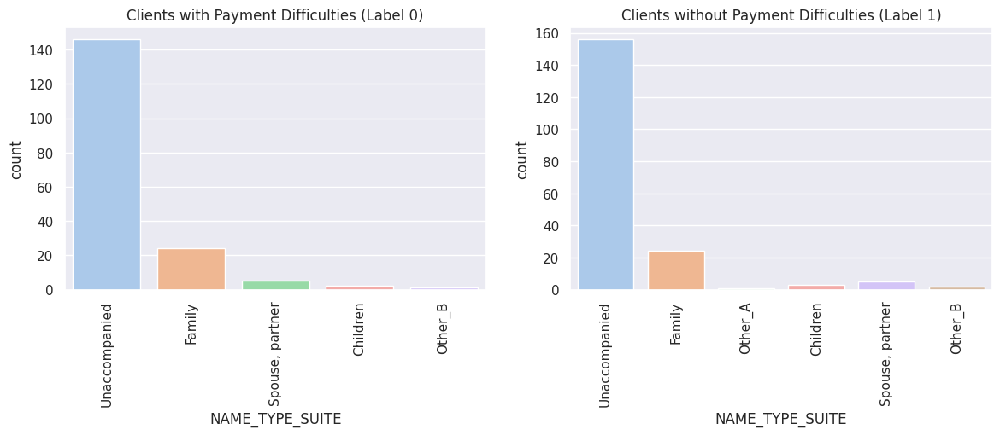

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

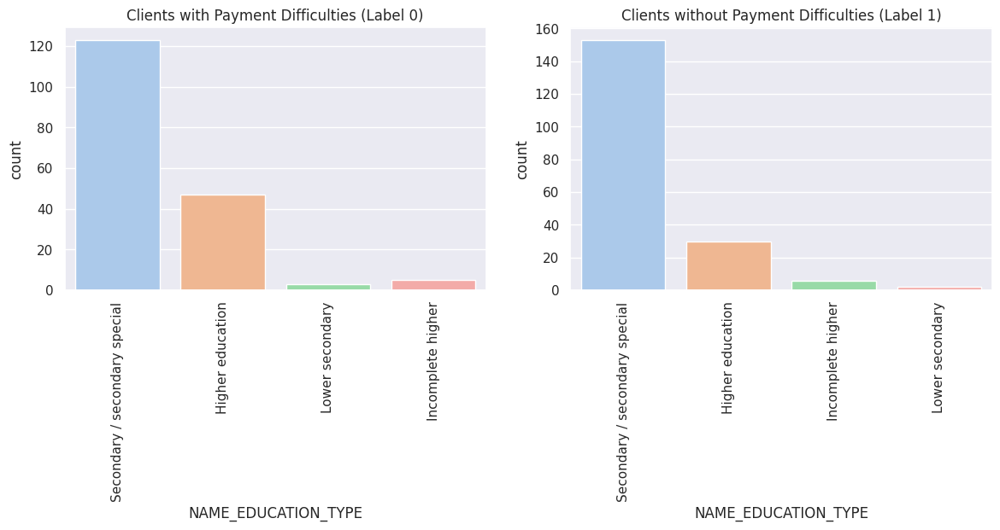

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

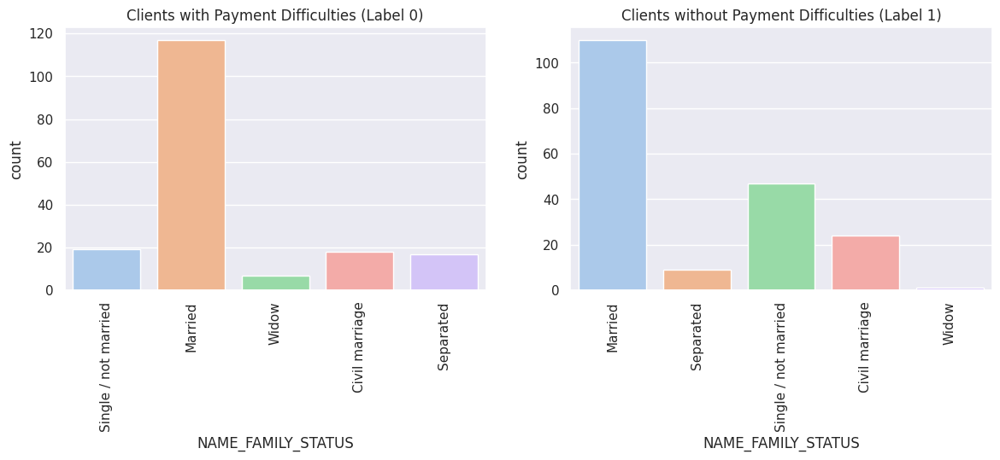

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

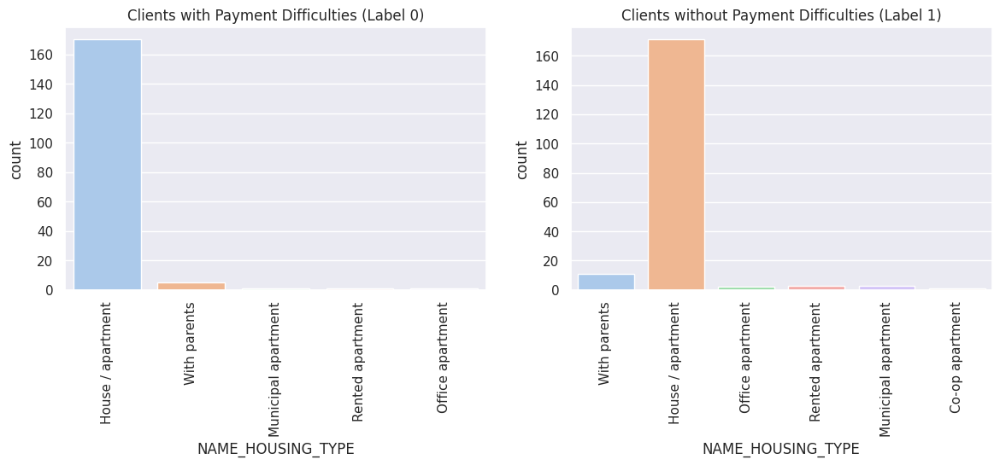

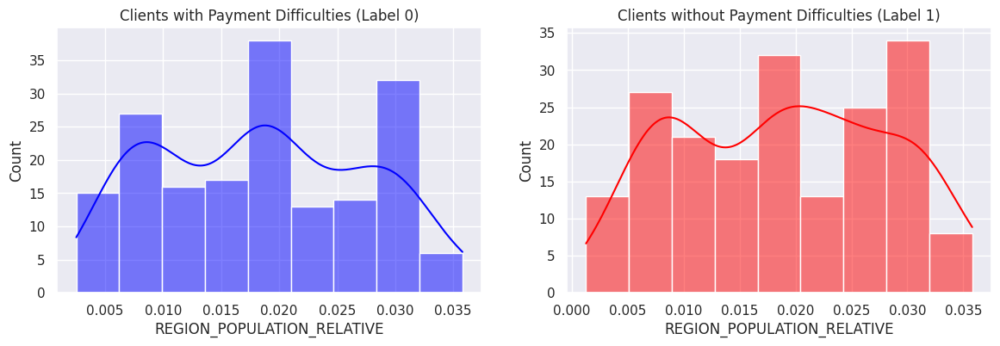

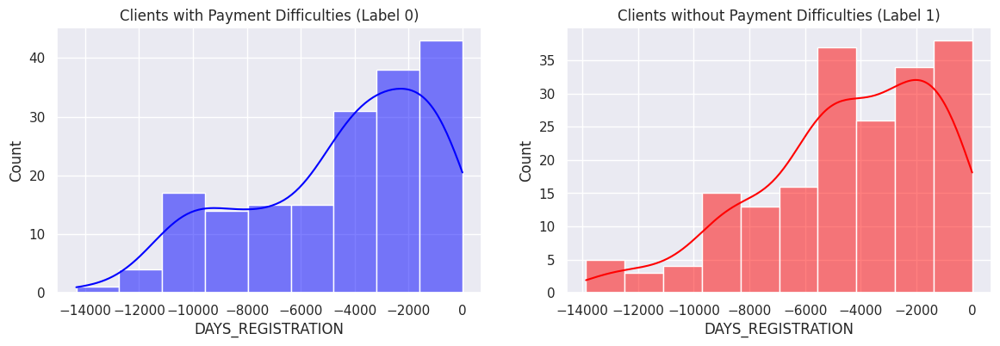

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

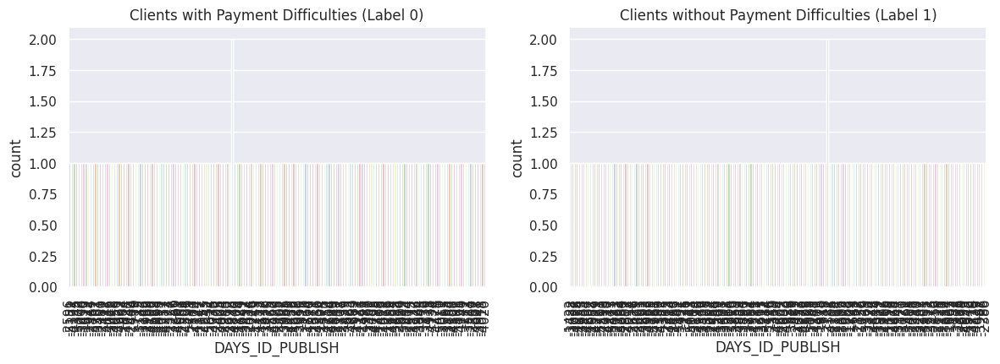

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

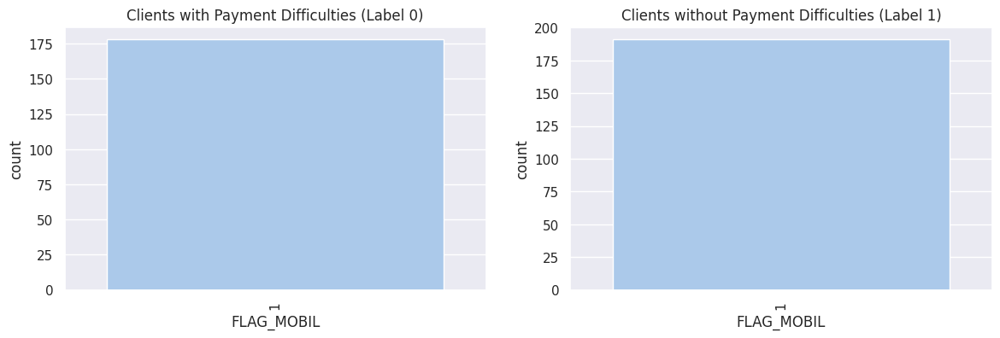

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

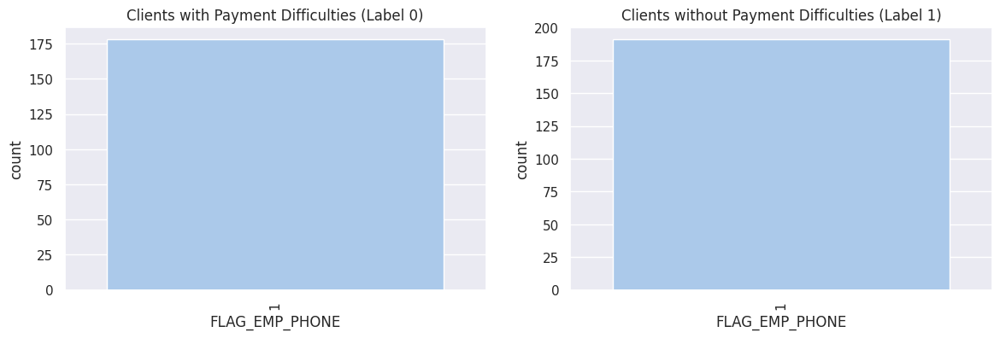

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

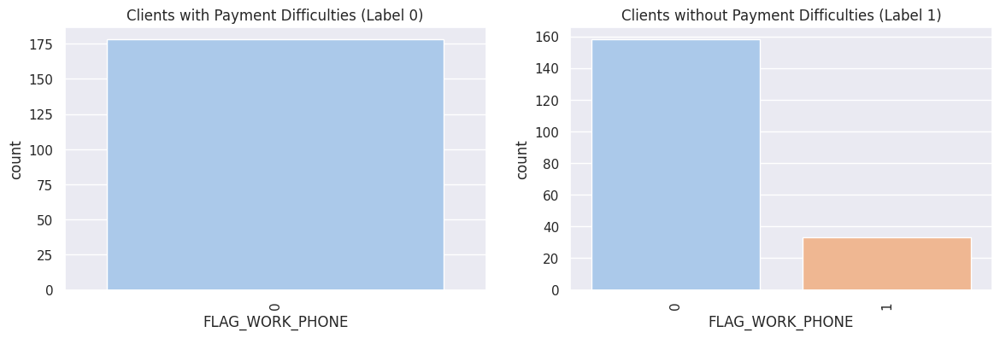

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

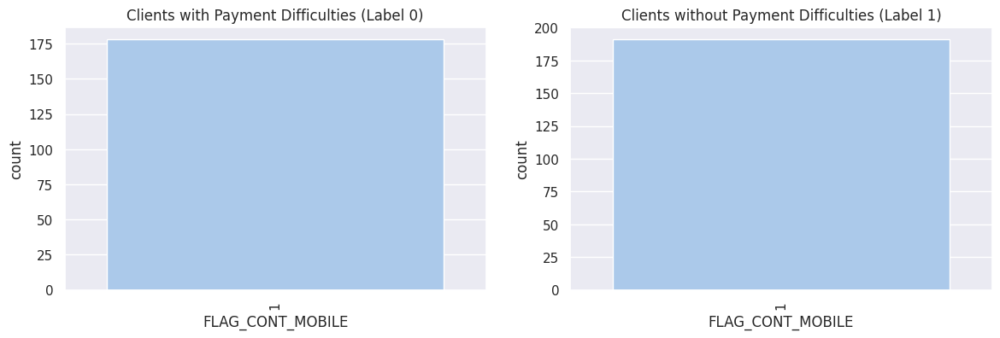

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

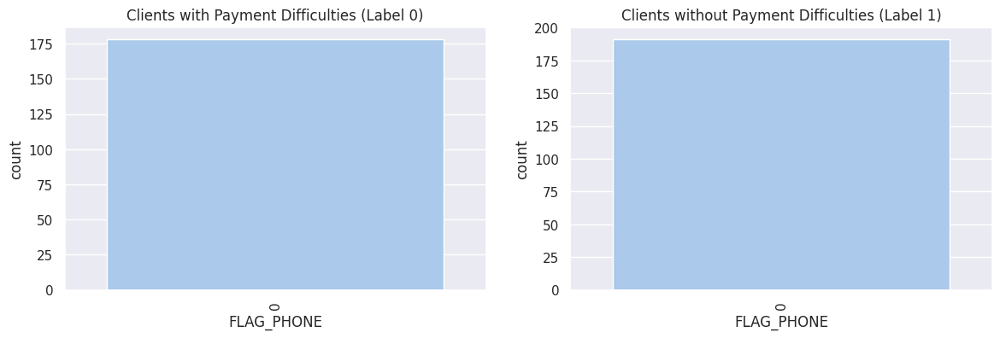

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

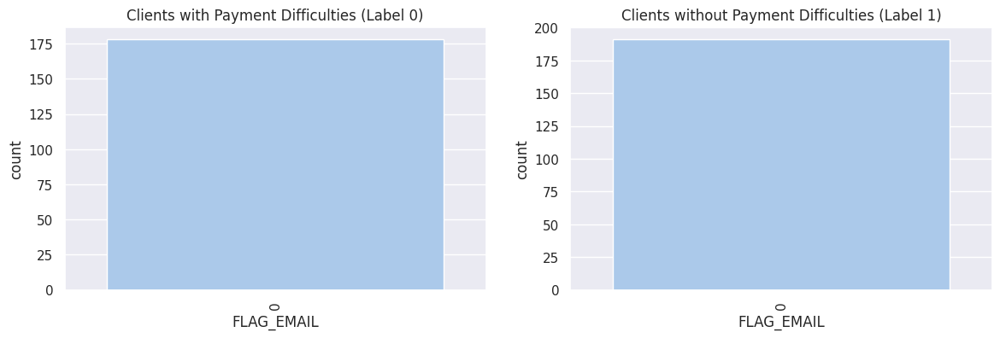

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

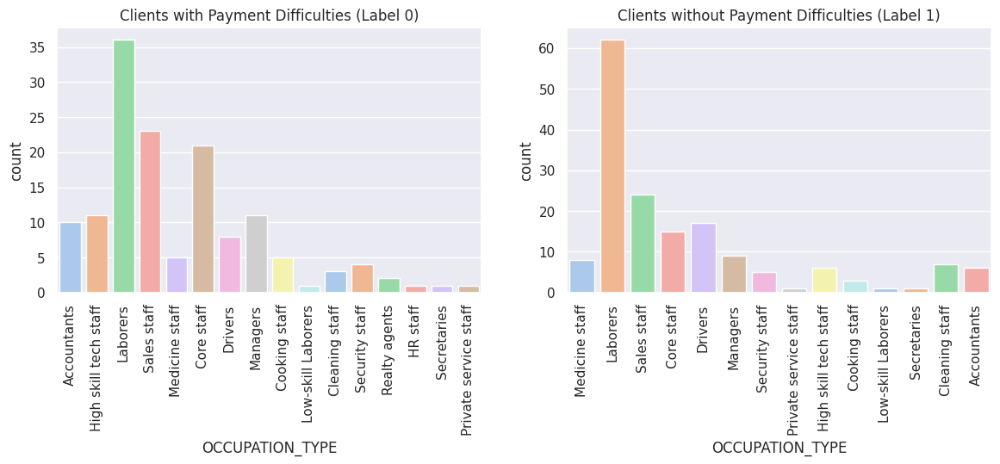

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

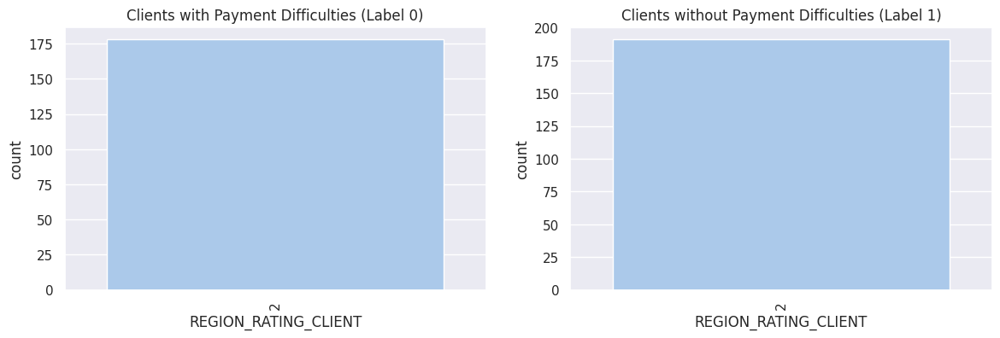

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

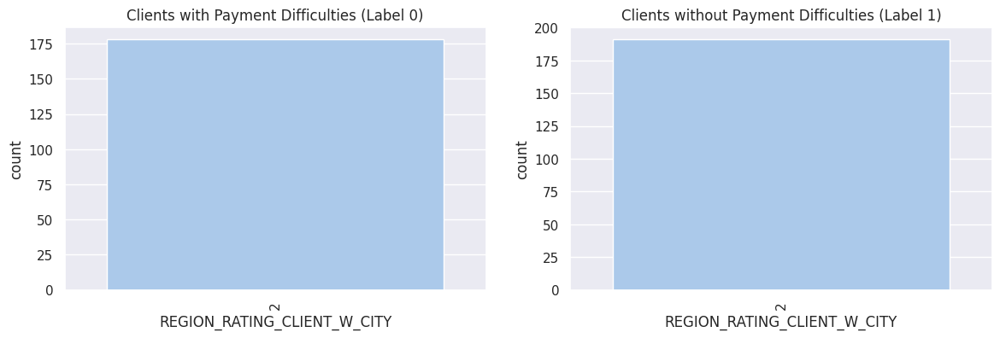

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

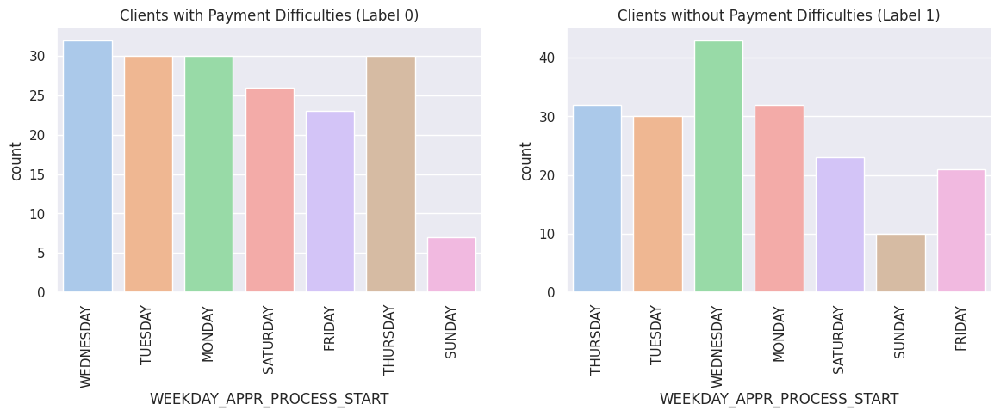

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

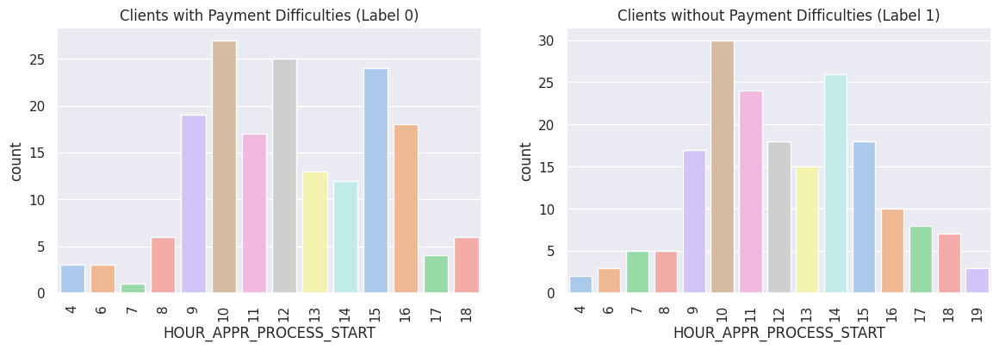

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

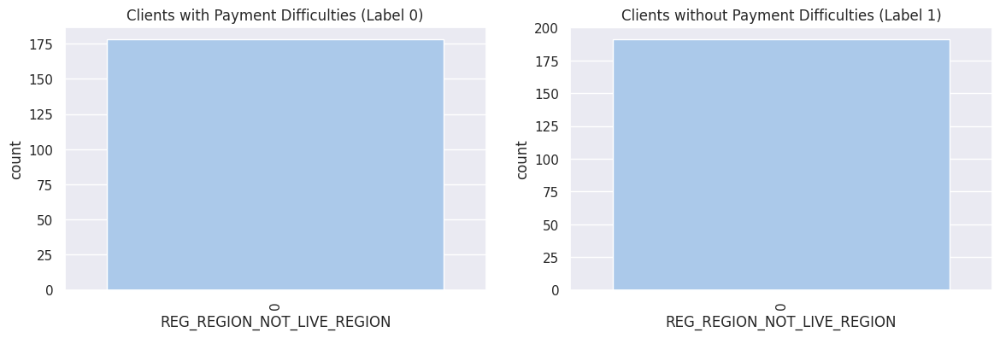

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

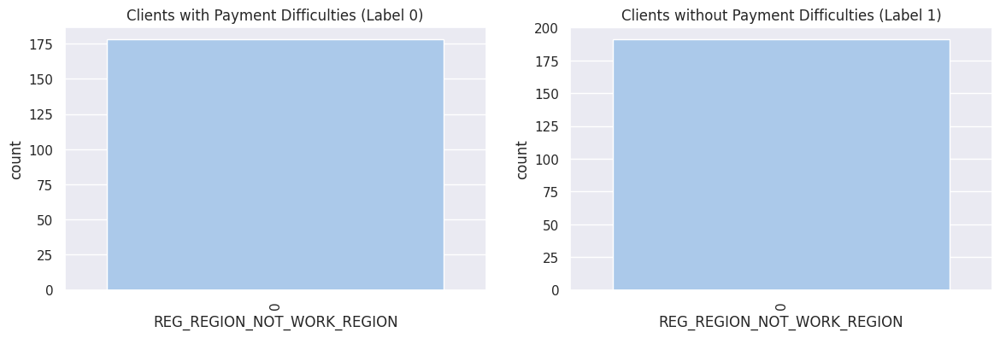

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

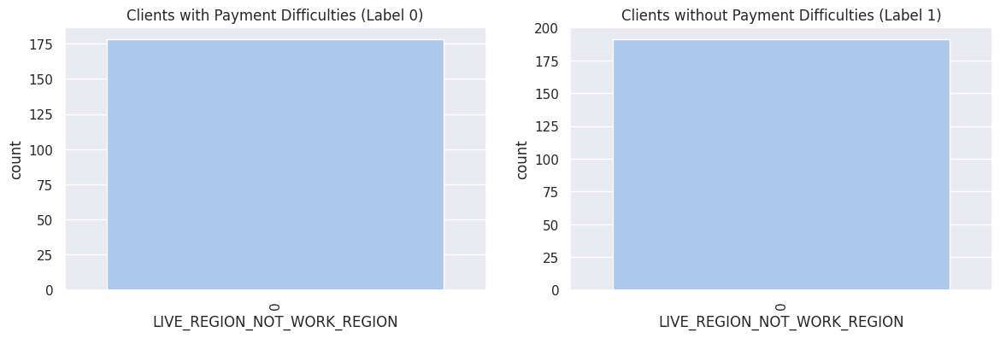

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

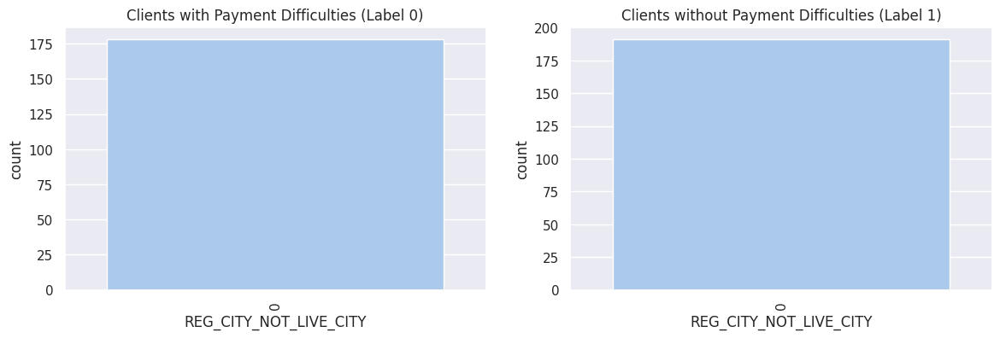

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

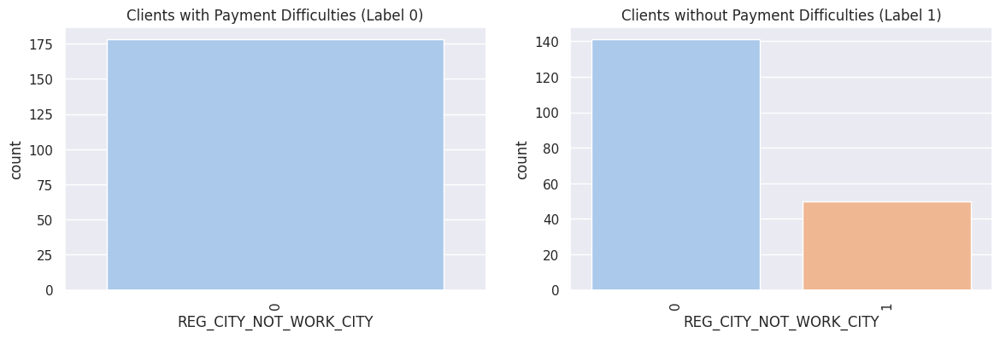

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

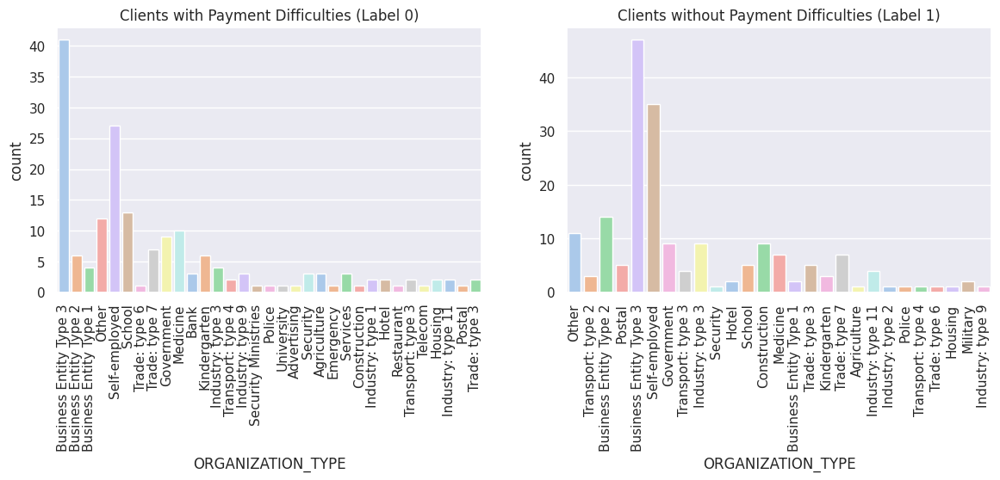

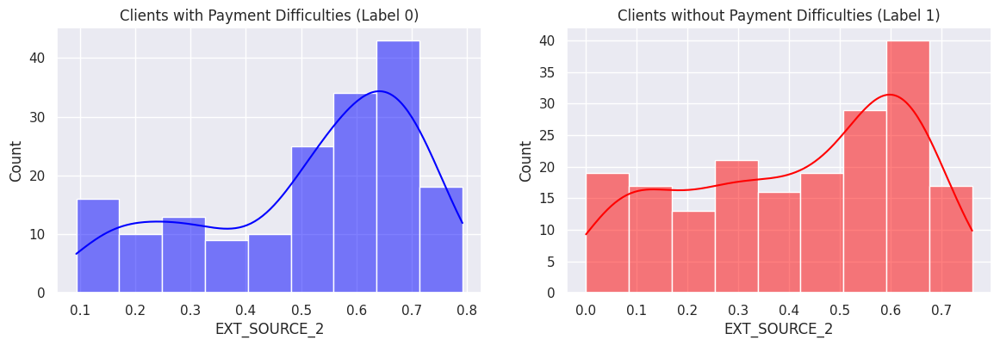

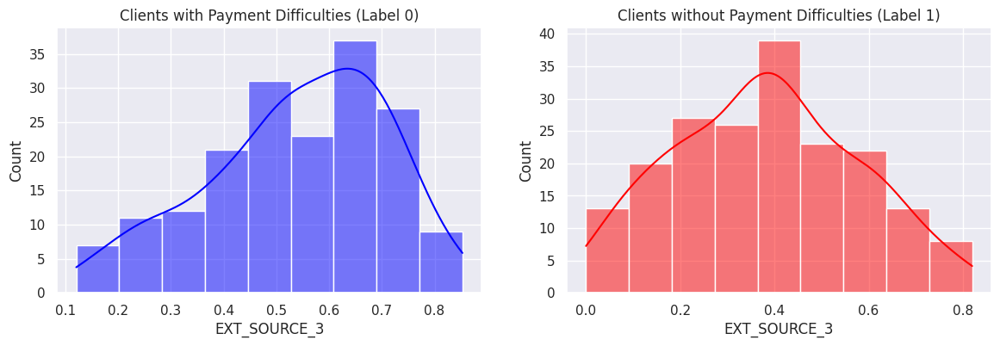

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

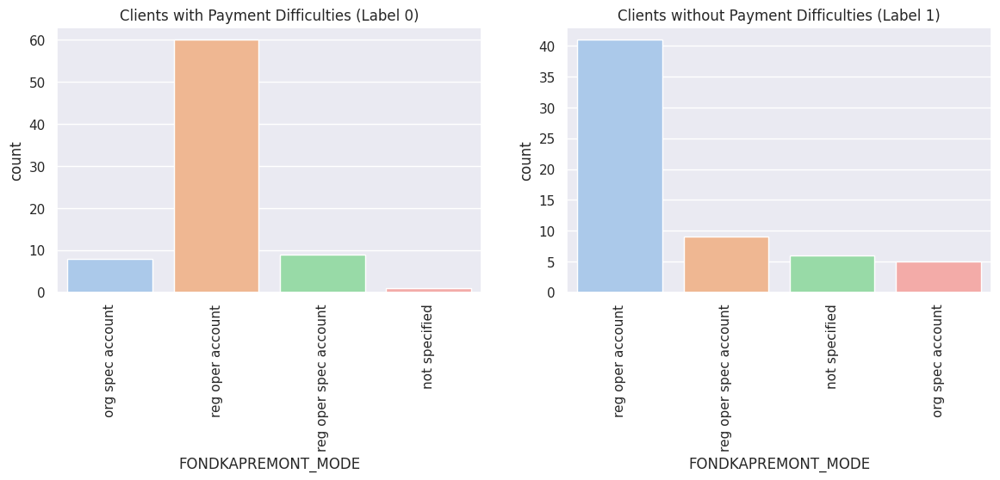

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

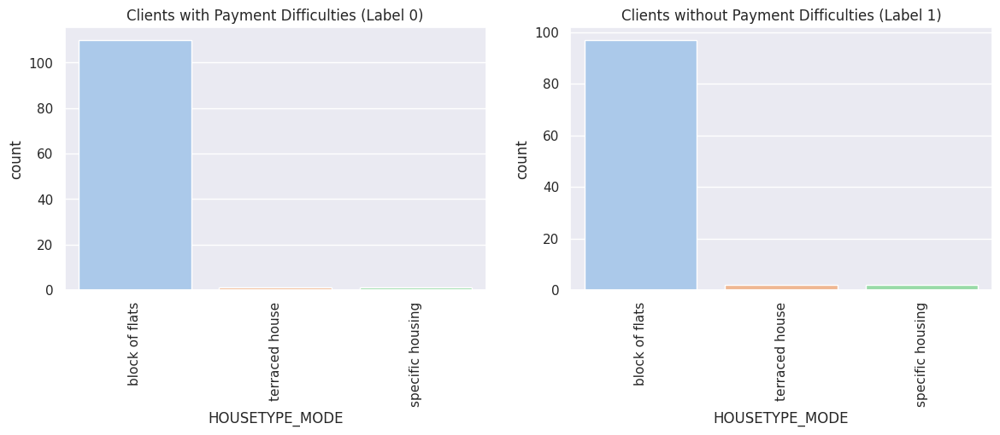

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

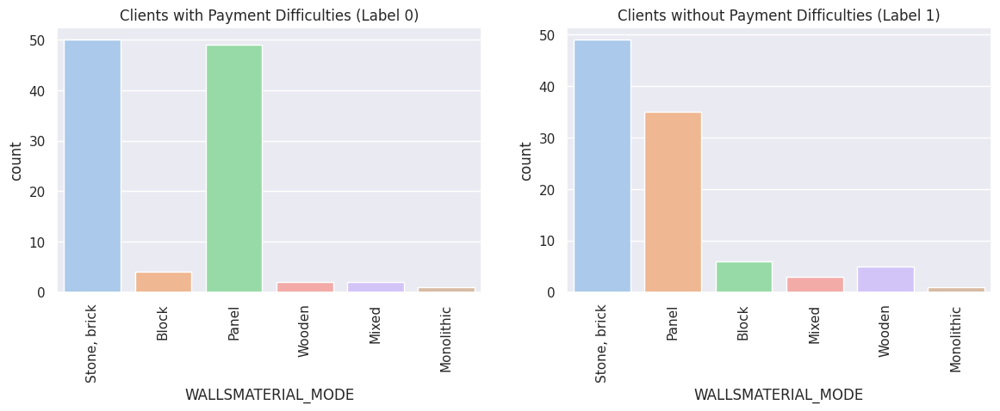

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

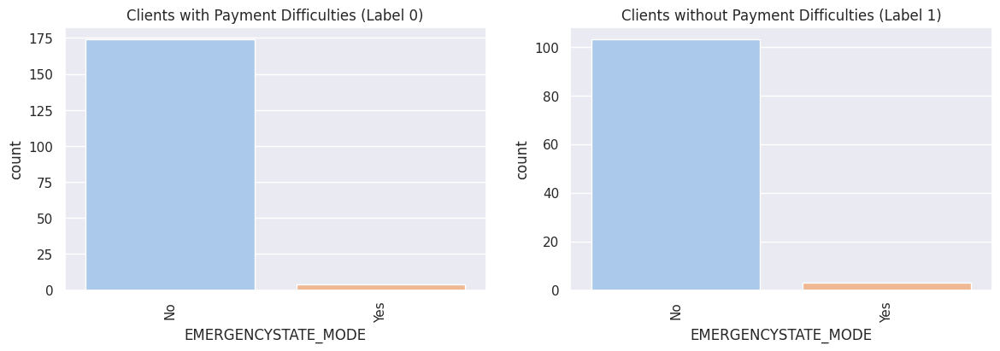

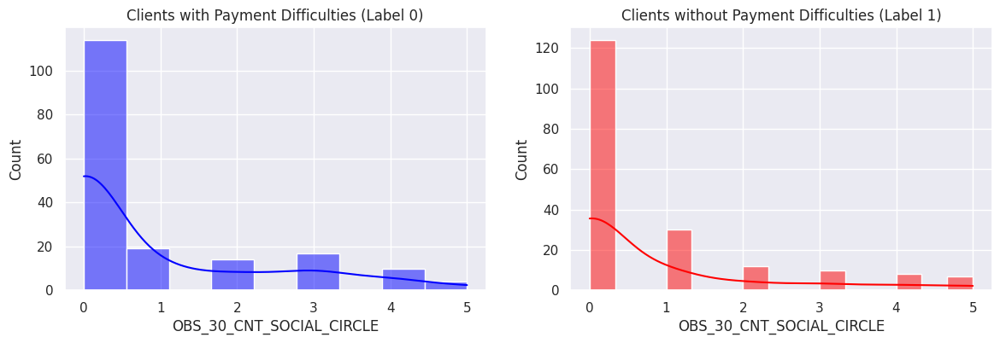

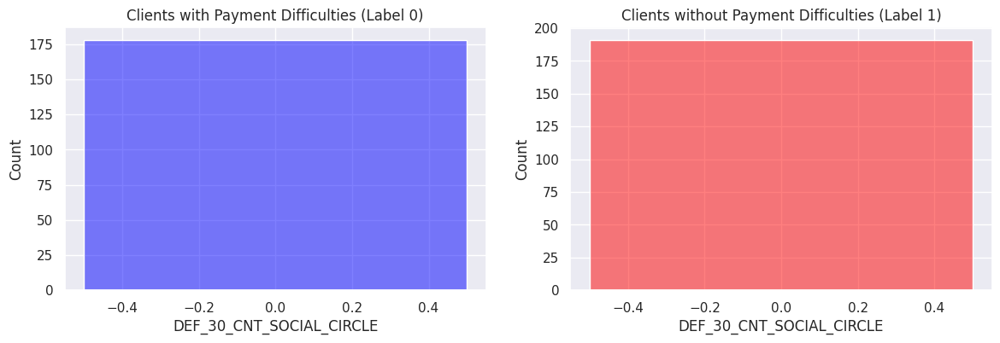

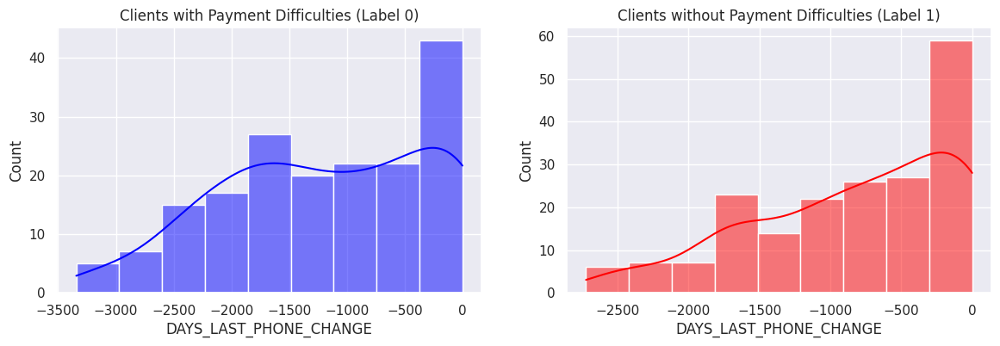

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

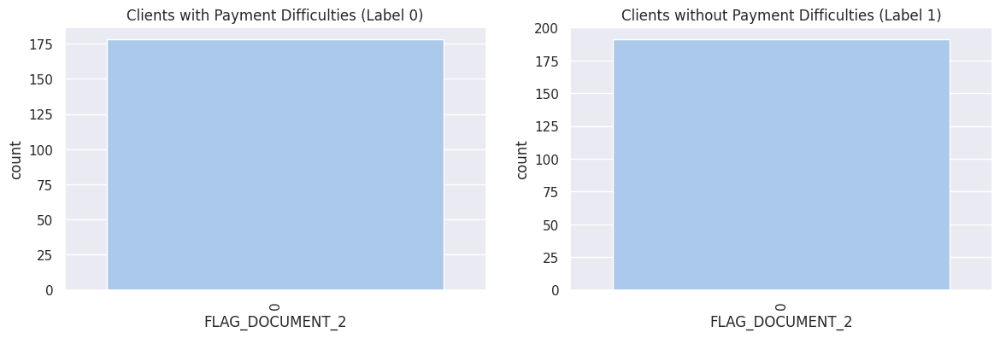

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

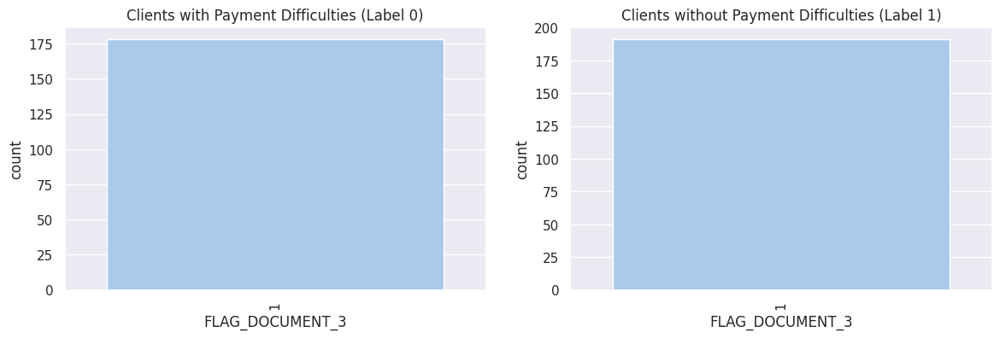

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

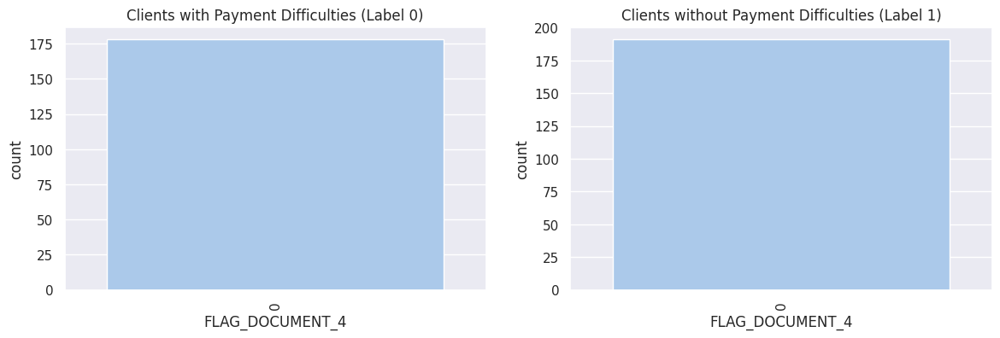

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

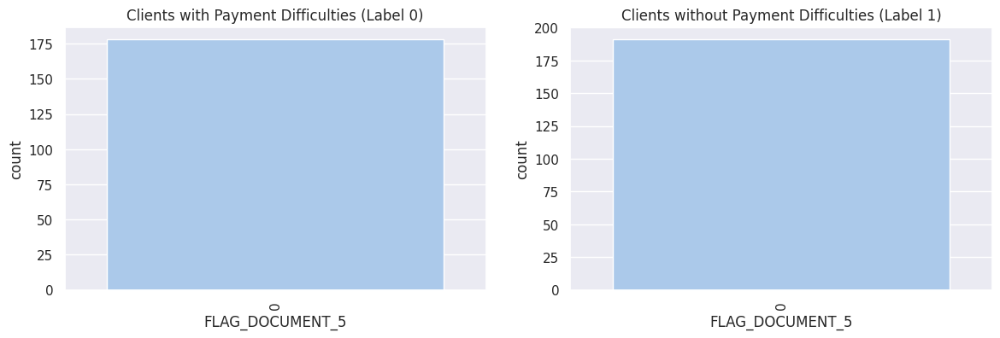

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

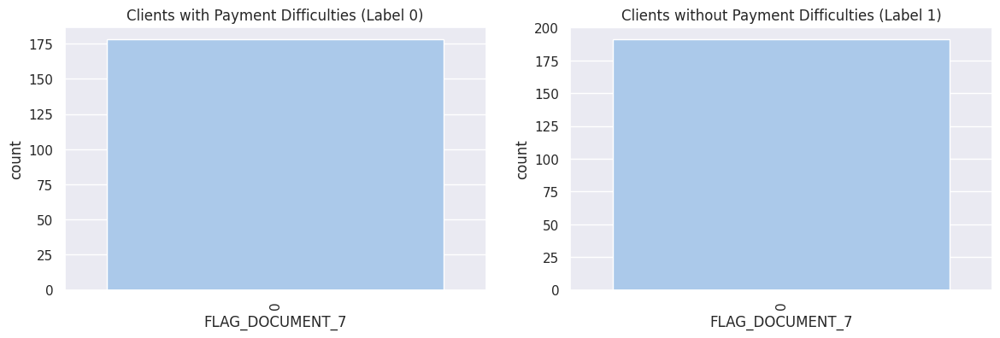

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

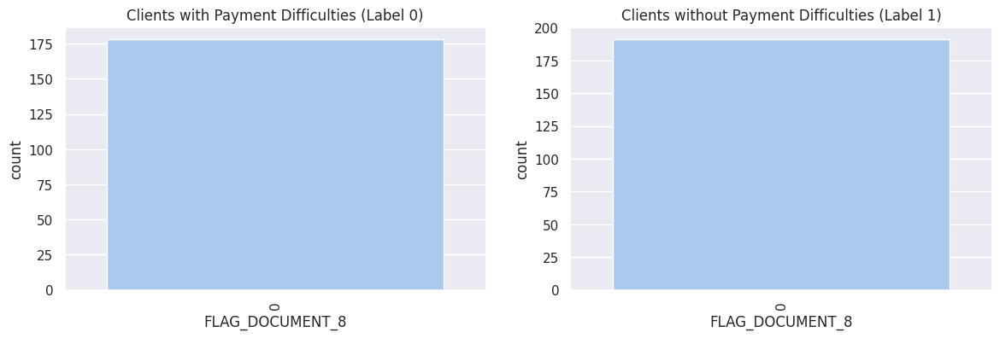

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

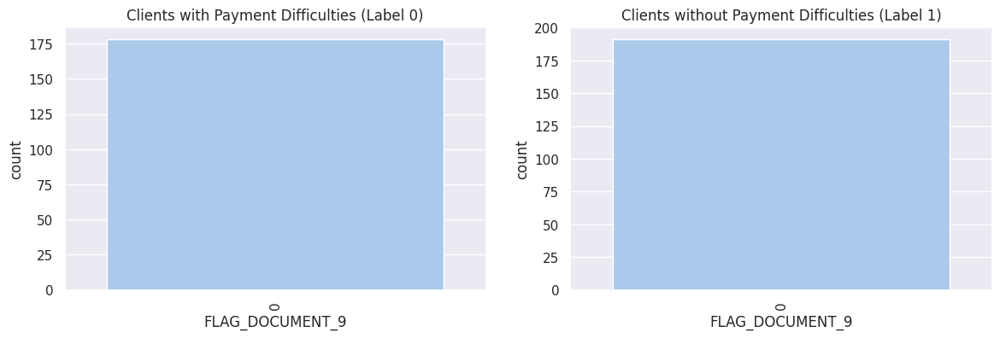

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

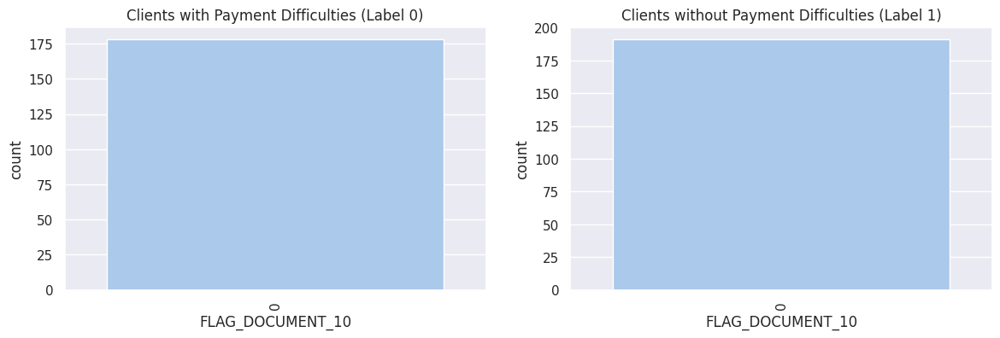

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

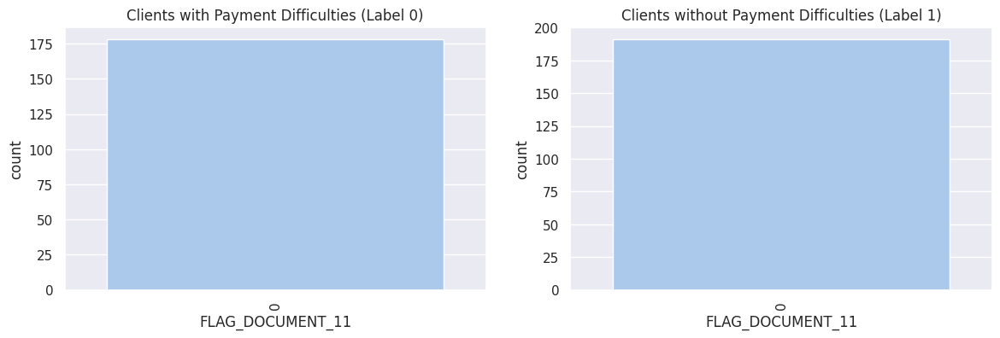

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

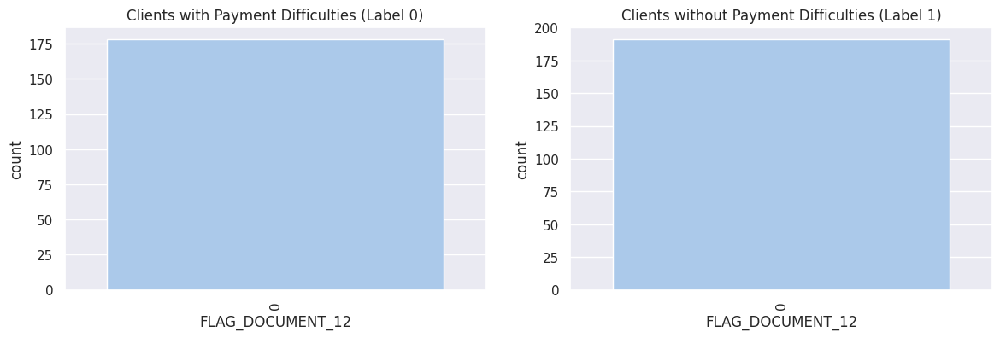

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

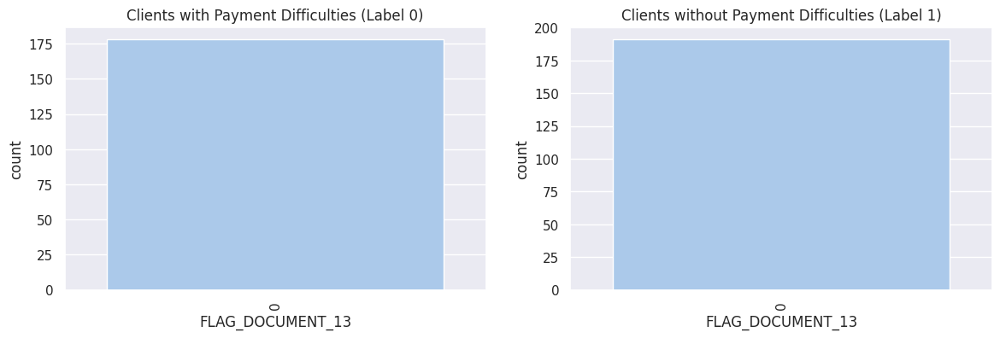

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

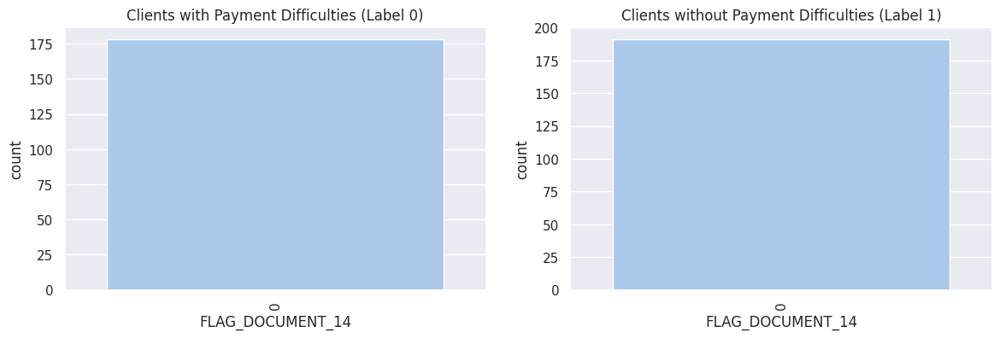

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

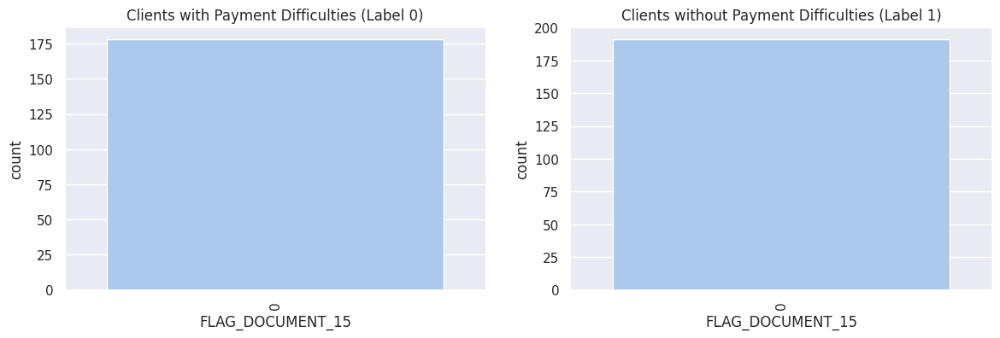

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

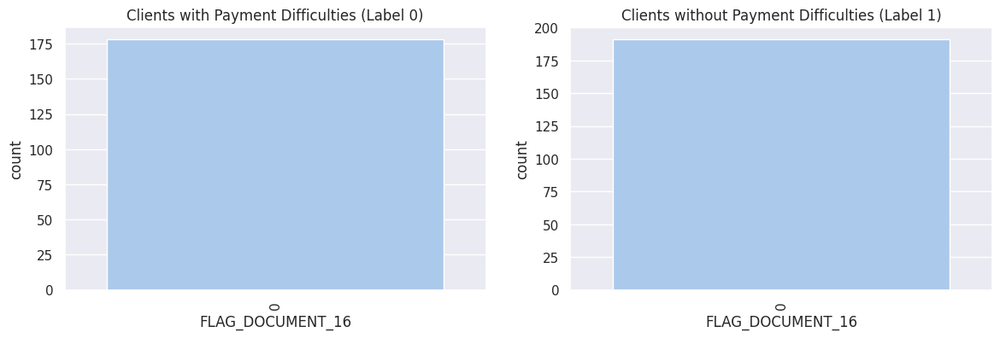

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

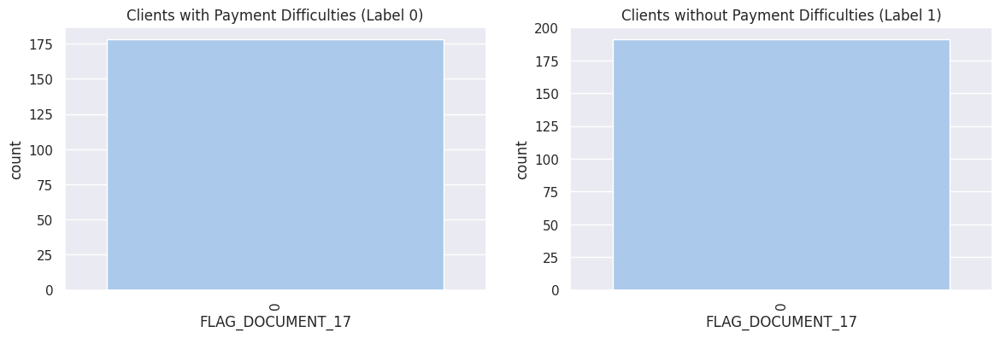

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

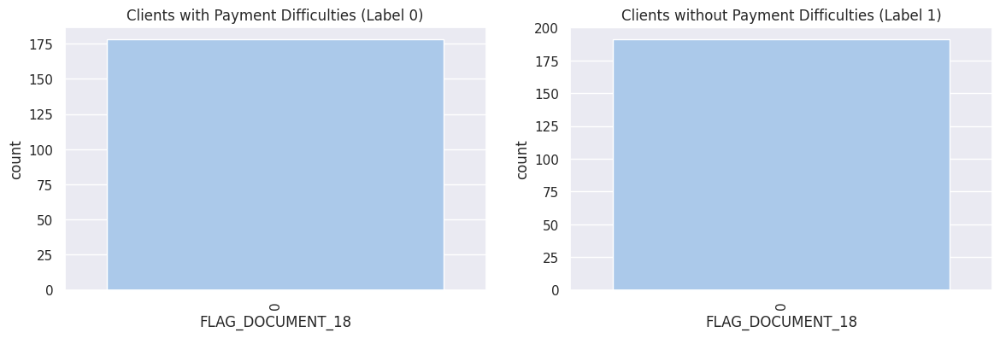

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

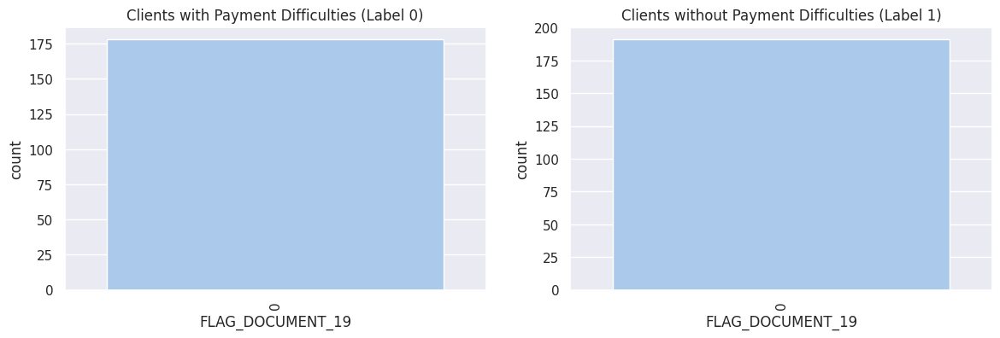

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

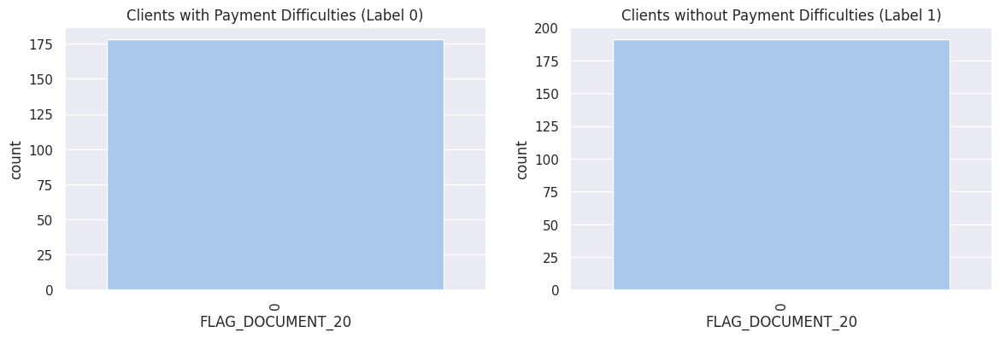

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

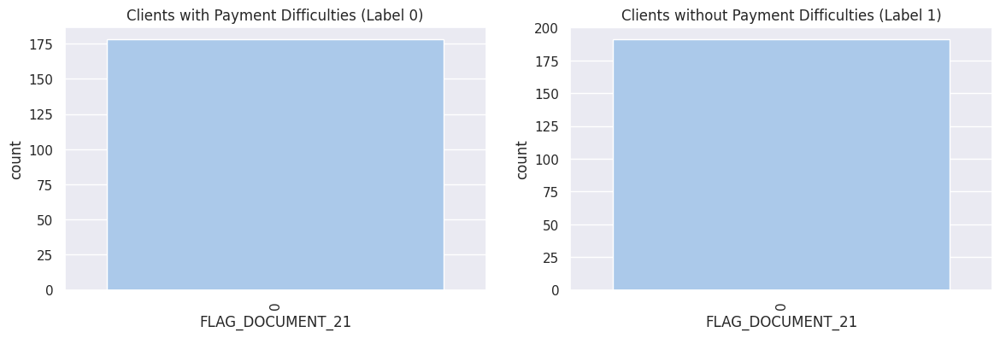

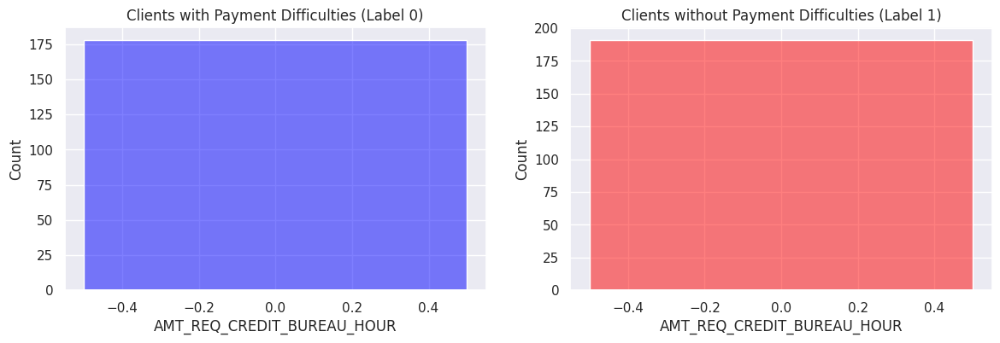

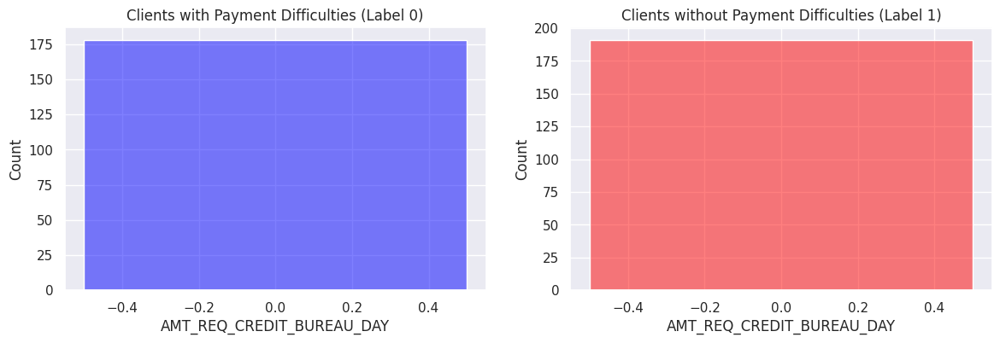

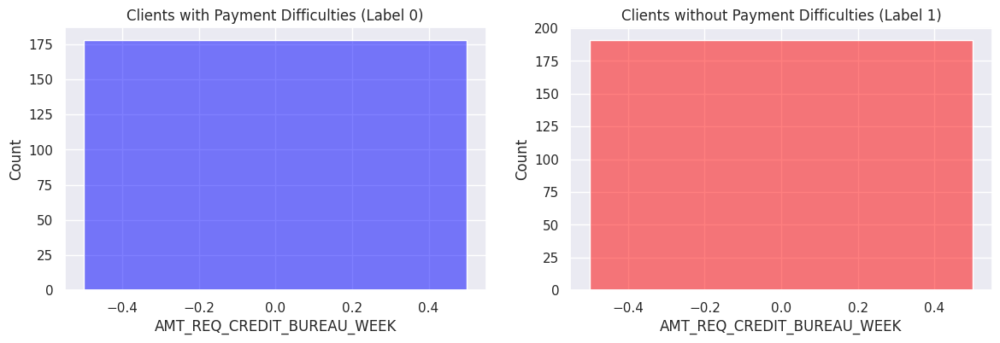

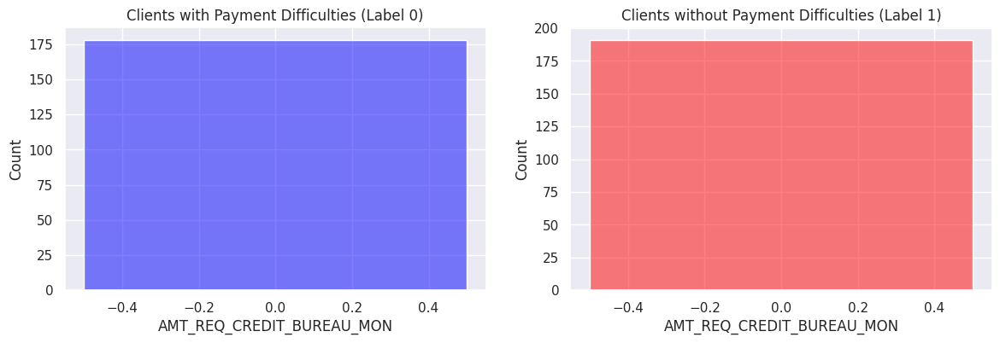

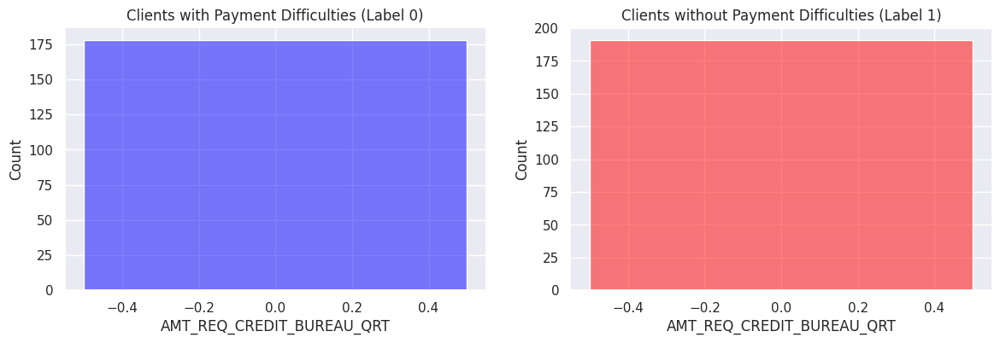

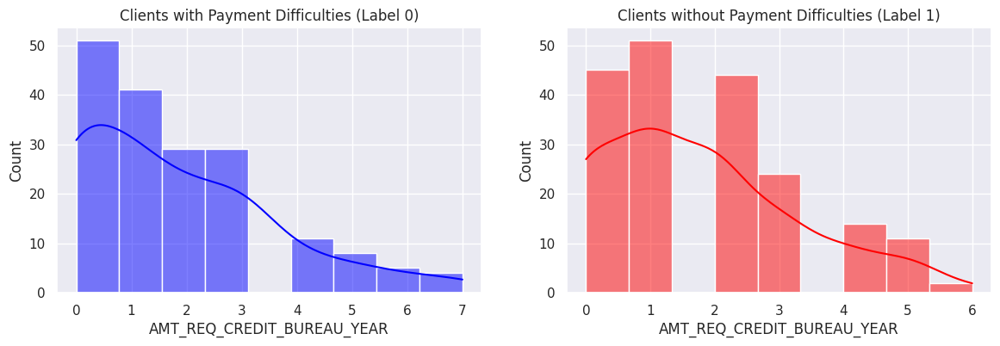

************************************************************************************************************************ 



FINISHED


In [5]:
application_df.createOrReplaceTempView('applicacion_')

application0, application1= eda_pipeline(application_df,'applicacion_',  target_column='TARGET',
                                         id_columns=['SK_ID_CURR'],fillNulls_numerical=True, fillNulls_categorical=True, dropIrrelevantCols=True)

### Conclusions:
1. Many columns have a percentage of null values greater than 50% without any relation to the target labels; therefore, they were removed.
2. From the correlation plots, highly correlated columns were removed where there is no significant difference between labels.
3. The CNT_SOCIAL_CIRCLE columns are the most correlated columns with the target columns.
4. The FLAG_CONT_MOBILE and FLAG_DOCUMENT_N columns (except 3, 6, 8) was removed because they are very similar for each label
5. Using the  blox plots the outliers were eliminated
6. The AMT_REQ_... columns were sistemactically non-filled

## Previous Application dataframe

### EDA 

************************************************************************************************************************
Correcting the data type of the dataframe columns...Finished
 ************************************************************************************************************************
Split the dataframe based on labels...Finished
 ************************************************************************************************************************
Analysis of null values...


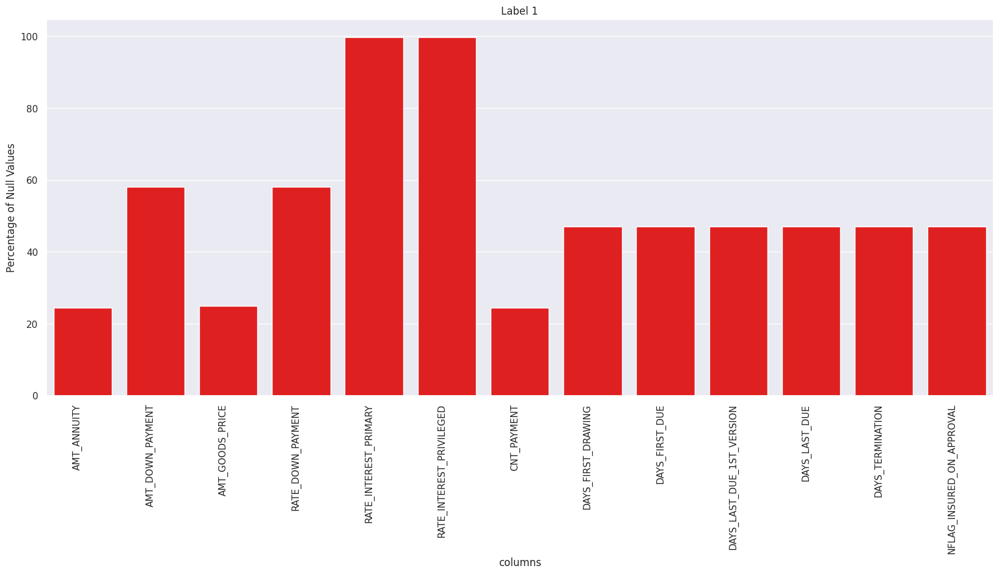

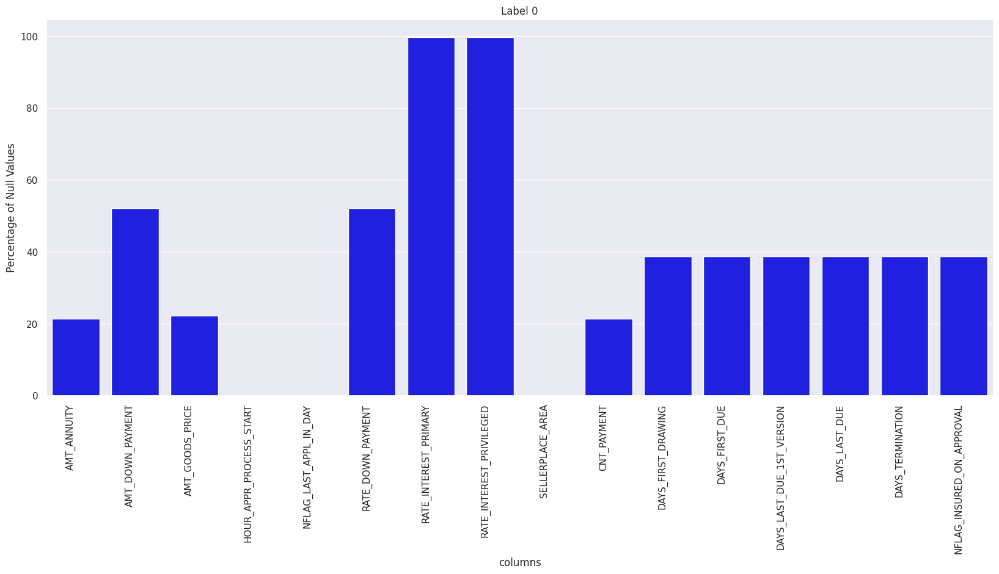

,percentage null values label 1,percentage null values label 0,difference percentages null values
SK_ID_PREV,0.00000,0.00000,0.00000
SK_ID_CURR,0.00000,0.00000,0.00000
AMT_ANNUITY,24.35614,21.35656,2.99958
AMT_APPLICATION,0.00000,0.00000,0.00000
AMT_CREDIT,0.00000,0.00000,0.00000
AMT_DOWN_PAYMENT,58.00433,52.10400,5.90033
AMT_GOODS_PRICE,24.84933,22.21126,2.63807
HOUR_APPR_PROCESS_START,0.00000,0.00012,0.00012
NFLAG_LAST_APPL_IN_DAY,0.00000,0.00012,0.00012
RATE_DOWN_PAYMENT,58.00433,52.10400,5.90033


************************************************************************************************************************
Plot Correlations


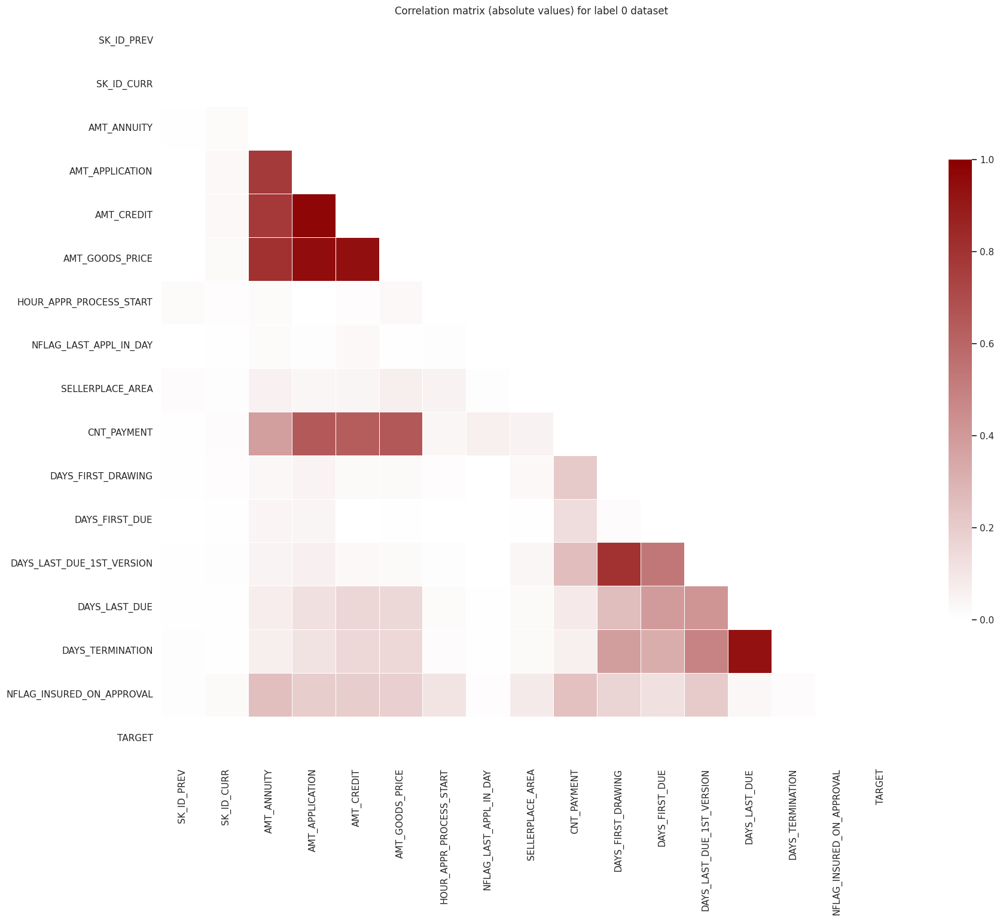

/home/amonroy/ambientes/spark/lib/python3.11/site-packages/pyspark/sql/dataframe.py:168: UserWarning: DataFrame.sql_ctx is an internal property, and will be removed in future releases. Use DataFrame.sparkSession instead.
  warnings.warn(
/home/amonroy/ambientes/spark/lib/python3.11/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable DAYS_DECISION is large: 2449. Are you sure this is not an interval variable? Analysis for pairs of variables including DAYS_DECISION can be slow.
  warnings.warn(


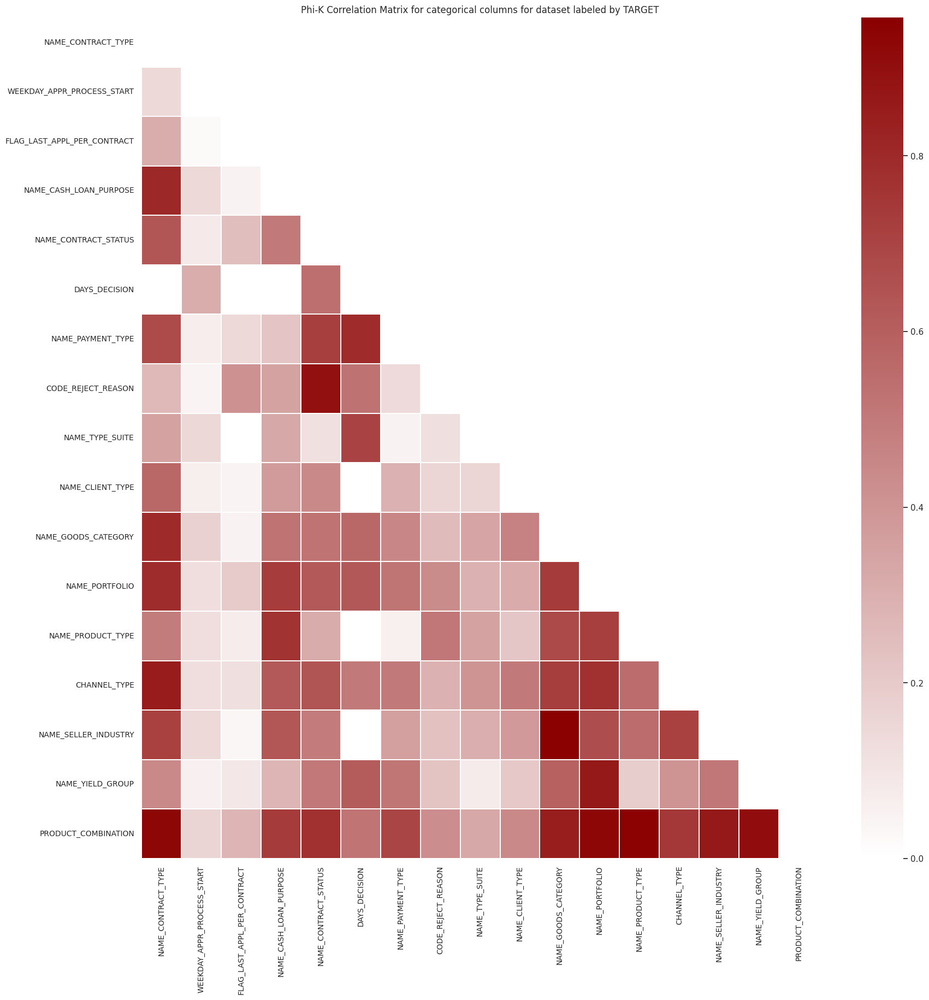

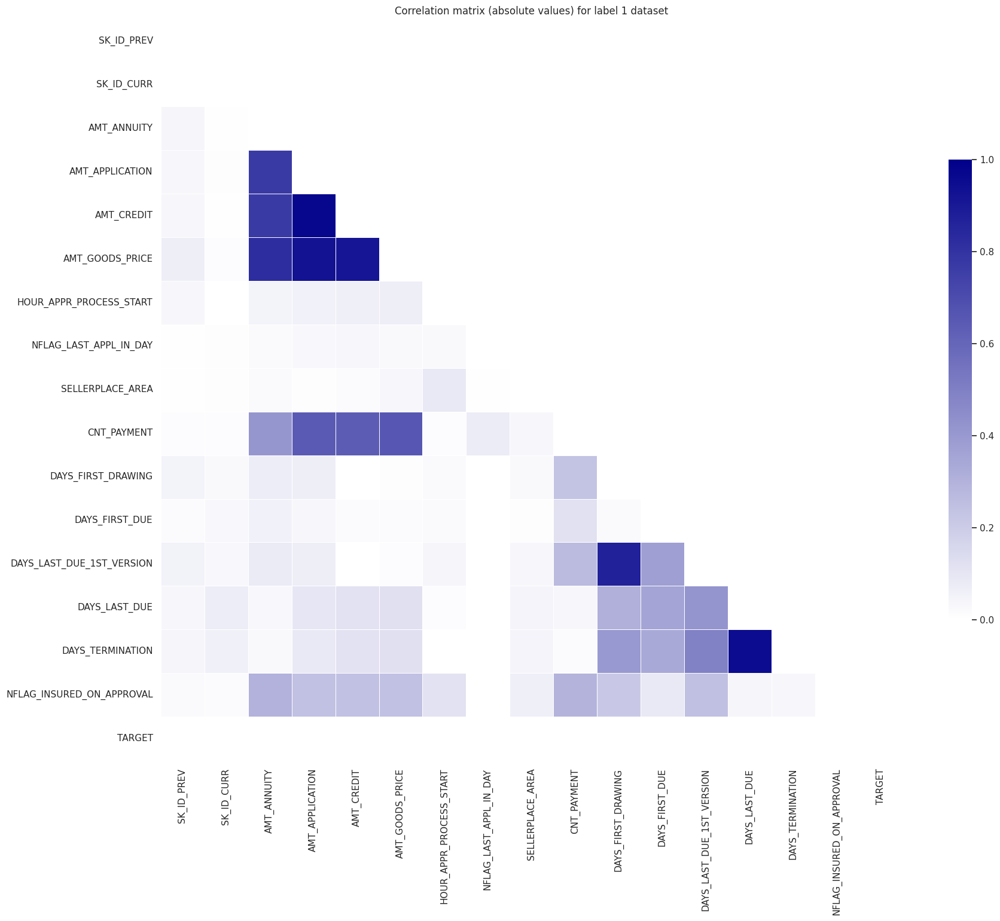

/home/amonroy/ambientes/spark/lib/python3.11/site-packages/pyspark/sql/dataframe.py:168: UserWarning: DataFrame.sql_ctx is an internal property, and will be removed in future releases. Use DataFrame.sparkSession instead.
  warnings.warn(


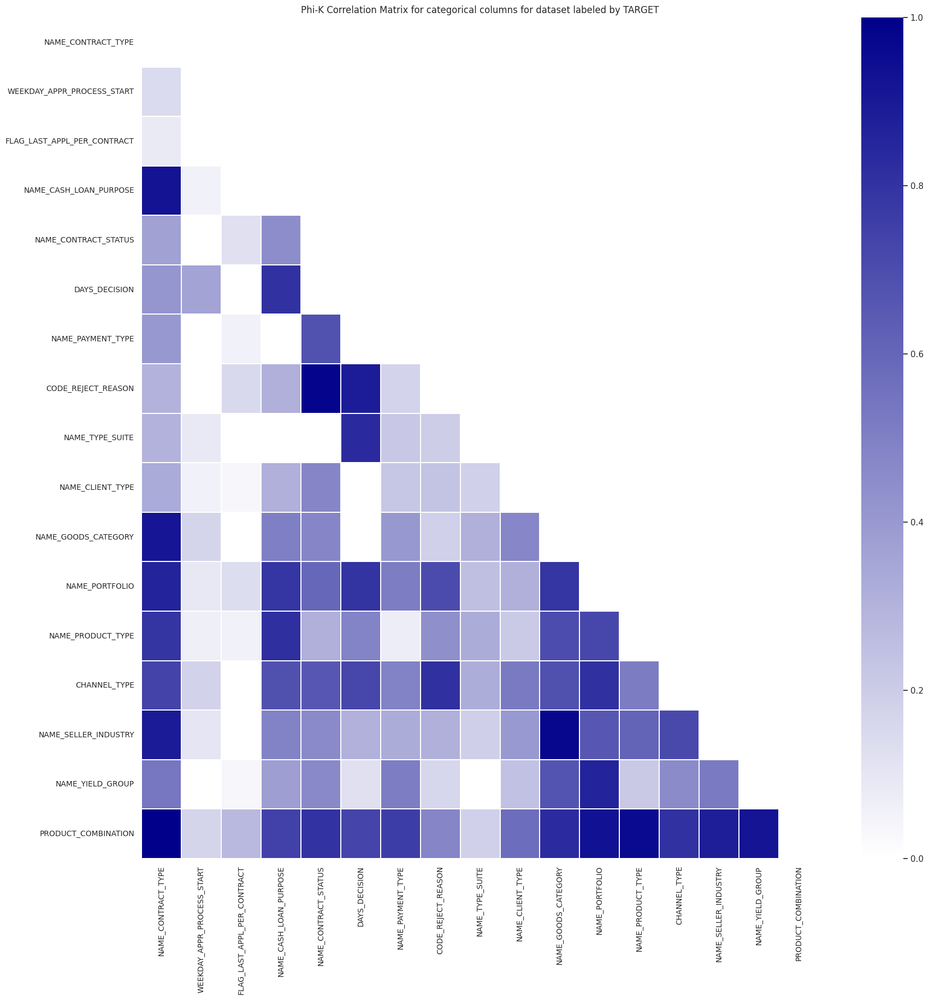

************************************************************************************************************************
Drop irrelevant columns based on correlations...Finished
************************************************************************************************************************
Outlier analysis...


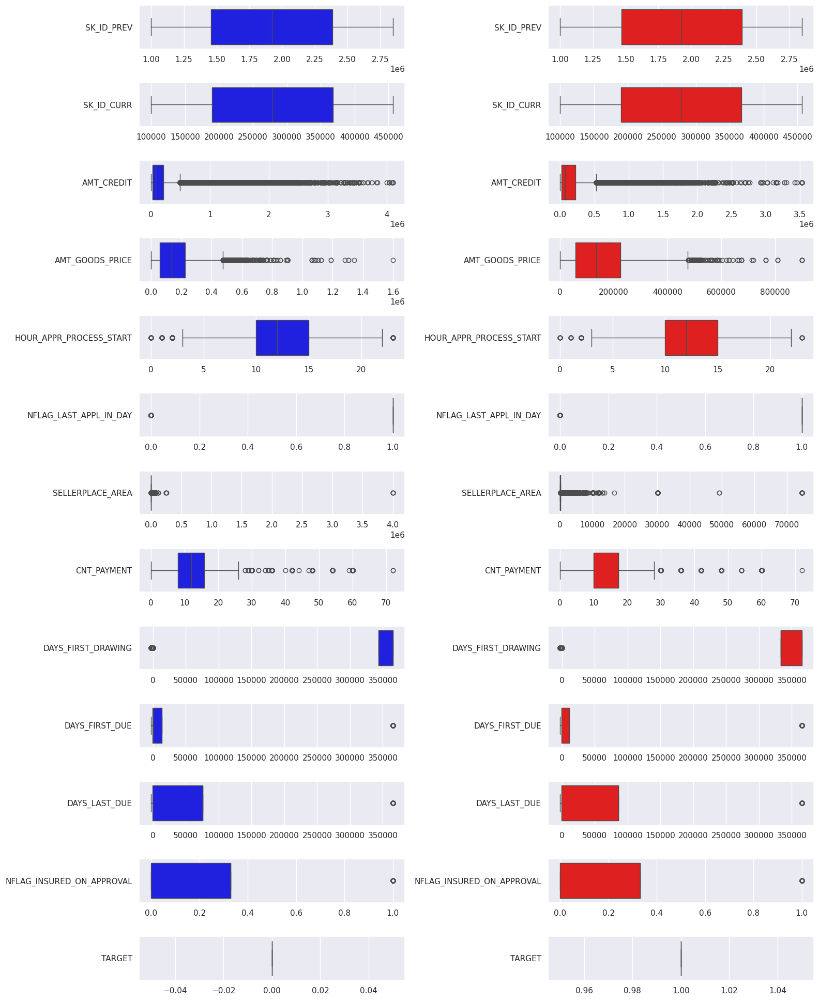

************************************************************************************************************************ 



************************************************************************************************************************
Visualize data...


/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

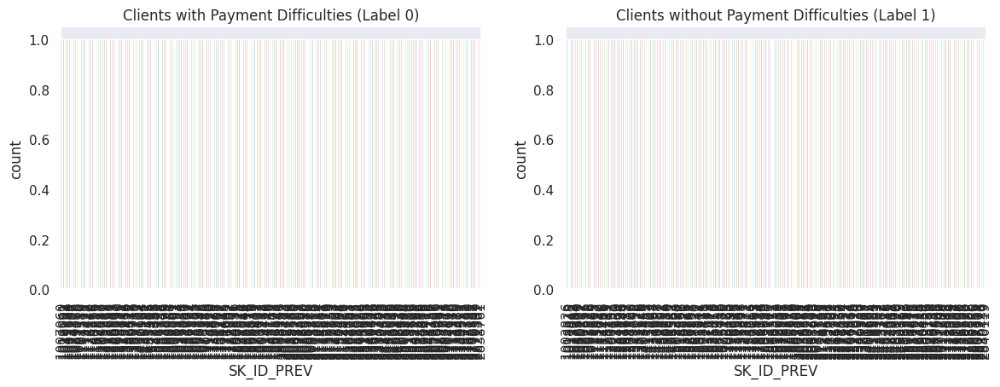

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

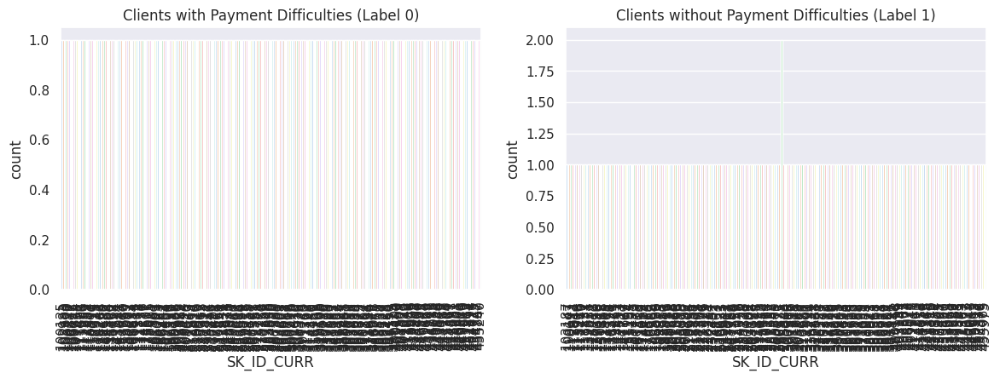

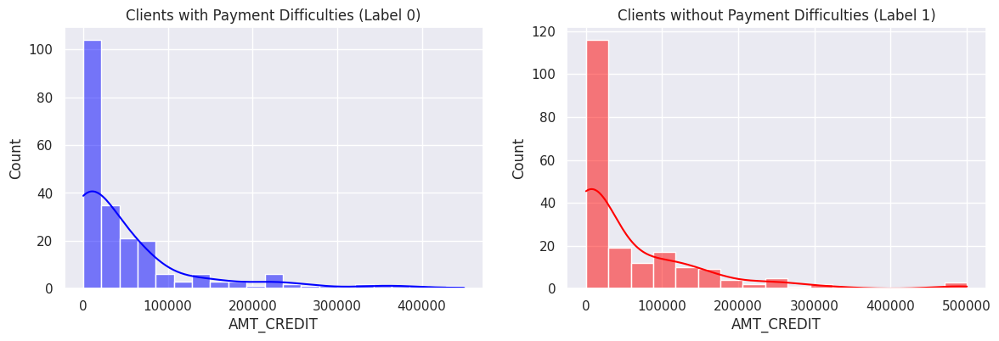

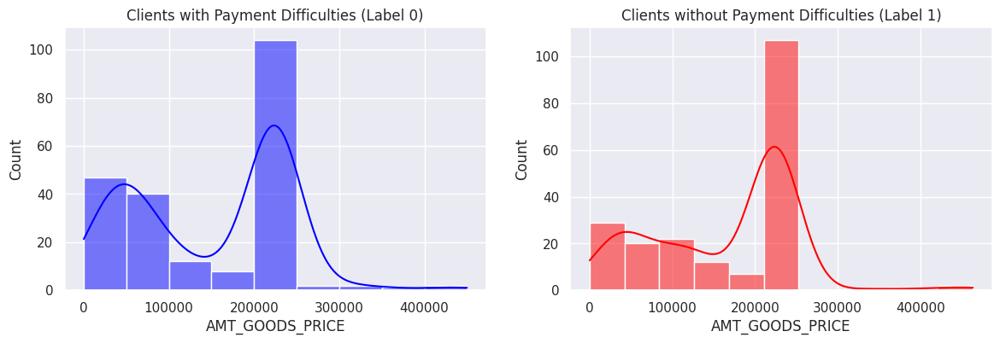

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

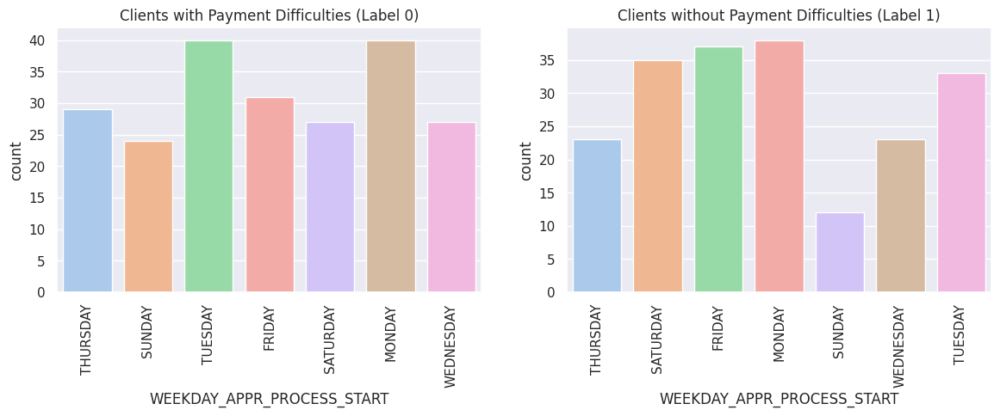

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

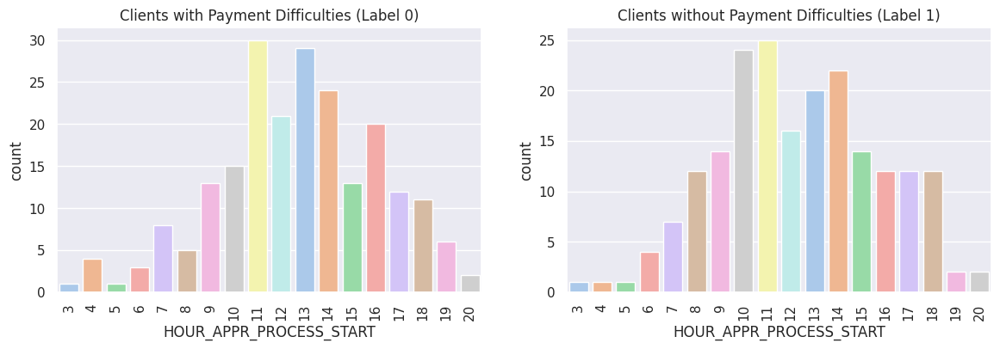

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

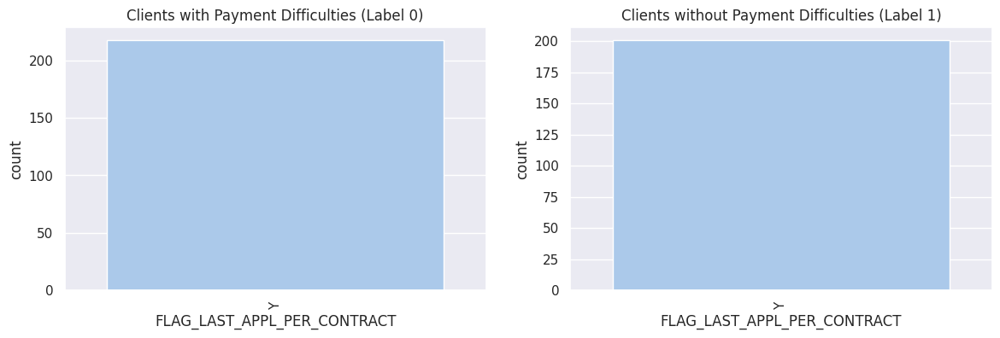

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

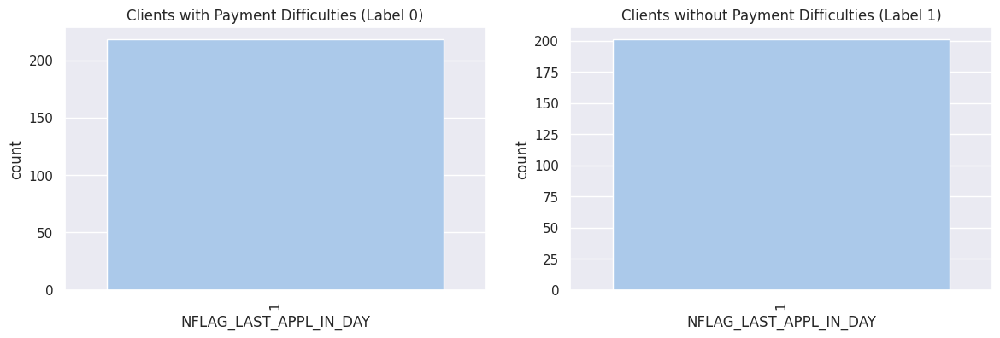

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

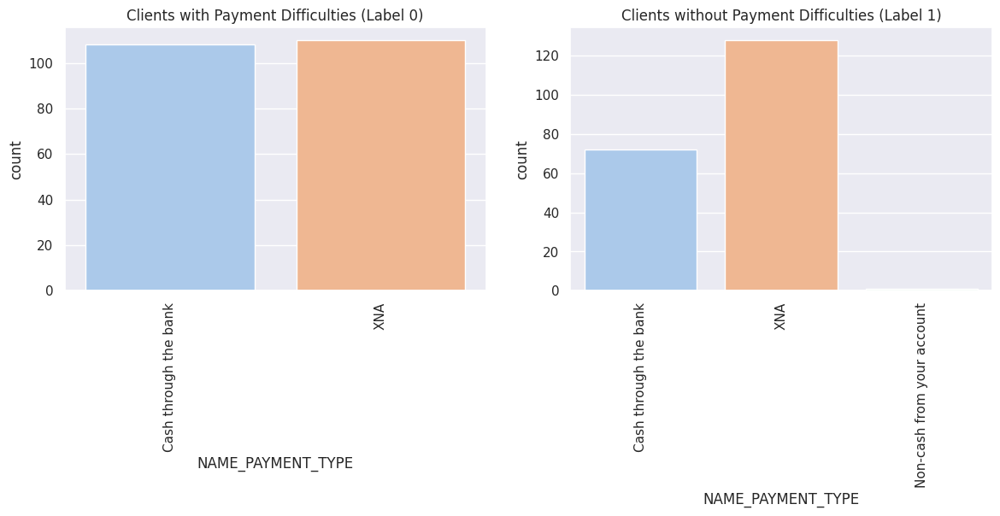

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

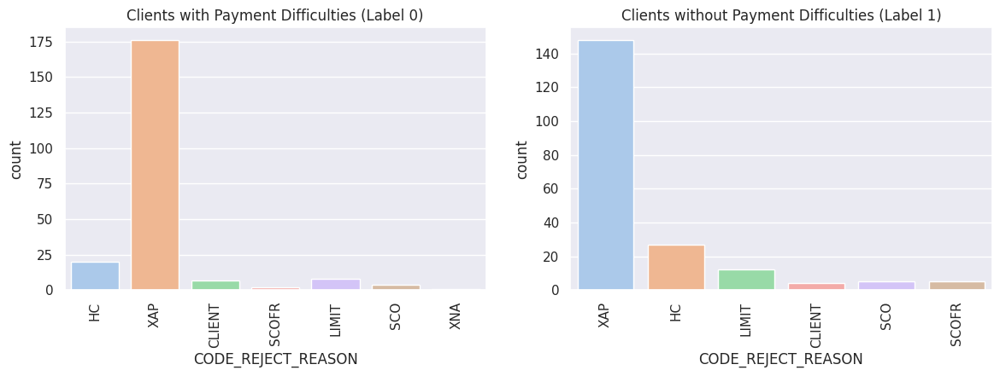

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

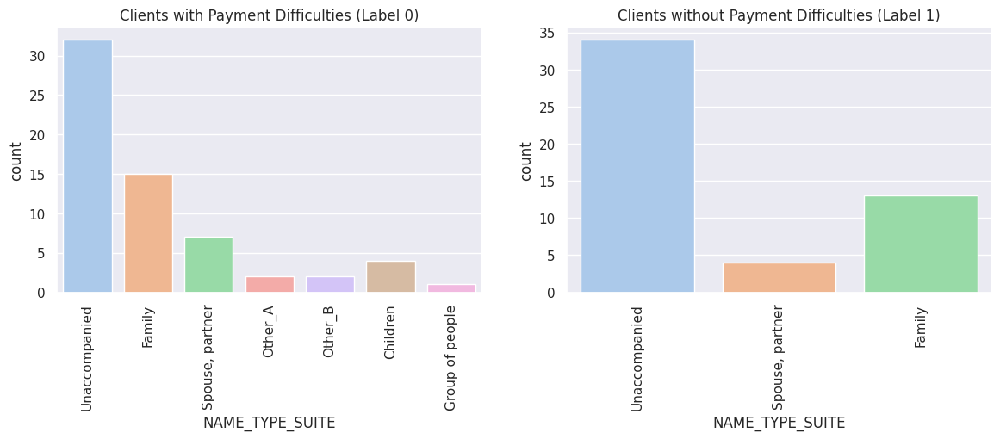

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

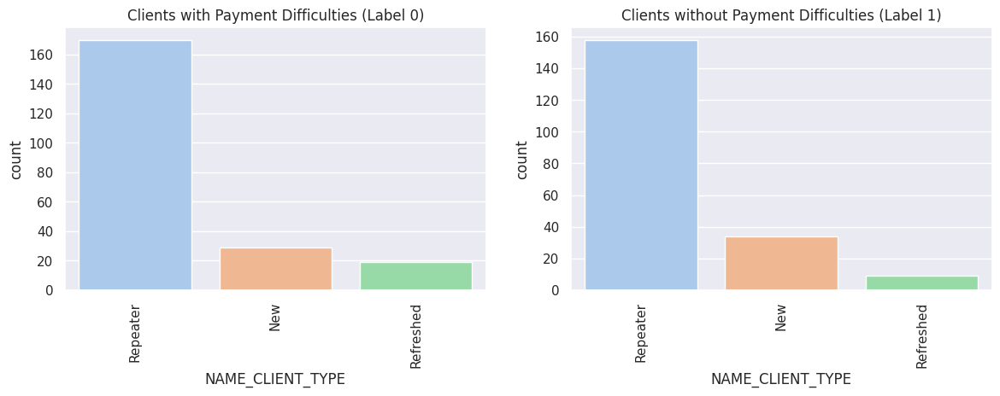

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

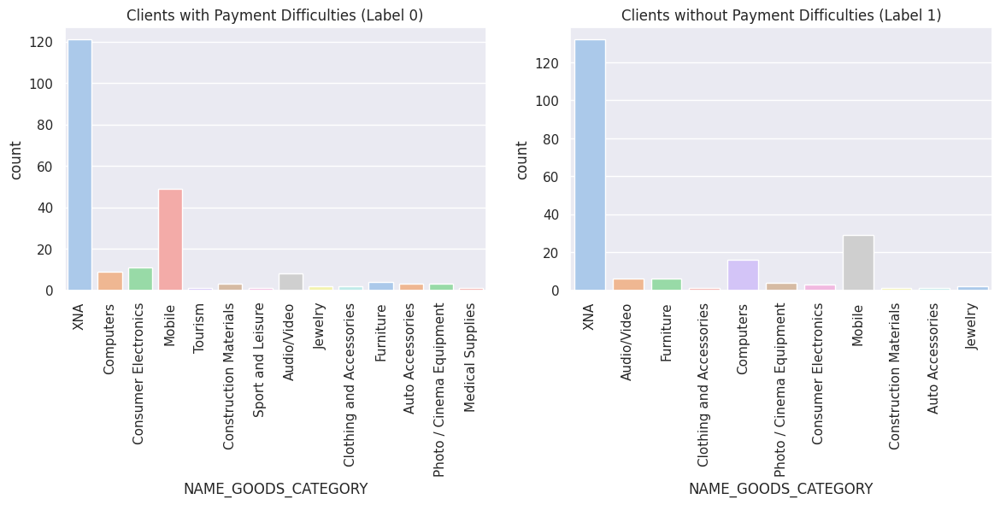

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

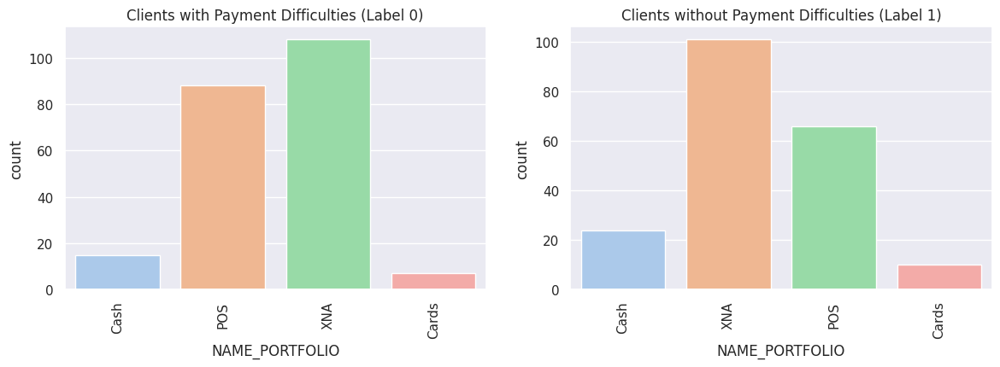

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

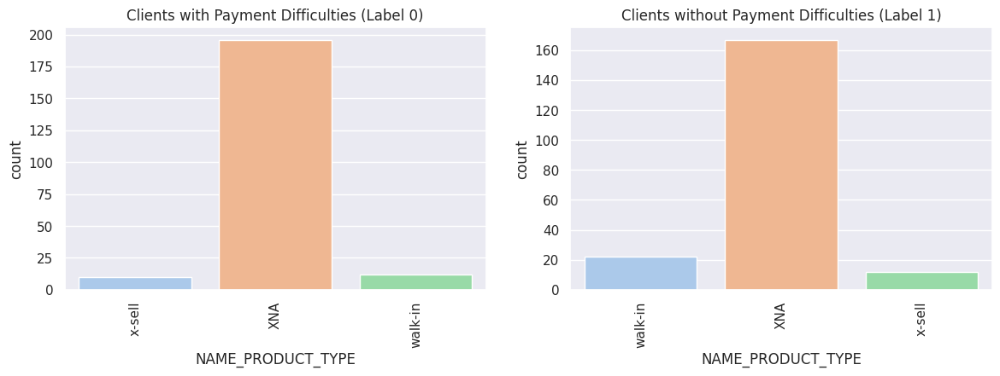

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

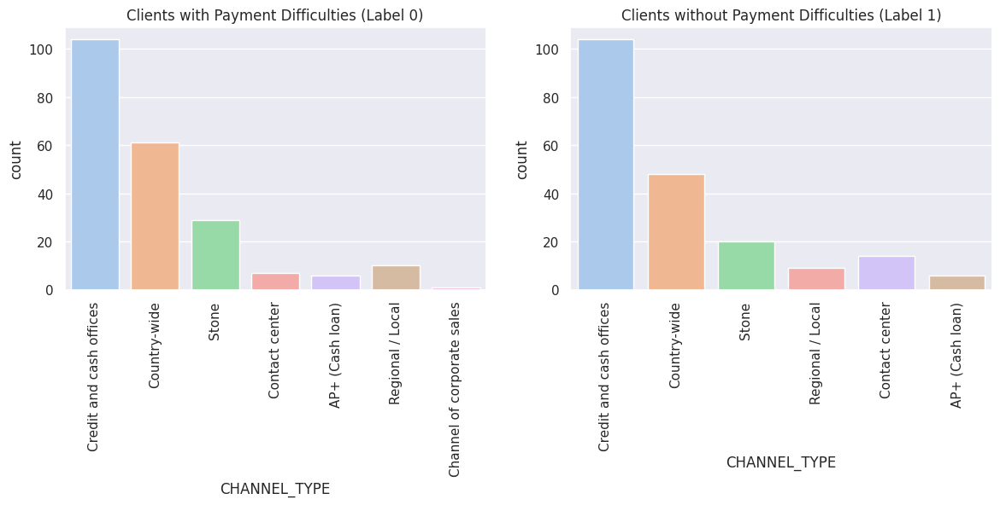

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

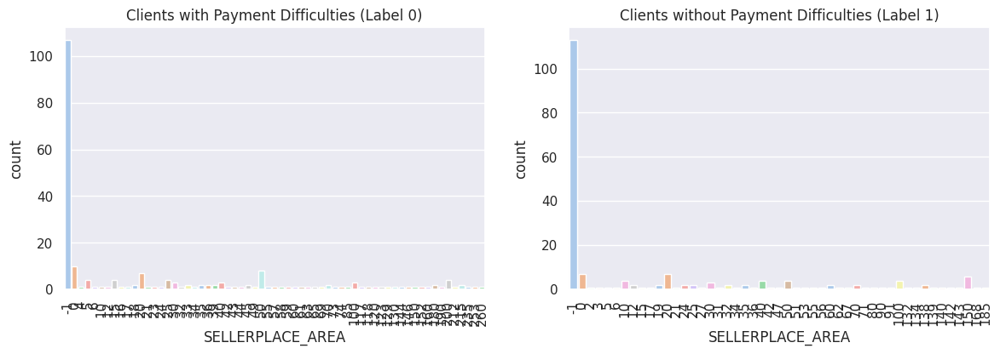

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

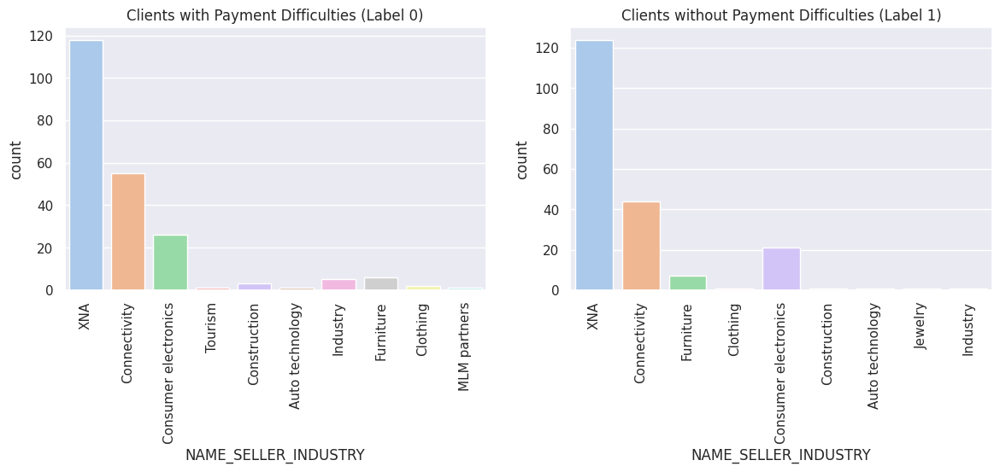

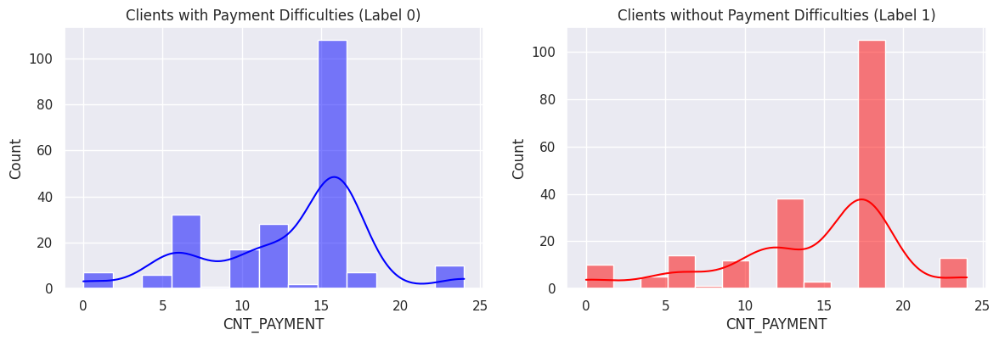

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

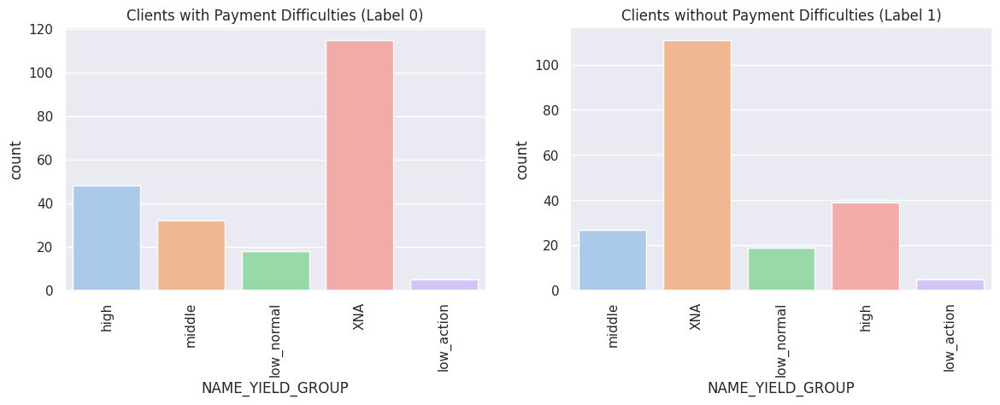

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

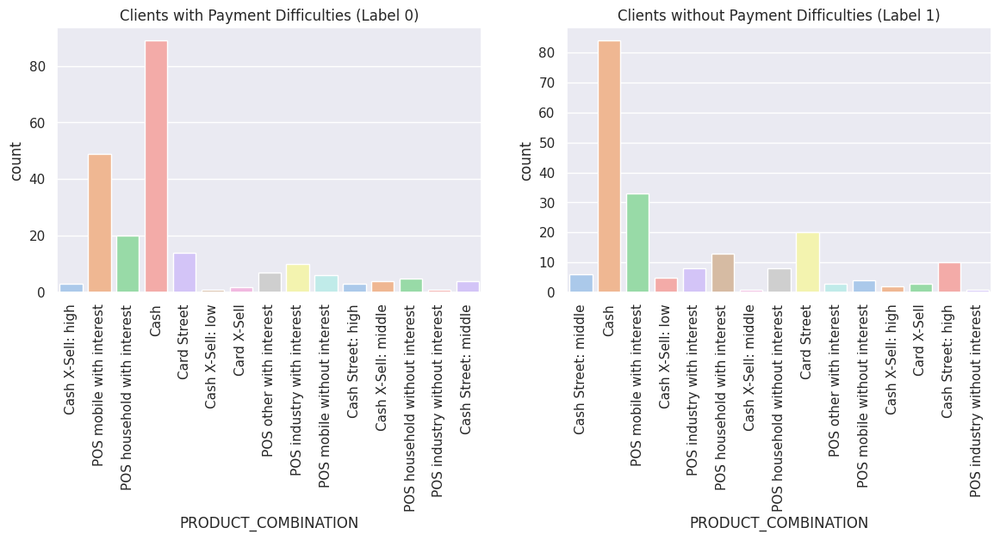

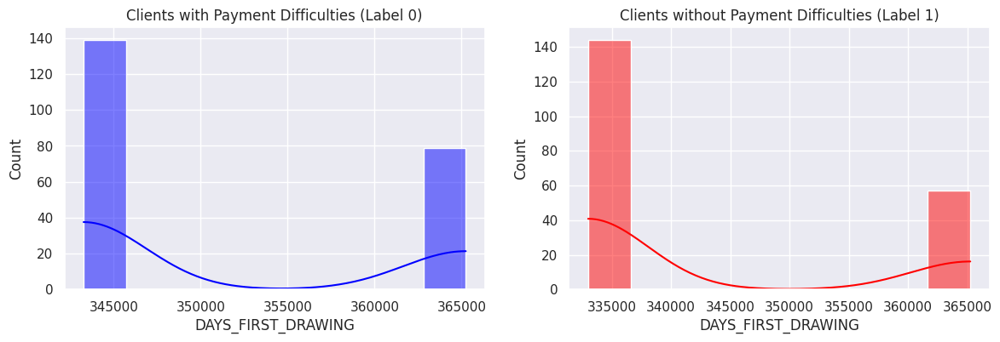

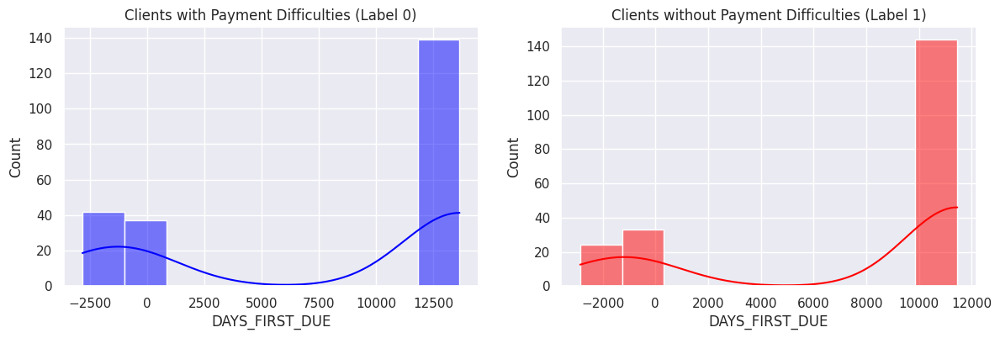

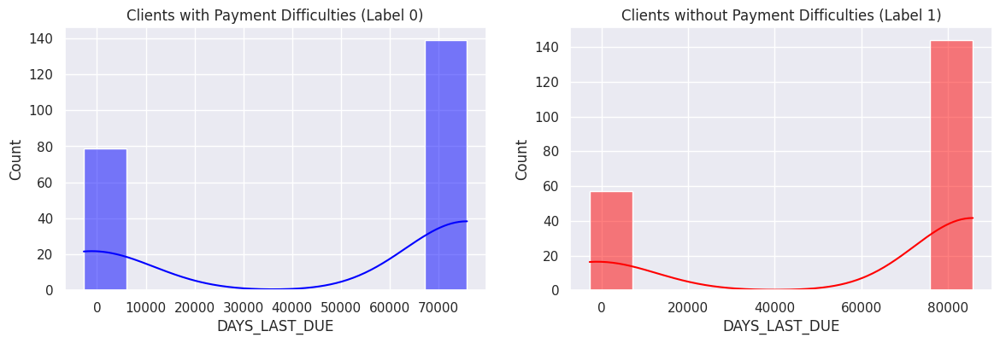

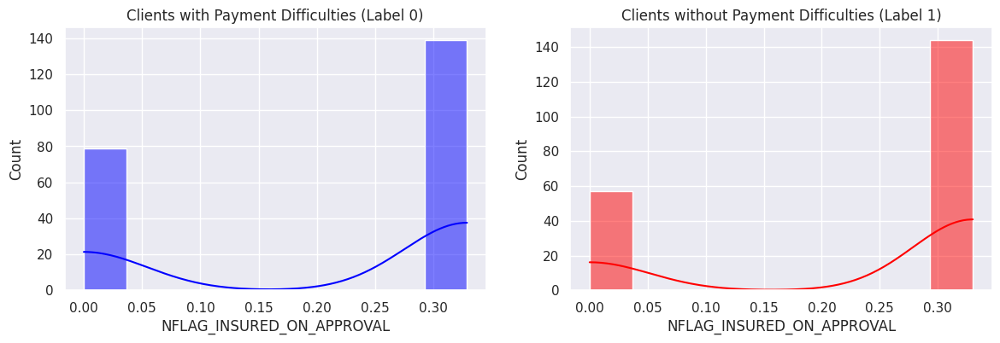

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

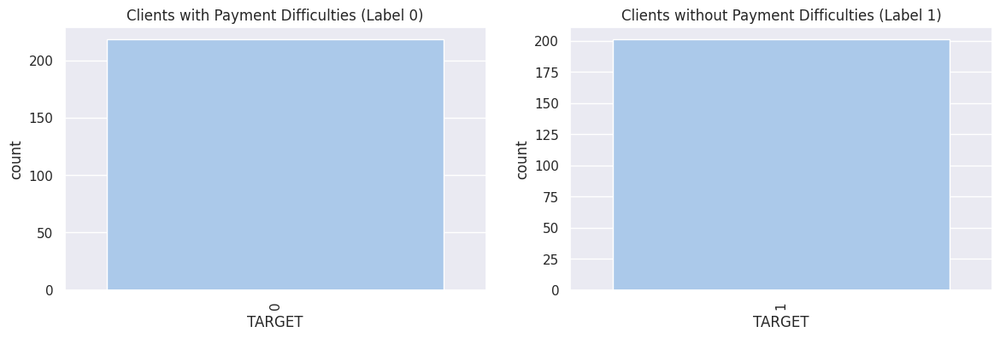

************************************************************************************************************************ 



FINISHED


In [6]:
prevApp_df.createOrReplaceTempView('prevApp_')
prev_app0, prev_app1= eda_pipeline(prevApp_df,'prevApp_',  target_column='TARGET',
                                         id_columns=['SK_ID_PREV','SK_ID_CURR'],fillNulls_numerical=True, fillNulls_categorical=True, dropIrrelevantCols=True)

In [7]:
prev_app0 = prev_app0.drop('FLAG_LAST_APPL_PER_CONTRACT')
prev_app1 = prev_app1.drop('FLAG_LAST_APPL_PER_CONTRACT')

### Conclusions
1. Two columns have nearly 100% null values for both datasets, indicating systematic missing data. Consequently, columns with a high percentage of null values were dropped.
2. From the correlation plots, highly correlated columns were removed where there was no significant difference between labels.
3. The column FLAG_LAST_APPL_PER_CONTRACT appeared to be the same for each label, and thus it was dropped from both DataFrames.
4. The outliers visiualizated from the box plots were borrowed

## POS_CASH_balanca dataframe

### EDA 

************************************************************************************************************************
Correcting the data type of the dataframe columns...

Finished
 ************************************************************************************************************************
Split the dataframe based on labels...Finished
 ************************************************************************************************************************
Analysis of null values...


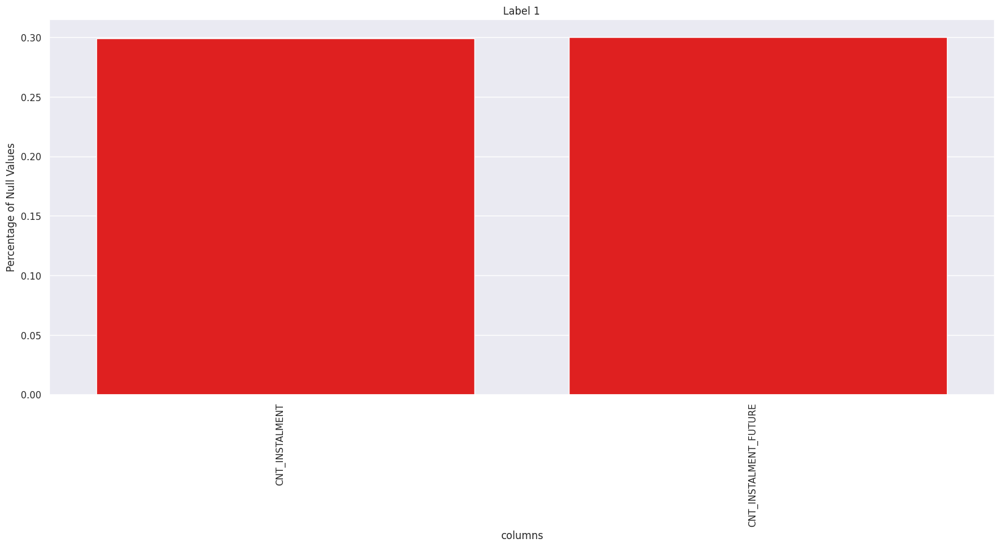

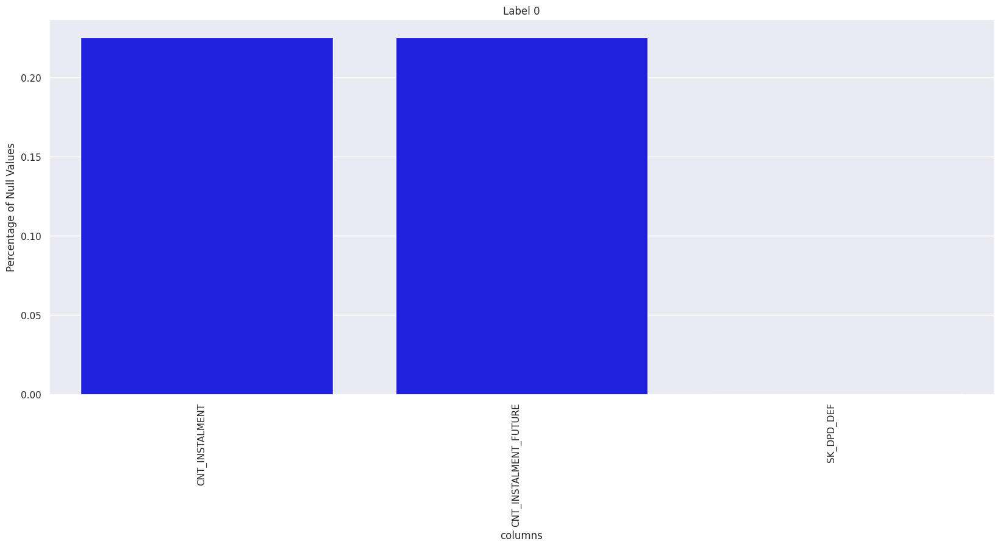

,percentage null values label 1,percentage null values label 0,difference percentages null values
SK_ID_PREV,0.0000,0.00000,0.00000
SK_ID_CURR,0.0000,0.00000,0.00000
CNT_INSTALMENT,0.2992,0.22541,0.07379
CNT_INSTALMENT_FUTURE,0.3001,0.22538,0.07472
SK_DPD,0.0000,0.00000,0.00000
SK_DPD_DEF,0.0000,0.00002,0.00002
TARGET,0.0000,0.00000,0.00000
target,1.0000,0.00000,1.00000


************************************************************************************************************************
Plot Correlations


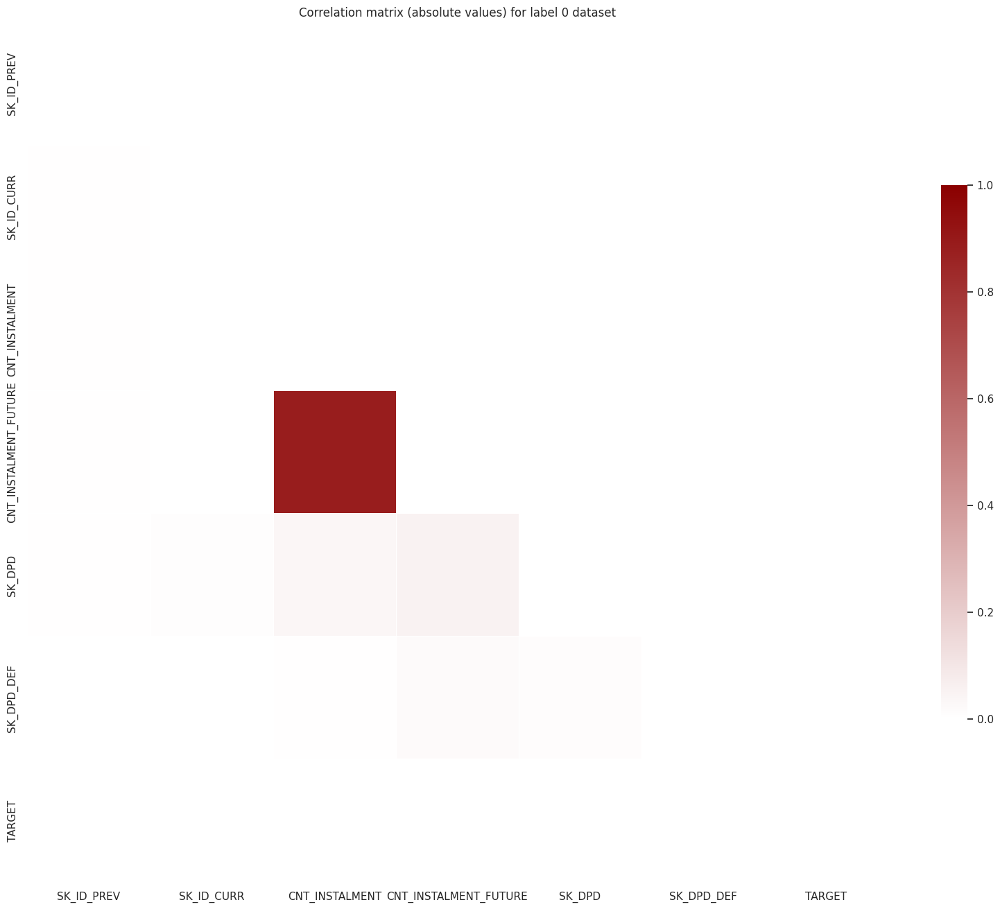

/home/amonroy/ambientes/spark/lib/python3.11/site-packages/pyspark/sql/dataframe.py:168: UserWarning: DataFrame.sql_ctx is an internal property, and will be removed in future releases. Use DataFrame.sparkSession instead.
  warnings.warn(


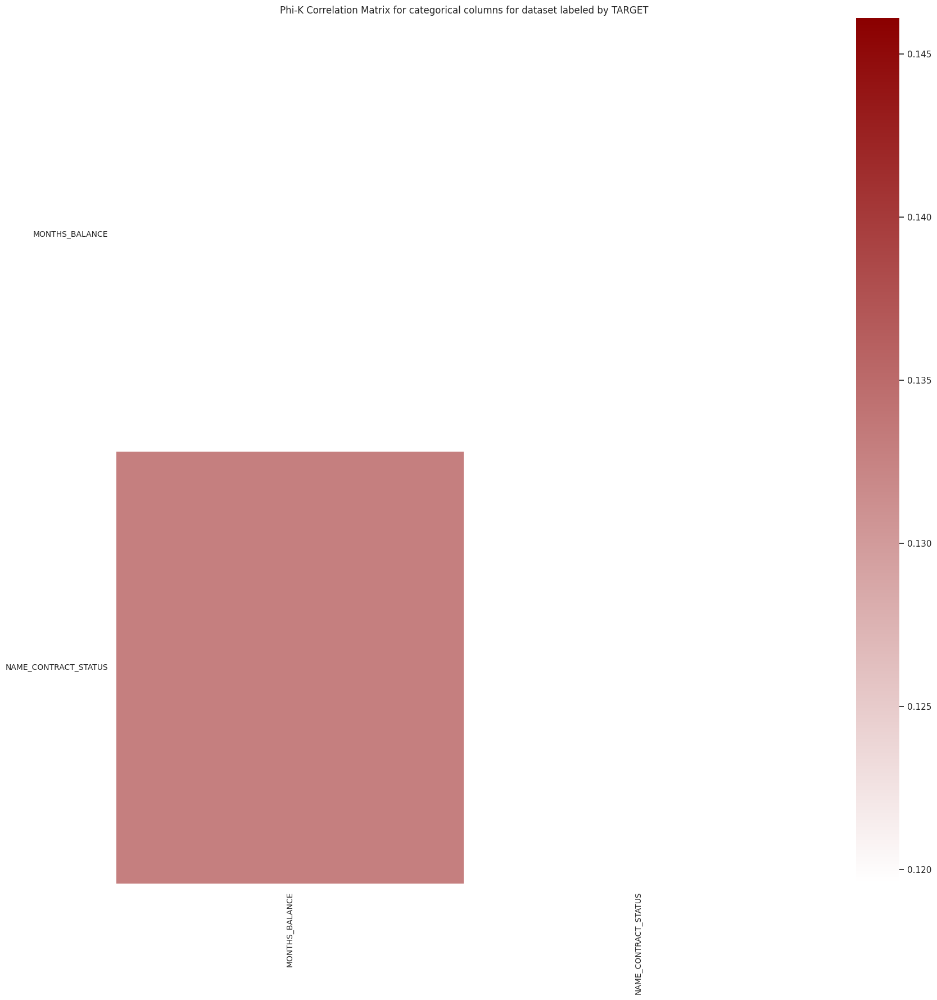

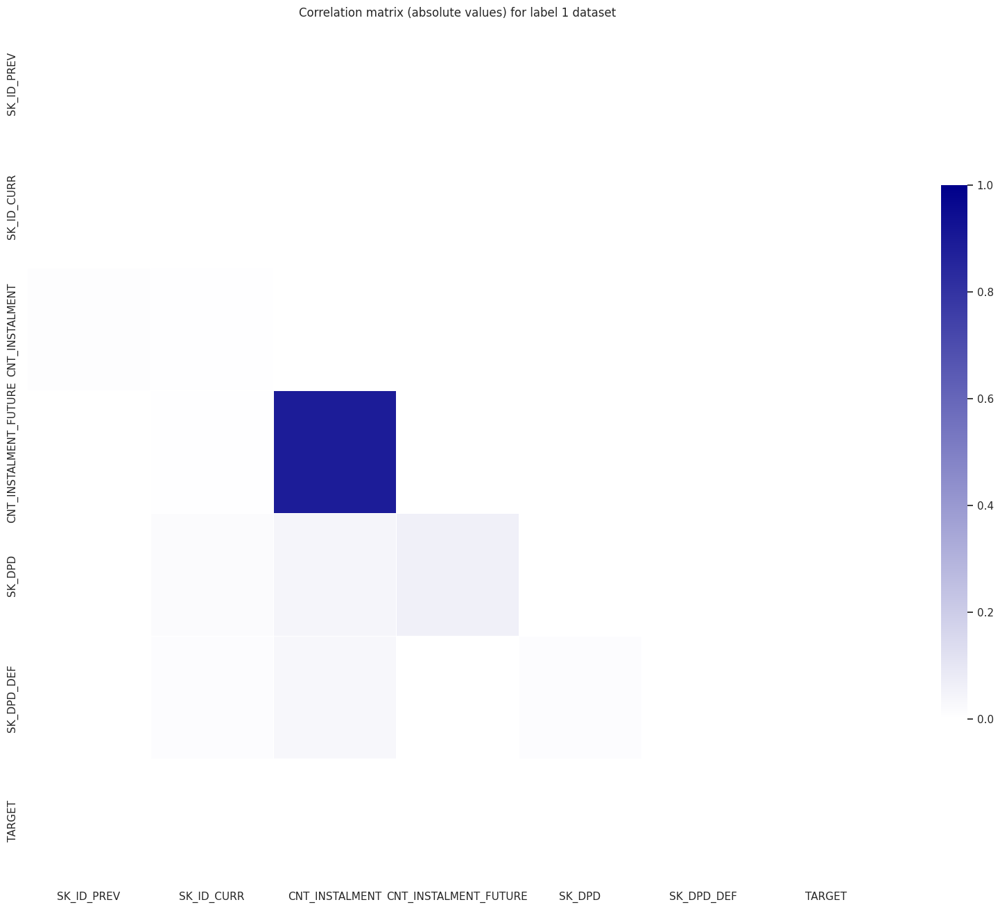

/home/amonroy/ambientes/spark/lib/python3.11/site-packages/pyspark/sql/dataframe.py:168: UserWarning: DataFrame.sql_ctx is an internal property, and will be removed in future releases. Use DataFrame.sparkSession instead.
  warnings.warn(


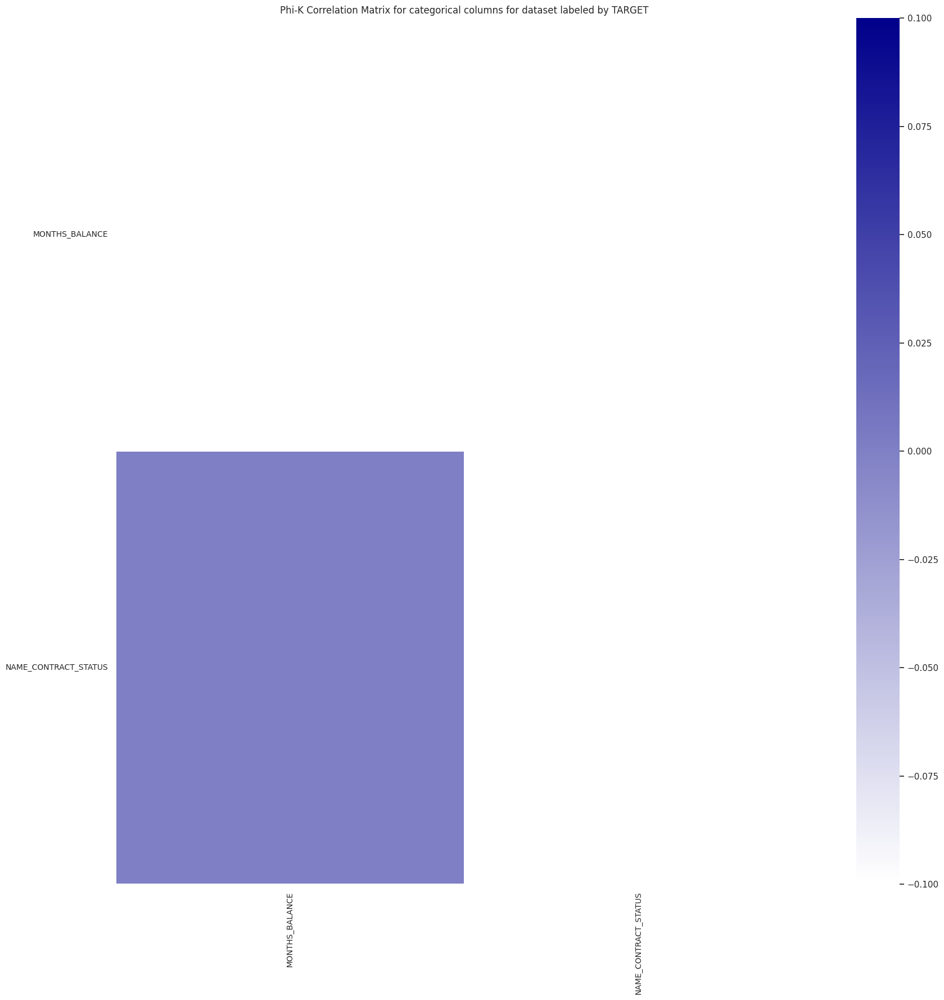

************************************************************************************************************************
Drop irrelevant columns based on correlations...Finished
************************************************************************************************************************
Outlier analysis...


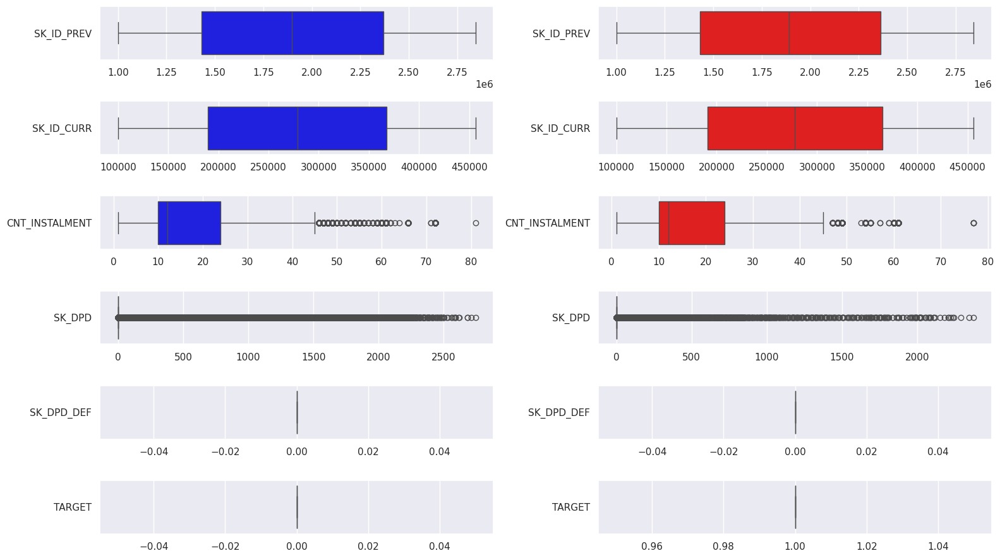

************************************************************************************************************************ 



************************************************************************************************************************
Visualize data...


/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

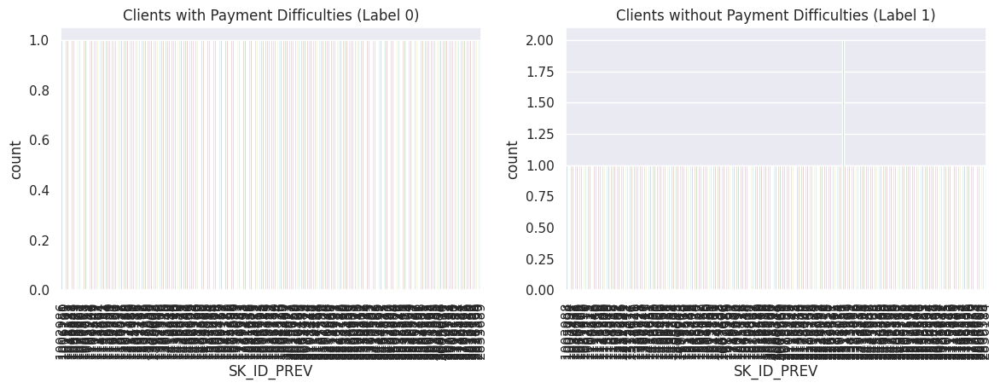

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

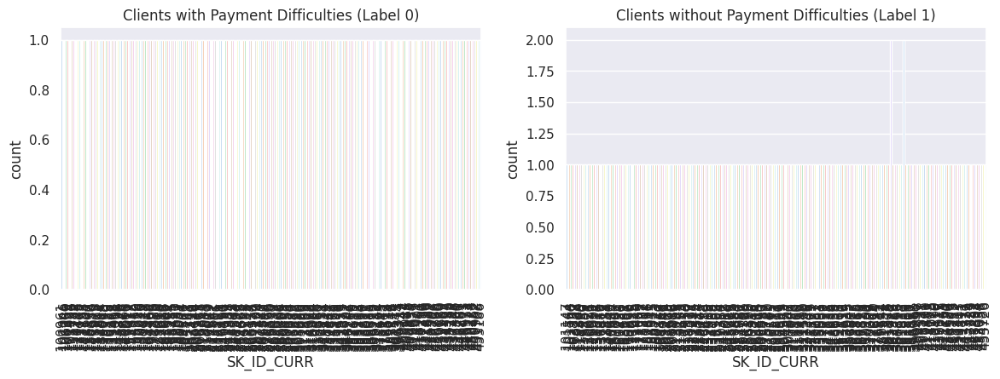

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

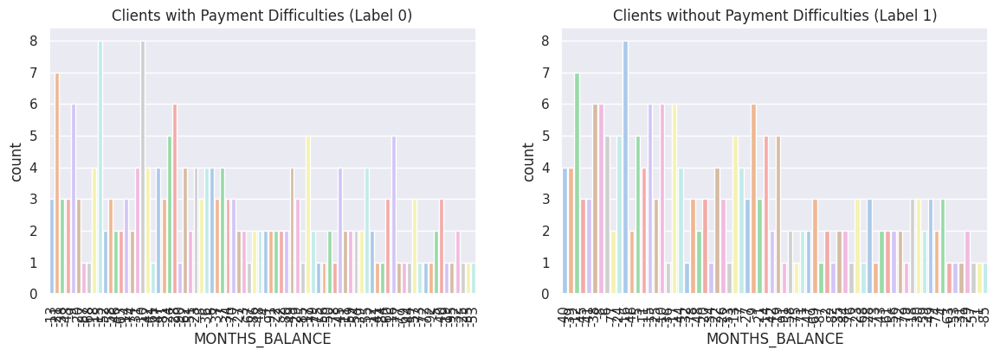

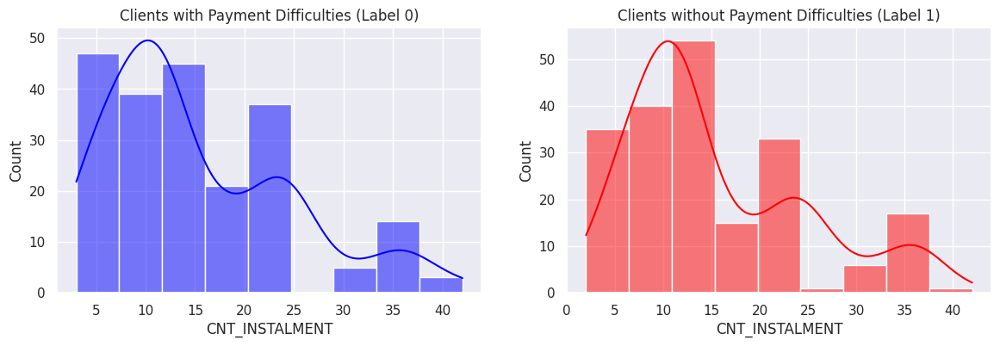

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

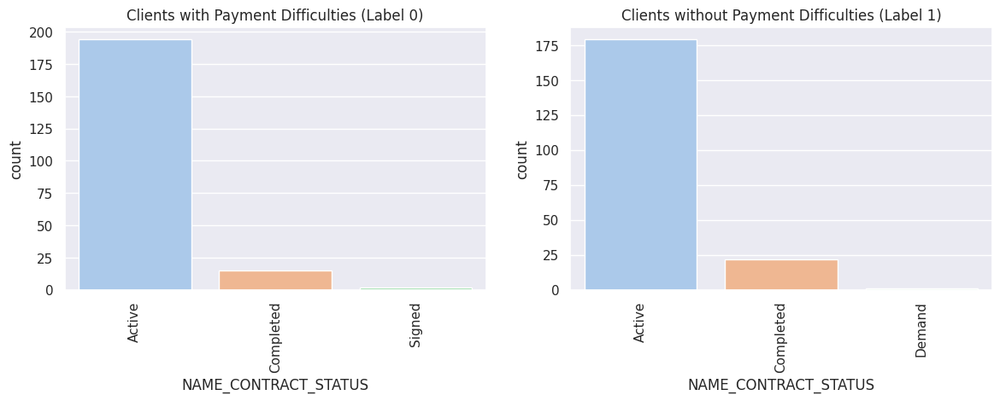

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

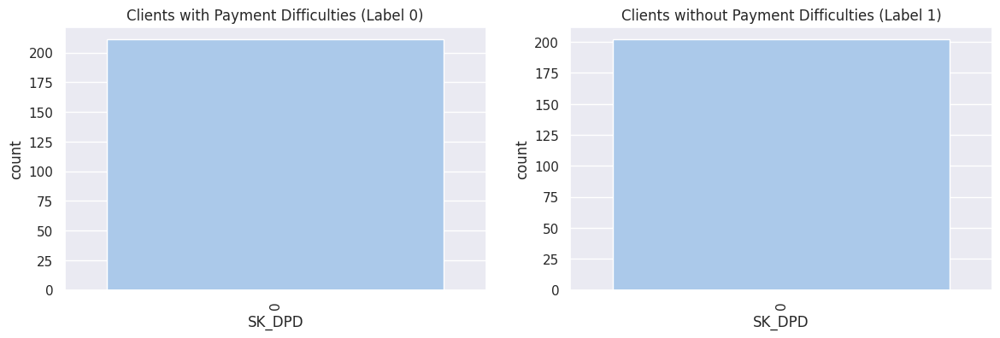

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

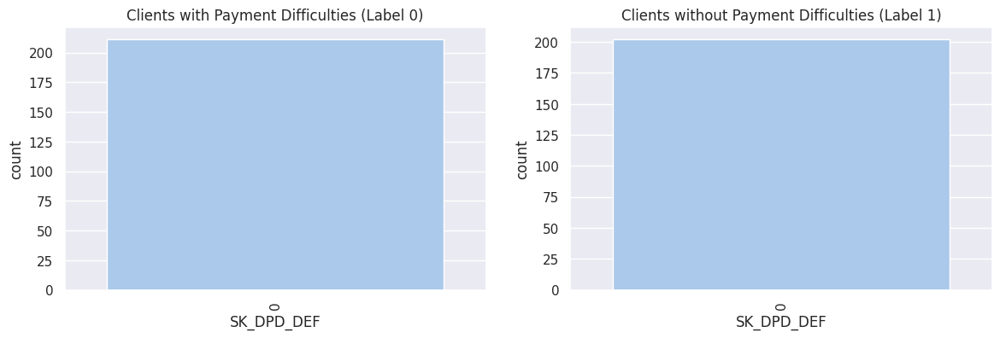

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

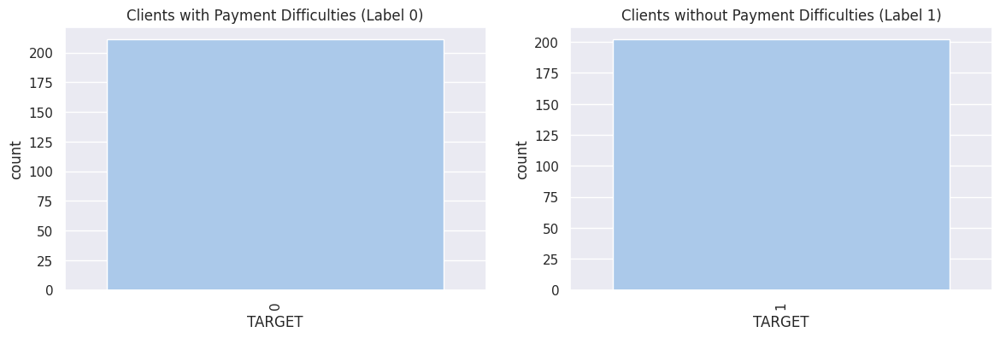

************************************************************************************************************************ 



FINISHED


In [8]:
POS_CASH_balance_df.createOrReplaceTempView('POS_CASH_balance_df')
pos_cash0, pos_cash1= eda_pipeline(POS_CASH_balance_df,'prevApp_',  target_column='TARGET',
                                         id_columns=['SK_ID_PREV','SK_ID_CURR'],fillNulls_numerical=True, fillNulls_categorical=True, dropIrrelevantCols=True)

### Conclusions:
1. There are few null values
2. From the correlation plots, highly correlated columns were removed where there is no significant difference between labels.
5. Using the  blox plots the outliers were eliminated

## Bureau dataframe

### EDA

************************************************************************************************************************
Correcting the data type of the dataframe columns...Finished
 ************************************************************************************************************************
Split the dataframe based on labels...Finished
 ************************************************************************************************************************
Analysis of null values...


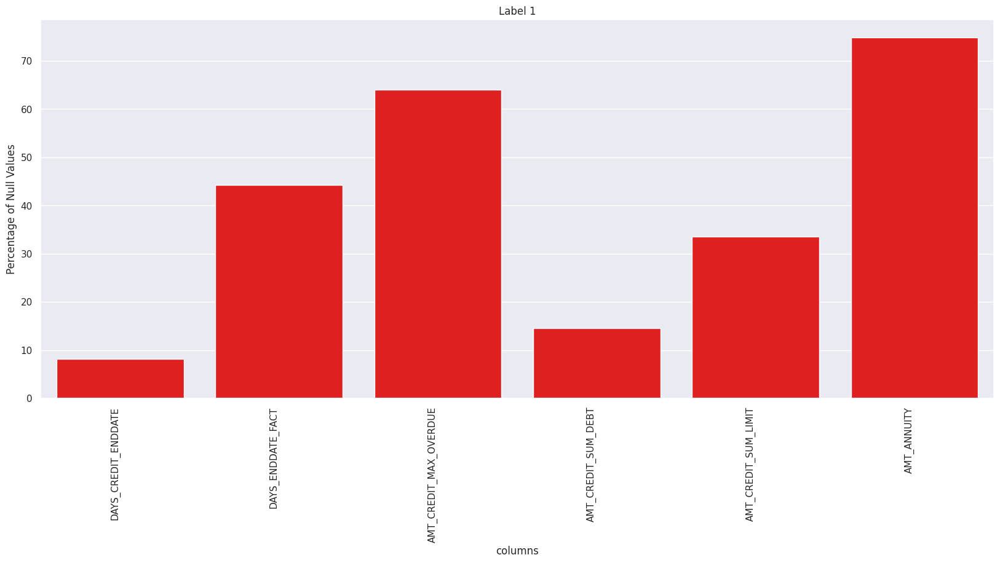

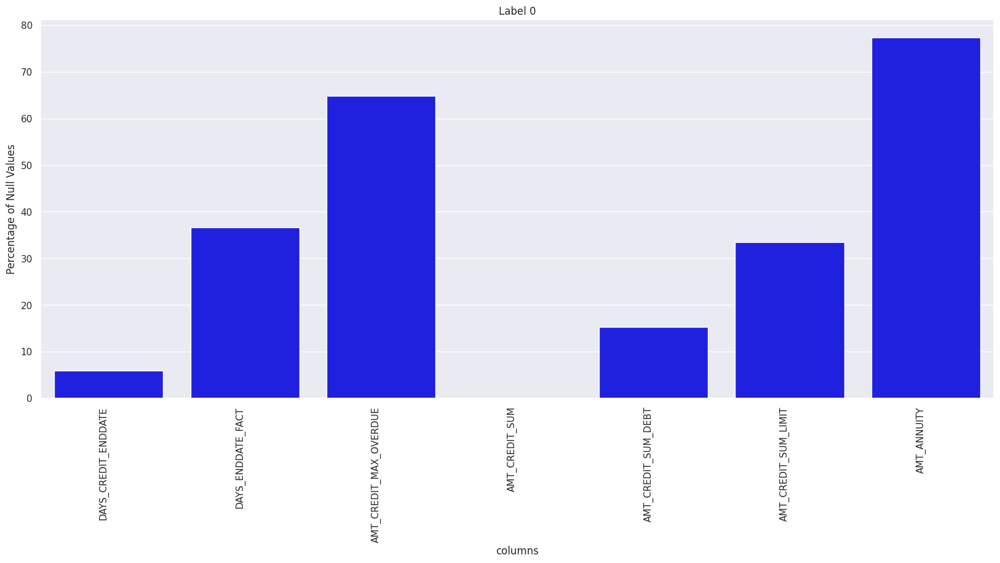

,percentage null values label 1,percentage null values label 0,difference percentages null values
SK_ID_BUREAU,0.00000,0.00000,0.00000
SK_ID_CURR,0.00000,0.00000,0.00000
CREDIT_DAY_OVERDUE,0.00000,0.00000,0.00000
DAYS_CREDIT_ENDDATE,8.12784,5.90685,2.22099
DAYS_ENDDATE_FACT,44.20538,36.57441,7.63097
AMT_CREDIT_MAX_OVERDUE,63.95040,64.79906,0.84866
CNT_CREDIT_PROLONG,0.00000,0.00000,0.00000
AMT_CREDIT_SUM,0.00000,0.00022,0.00022
AMT_CREDIT_SUM_DEBT,14.56078,15.28118,0.72040
AMT_CREDIT_SUM_LIMIT,33.47363,33.41237,0.06126


************************************************************************************************************************
Plot Correlations


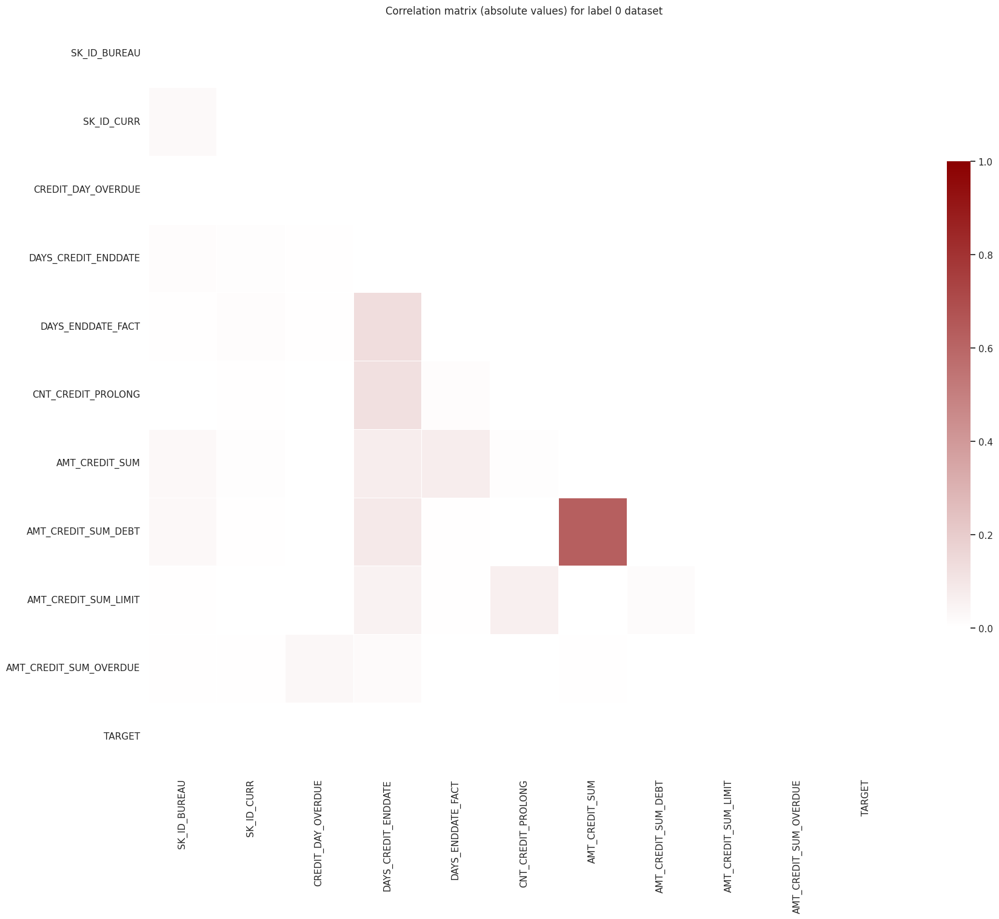

/home/amonroy/ambientes/spark/lib/python3.11/site-packages/pyspark/sql/dataframe.py:168: UserWarning: DataFrame.sql_ctx is an internal property, and will be removed in future releases. Use DataFrame.sparkSession instead.
  warnings.warn(
/home/amonroy/ambientes/spark/lib/python3.11/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable DAYS_CREDIT is large: 2826. Are you sure this is not an interval variable? Analysis for pairs of variables including DAYS_CREDIT can be slow.
  warnings.warn(
/home/amonroy/ambientes/spark/lib/python3.11/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable DAYS_CREDIT_UPDATE is large: 2321. Are you sure this is not an interval variable? Analysis for pairs of variables including DAYS_CREDIT_UPDATE can be slow.
  warnings.warn(
/home/amonroy/ambientes/spark/lib/python3.11/site-packages/phik/bivariate.py:241: UserWarning: Many cells: 6559146. Are interval variables set correctly?
  

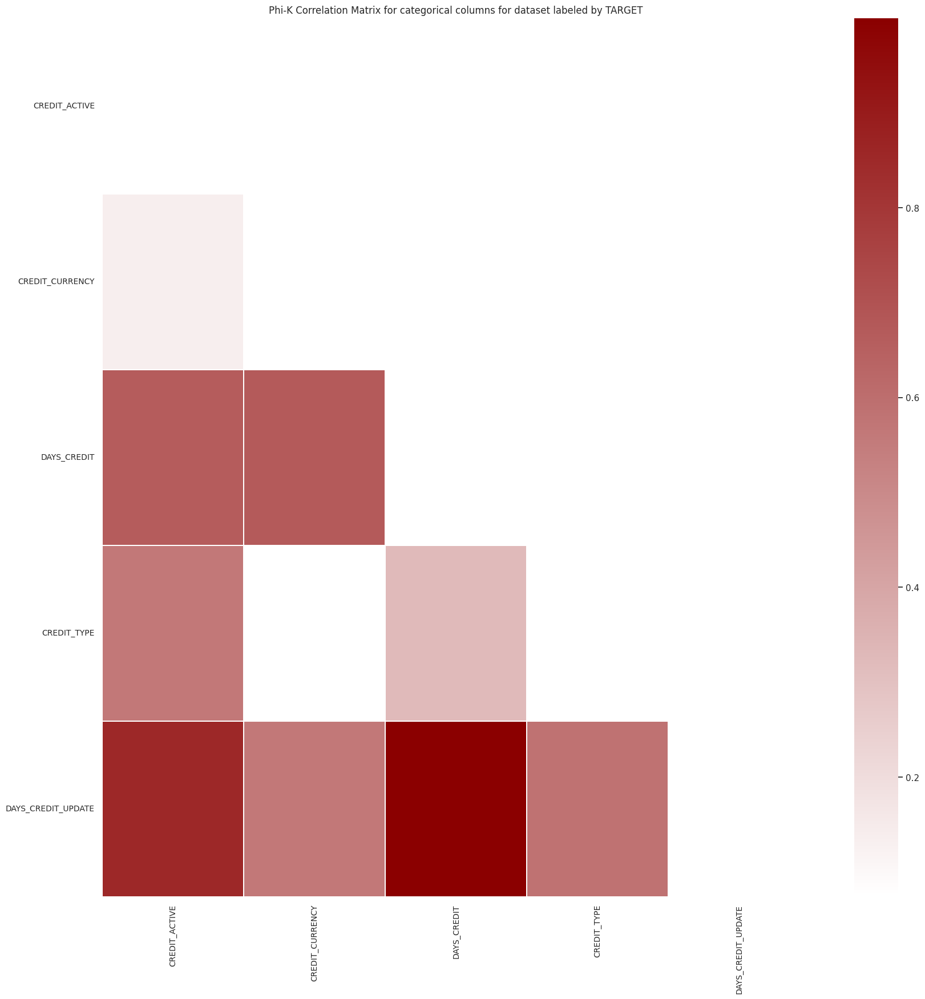

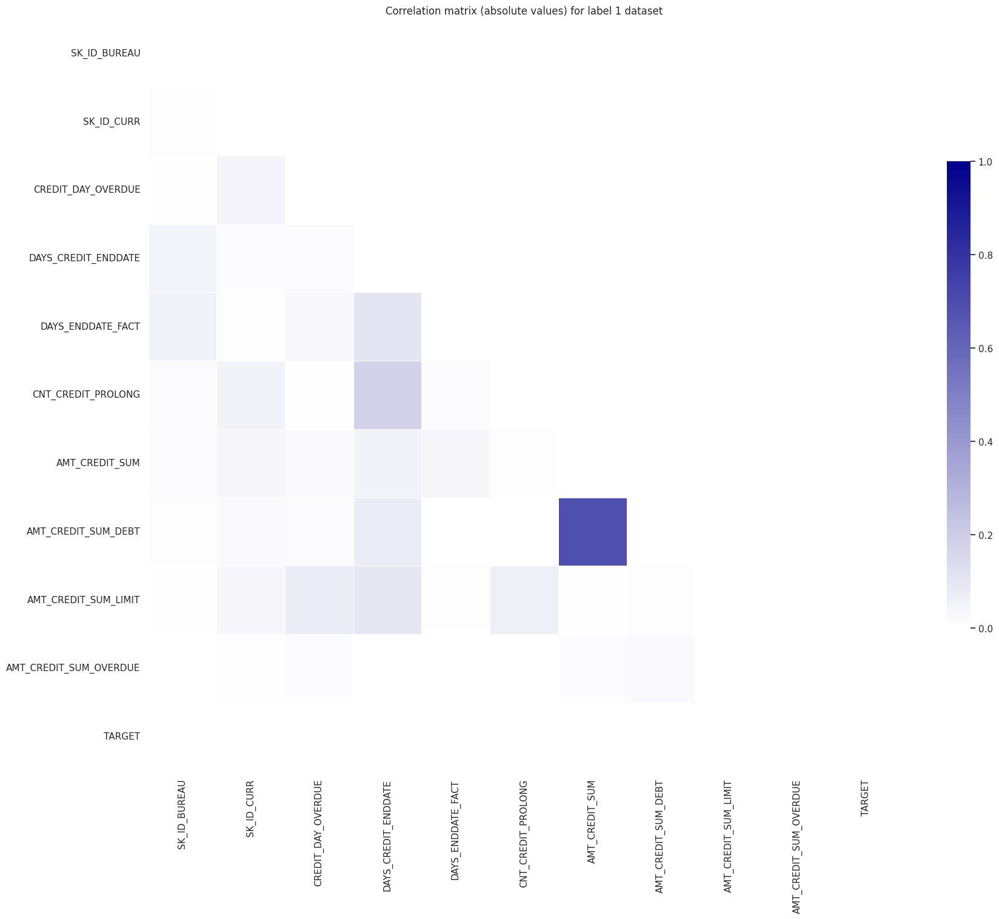

/home/amonroy/ambientes/spark/lib/python3.11/site-packages/pyspark/sql/dataframe.py:168: UserWarning: DataFrame.sql_ctx is an internal property, and will be removed in future releases. Use DataFrame.sparkSession instead.
  warnings.warn(


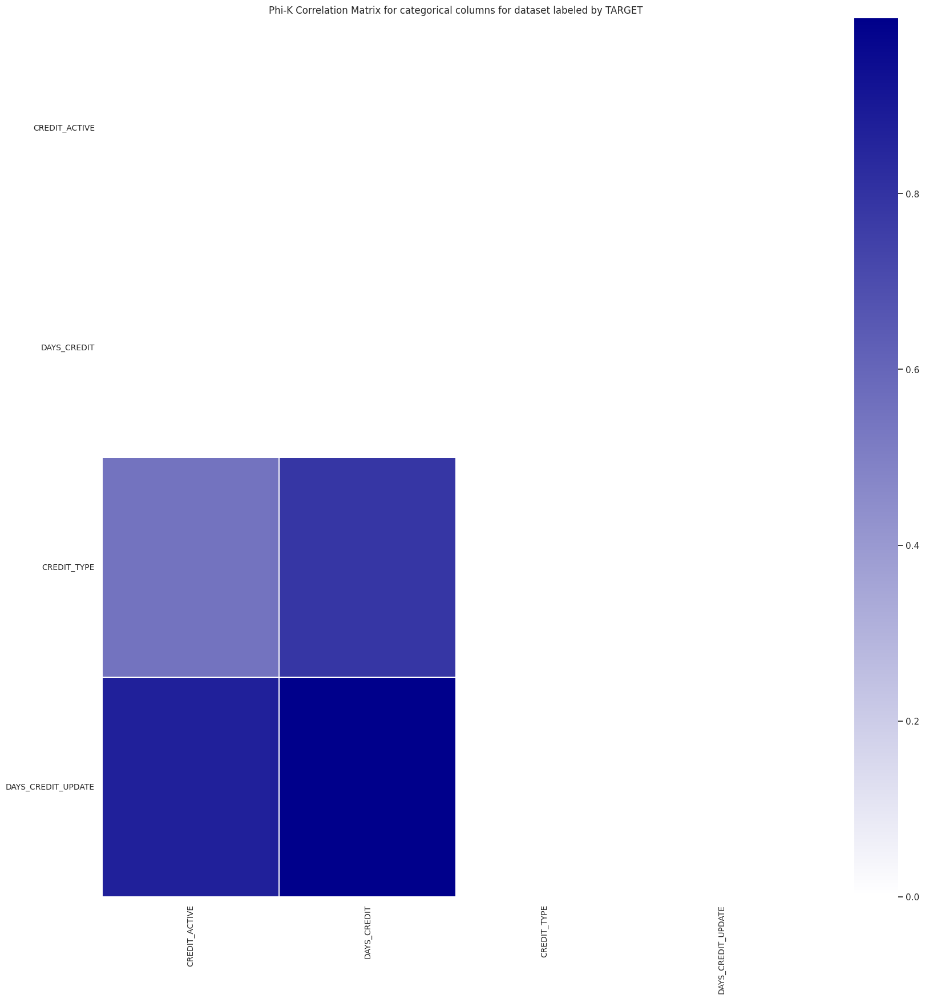

************************************************************************************************************************
Drop irrelevant columns based on correlations...Finished
************************************************************************************************************************
Outlier analysis...


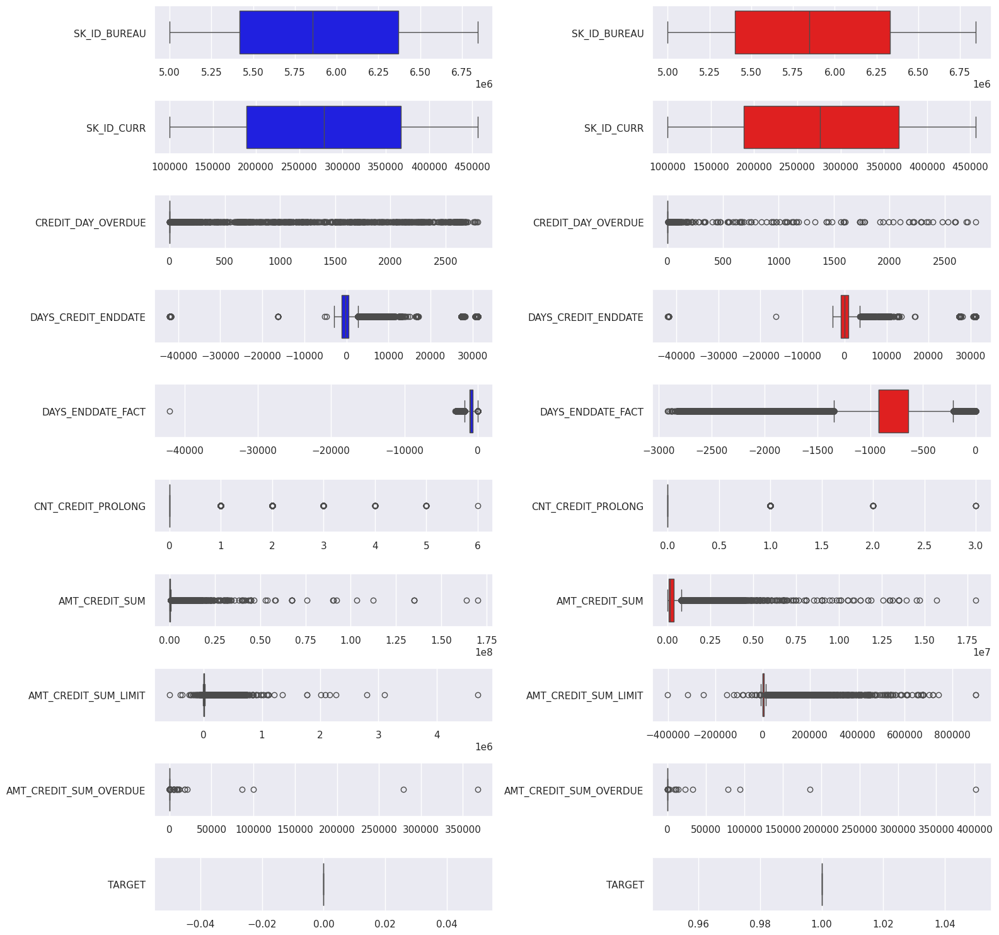

************************************************************************************************************************ 



************************************************************************************************************************
Visualize data...


/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

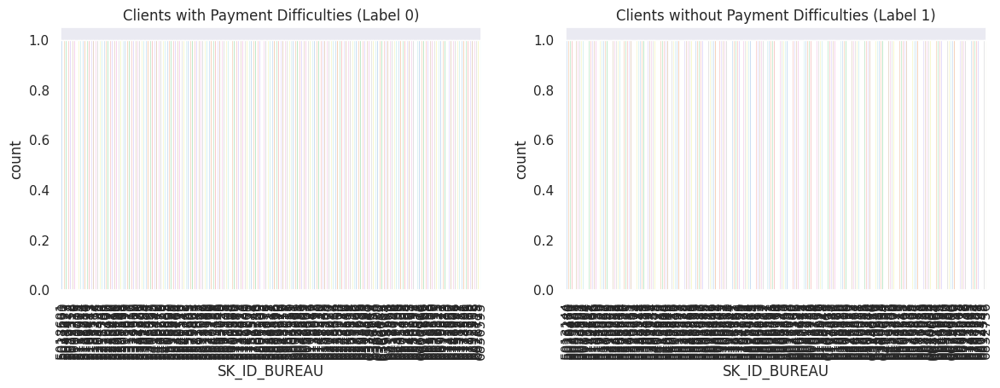

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

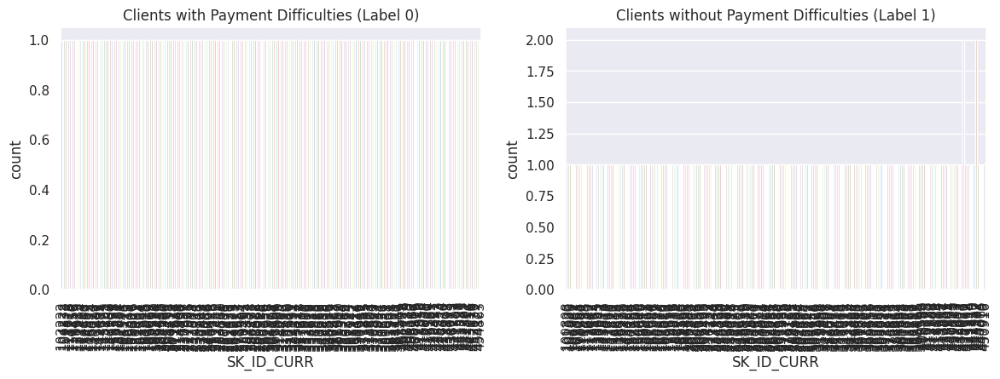

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

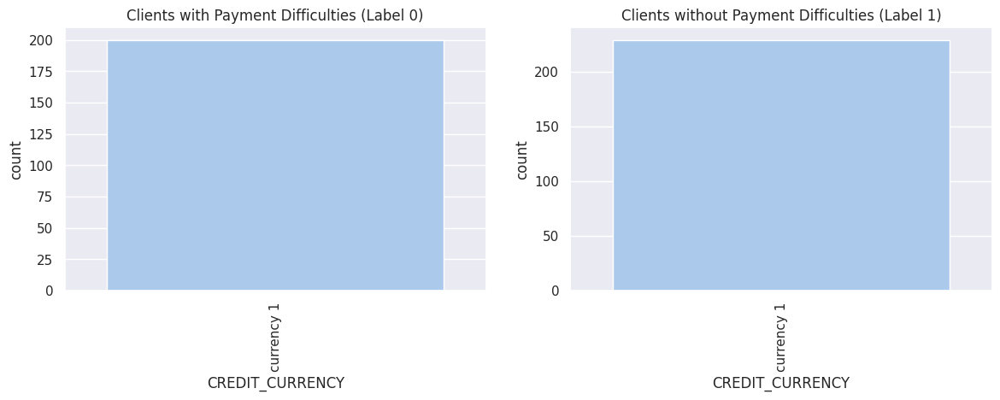

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

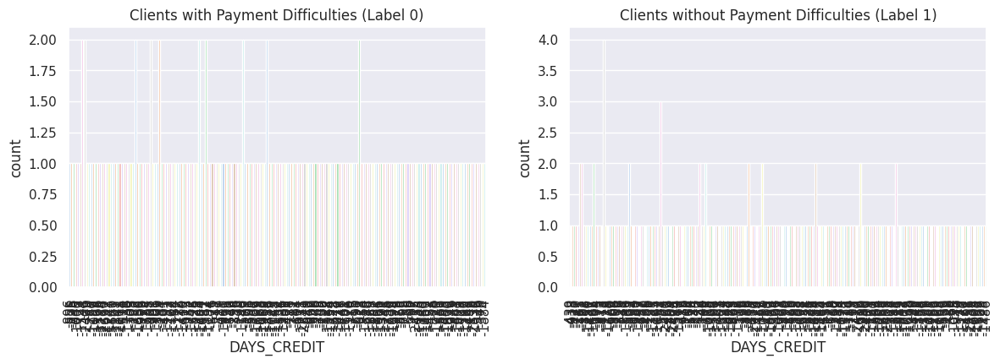

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

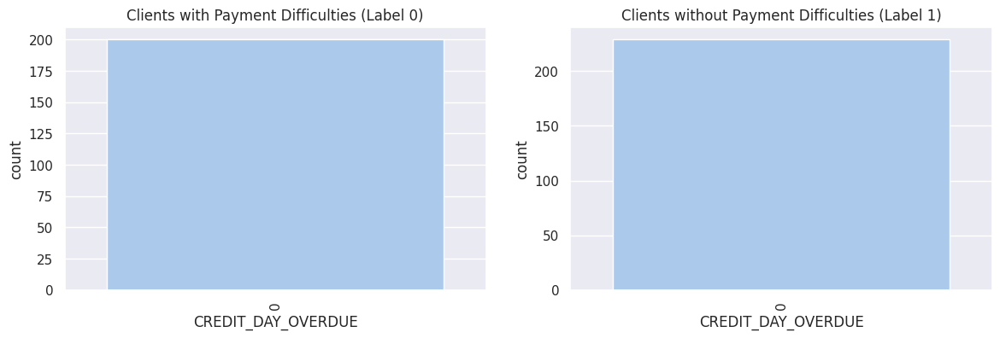

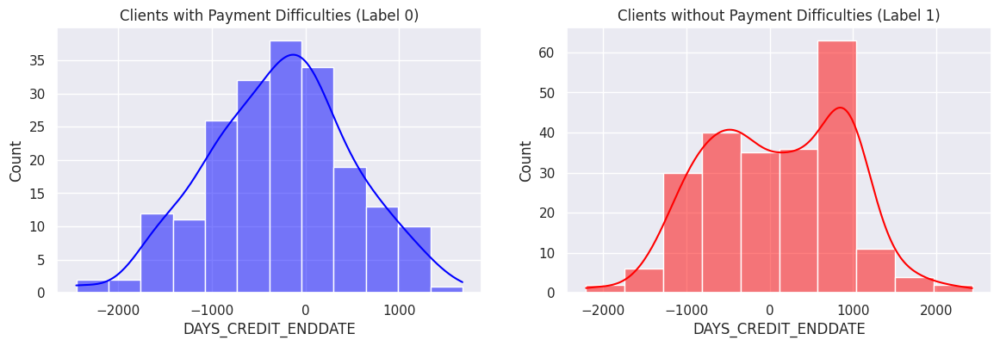

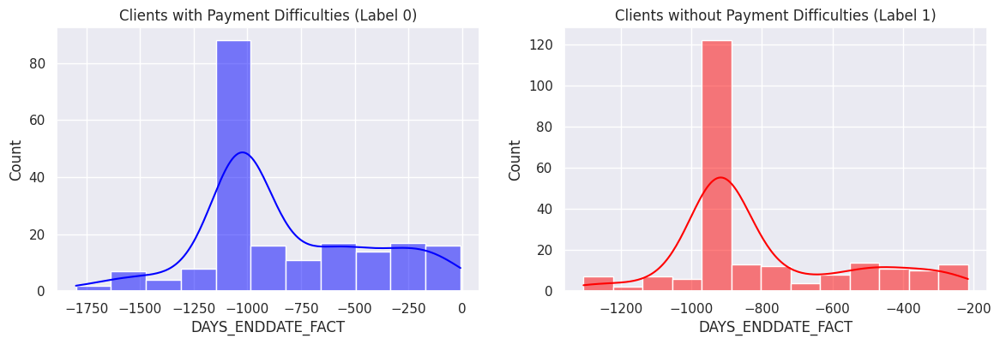

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

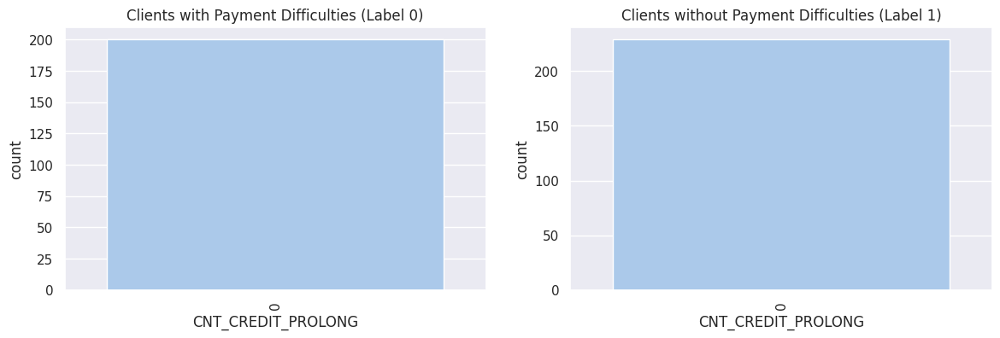

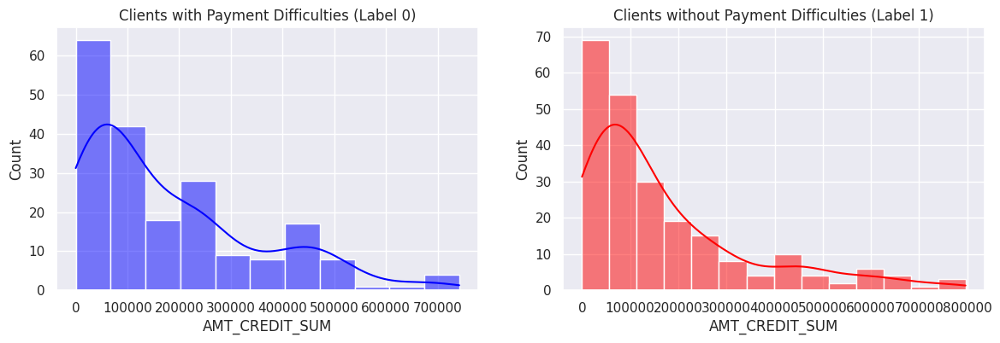

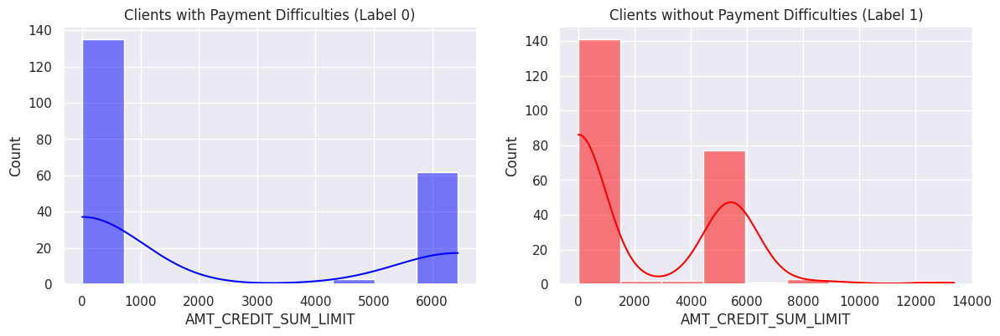

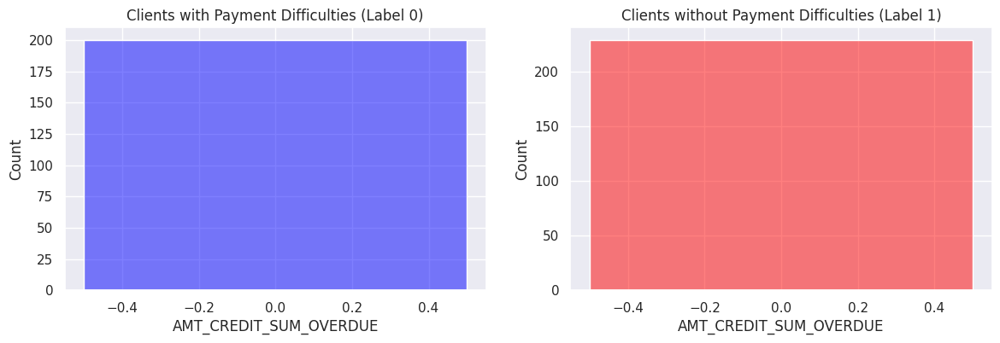

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

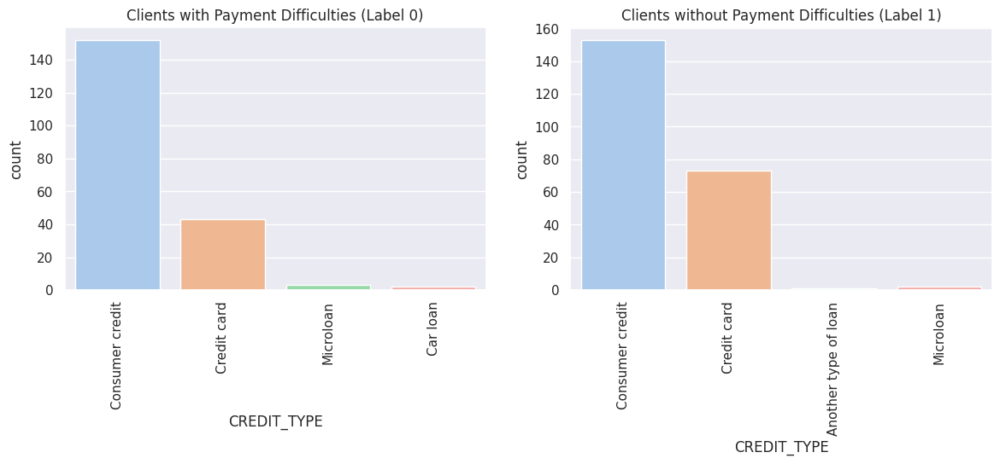

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

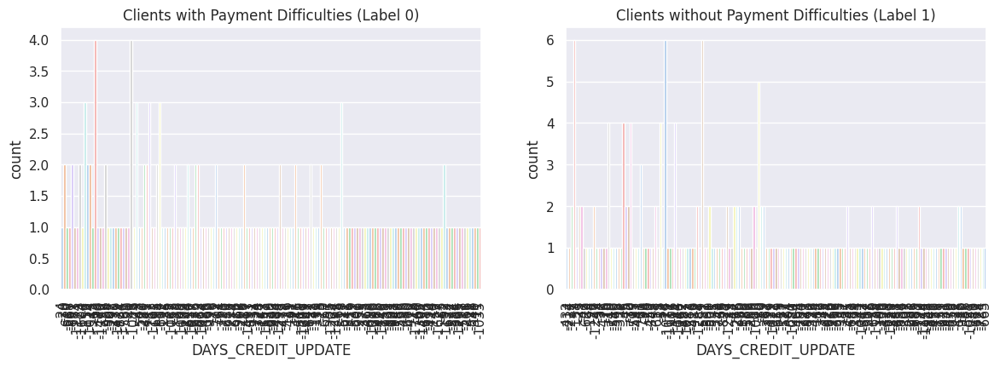

/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:224: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data0, x=column, ax=ax1, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:226: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:229: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data1, x=column, ax=ax2, palette='pastel')
/home/amonroy/notebooks/Portafolio/Análisis_datos/EDA_tools.py:231: UserWarning: set_ticklabels() should only be use

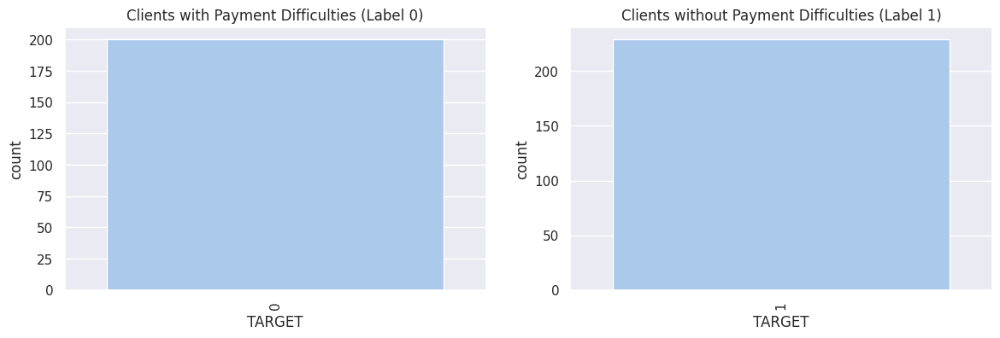

************************************************************************************************************************ 



FINISHED


In [9]:
bureau_df.createOrReplaceTempView('bureau_')
bureau0, bureau1= eda_pipeline(bureau_df,'bureau_',  target_column='TARGET',
                                         id_columns=['SK_ID_BUREAU','SK_ID_CURR'],fillNulls_numerical=True, fillNulls_categorical=True, dropIrrelevantCols=True)

In [10]:
# Drop irrelevant columns
bureau0=bureau0.drop(*['CNT_CREIDT_PROLONG','CREDIT_CURRENCY'])
bureau1=bureau1.drop(*['CNT_CREIDT_PROLONG', 'CREDIT_CURRENCY'])

### Conclusions:
1.There are 2 columns with a percentage bigger than 50%: they were delated
2. From the correlation plots, highly correlated columns were removed where there is no significant difference between labels.
5. Using the  blox plots the outliers were eliminated
6. The columns 'CNT_CREIDT_PROLONG','CREDIT_CURRENCY' were dropped becaues they looked too similar for each label

# Feature engineer for dataframes

In [11]:
# Load info dataframe
info = edaTools.read_dataframe('HomeCredit_columns_description.csv')
info.createOrReplaceTempView('info')
tables = 'application_{train|test}.csv', 'bureau.csv', 'previous_application.csv', 'POS_CASH_balance.csv'

# Select columns of interest
appCols = set(application0.columns)
bureauCols = set(bureau0.columns)
prevAppCols = set(prev_app0.columns)
posCashCols = set(pos_cash0.columns)
colsF = tuple(appCols.union(bureauCols).union(prevAppCols).union(posCashCols))

# Create daraframe
info = spark.sql(f'select Table,Row,Description,Special from info where Row  in {colsF} and table in {tables} order by Table')

## Bureau dataframe

In [12]:
edaTools.show(bureau0.orderBy('SK_ID_CURR'))
print("info:")
edaTools.show(spark.sql('select * from info where Table = "bureau.csv"'), len(bureauCols))

,SK_ID_BUREAU,SK_ID_CURR,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,TARGET
0,5885879,100003,-775,0,-420.0,-621.0,0,72652.500000,0.0,0.0,Consumer credit,-550,0
1,5885878,100003,-1636,0,-540.0,-540.0,0,112500.000000,0.0,0.0,Credit card,-540,0
2,6829134,100004,-408,0,-382.0,-382.0,0,94537.796875,0.0,0.0,Consumer credit,-382,0
3,6829133,100004,-1326,0,-595.0,-683.0,0,94500.000000,0.0,0.0,Consumer credit,-682,0
4,5987200,100007,-1149,0,-783.0,-783.0,0,146250.000000,0.0,0.0,Consumer credit,-783,0


24/06/27 17:52:20 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , Table, Row, Description, Special
 Schema: _c0, Table, Row, Description, Special
Expected: _c0 but found: 
CSV file: file:///home/amonroy/notebooks/Portafolio/Análisis_datos/HomeCredit_columns_description.csv


info:


,_c0,Table,Row,Description,Special
0,125,bureau.csv,SK_ID_CURR,"ID of loan in our sample - one loan in our sample can have 0,1,2 or more related previous credits in credit bureau",hashed
1,126,bureau.csv,SK_BUREAU_ID,Recoded ID of previous Credit Bureau credit related to our loan (unique coding for each loan application),hashed
2,127,bureau.csv,CREDIT_ACTIVE,Status of the Credit Bureau (CB) reported credits,None
3,128,bureau.csv,CREDIT_CURRENCY,Recoded currency of the Credit Bureau credit,recoded
4,129,bureau.csv,DAYS_CREDIT,How many days before current application did client apply for Credit Bureau credit,time only relative to the application
5,130,bureau.csv,CREDIT_DAY_OVERDUE,Number of days past due on CB credit at the time of application for related loan in our sample,None
6,131,bureau.csv,DAYS_CREDIT_ENDDATE,Remaining duration of CB credit (in days) at the time of application in Home Credit,time only relative to the application
7,132,bureau.csv,DAYS_ENDDATE_FACT,Days since CB credit ended at the time of application in Home Credit (only for closed credit),time only relative to the application
8,133,bureau.csv,AMT_CREDIT_MAX_OVERDUE,Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample),None
9,134,bureau.csv,CNT_CREDIT_PROLONG,How many times was the Credit Bureau credit prolonged,None


Created features:
1. BureauPrevLoans: Number of previous Credit Bureau Loans
2. BureauMeanDaysCredit: Mean of previous Credit Bureau Loans
3. BureauMeanDaysCredisEndDate : Mean duration of the CB credit loans
4. BureauMaxDaysEndDateFact: The nealrest date of CB credit loan relatived to the app loan
5. BureauMeanCntCreditProlong: The mean times that the CB was prolonged
6. BureauMaxCntCreditProlong : The max. times that the CB was  prolonged
7. BureauMaxAmtCreditSum : The max. CB credit amount
8. BureauMeanAmtCreditSum : The mean CB credit amount

The reason why I selected Max, Mean and values is because for each SK_ID_CURR exists an unique SK_ID_BUREAU, i,e: an  unique CreditBurea sample to be analyzed and used in the future.

9. BUREAU_creditType_cnt for crediType in CreditType column values

The last set of columns was because the CreditType column was categorical.

In [13]:
bureau0.createOrReplaceTempView('bureau0')
bureau1.createOrReplaceTempView('bureau1')

In [14]:
# Obtain the values for the Credit_Types of the bureau dataframes
credit_types = bureau0.select("CREDIT_TYPE").distinct().rdd.flatMap(lambda x: x).collect()

def bureauQuery(table):
    # Base SQL query
    sql_query = """
    SELECT
        SK_ID_CURR,
        COUNT(SK_ID_BUREAU) AS BureauPrevLoans,
        AVG(CREDIT_DAY_OVERDUE) AS BureauMeanCreditDayOverdue,
        AVG(DAYS_CREDIT_ENDDATE) AS BureauMeanDaysCreditEndDate,
        AVG(DAYS_ENDDATE_FACT) AS BureauMeanDaysEndDateFact,
        AVG(CNT_CREDIT_PROLONG) AS BureauMeanCntCreditProlong,
        MAX(CNT_CREDIT_PROLONG) AS BureauMaxCntCreditProlong,
        MAX(AMT_CREDIT_SUM) AS BureauMaxAmtCreditSum,
        AVG(AMT_CREDIT_SUM) AS BureauMeanAmtCreditSum
    """
    
    # Add dynamic CREDIT_TYPE counts to the query
    credit_type_counts = ",\n".join([
        f"SUM(CASE WHEN CREDIT_TYPE = '{credit_type}' THEN 1 ELSE 0 END) AS `BUREAU_{credit_type.replace(' ', '_').replace('(', '').replace(')', '').replace('-', '_').replace('.', '')}_cnt`"
        for credit_type in credit_types
    ])
    
    # Complete the query
    sql_query += ",\n" + credit_type_counts + f"\nFROM {table} GROUP BY SK_ID_CURR"
    return sql_query


# Create the bureau dataframes 
bureau0 = spark.sql(bureauQuery('bureau0'))
bureau1 = spark.sql(bureauQuery('bureau1'))

## Previous Application

In [15]:
edaTools.show(prev_app0.orderBy('SK_ID_CURR'))
print('*'*100)
edaTools.show(spark.sql('select * from info where Table = "previous_application.csv"'), len(prevAppCols))


,SK_ID_PREV,SK_ID_CURR,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE,NFLAG_INSURED_ON_APPROVAL,TARGET
0,1564014,100004,20106.0,24282.000000,FRIDAY,5,1,Cash through the bank,XAP,Unaccompanied,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.000000,middle,POS mobile without interest,365243.0000,-784.000000,-724.000000,0.000000,0
1,2827850,100006,0.0,224431.640625,THURSDAY,15,1,XNA,XAP,None,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,15.857564,XNA,Card Street,343262.3125,13656.441406,75866.703125,0.328575,0
2,1757431,100008,0.0,224431.640625,FRIDAY,18,1,XNA,XAP,None,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,15.857564,XNA,Cash,343262.3125,13656.441406,75866.703125,0.328575,0
3,1907290,100008,109309.5,121455.000000,MONDAY,9,1,Cash through the bank,XAP,None,Repeater,Gardening,POS,XNA,Regional / Local,96,Consumer electronics,10.000000,low_normal,POS household with interest,365243.0000,-2299.000000,-2029.000000,0.000000,0
4,1186888,100008,39955.5,44455.500000,MONDAY,13,1,Cash through the bank,XAP,None,New,Mobile,POS,XNA,Country-wide,50,Connectivity,6.000000,low_normal,POS mobile with interest,365243.0000,-2491.000000,-2341.000000,0.000000,0


****************************************************************************************************


24/06/27 17:52:25 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , Table, Row, Description, Special
 Schema: _c0, Table, Row, Description, Special
Expected: _c0 but found: 
CSV file: file:///home/amonroy/notebooks/Portafolio/Análisis_datos/HomeCredit_columns_description.csv


,_c0,Table,Row,Description,Special
0,176,previous_application.csv,SK_ID_PREV,"ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loan applications in Home Credit, previous application could, but not necessarily have to lead to credit)",hashed
1,177,previous_application.csv,SK_ID_CURR,ID of loan in our sample,hashed
2,178,previous_application.csv,NAME_CONTRACT_TYPE,"Contract product type (Cash loan, consumer loan [POS] ,...) of the previous application",None
3,179,previous_application.csv,AMT_ANNUITY,Annuity of previous application,None
4,180,previous_application.csv,AMT_APPLICATION,For how much credit did client ask on the previous application,None
5,181,previous_application.csv,AMT_CREDIT,"Final credit amount on the previous application. This differs from AMT_APPLICATION in a way that the AMT_APPLICATION is the amount for which the client initially applied for, but during our approval process he could have received different amount - AMT_CREDIT",None
6,182,previous_application.csv,AMT_DOWN_PAYMENT,Down payment on the previous application,None
7,183,previous_application.csv,AMT_GOODS_PRICE,Goods price of good that client asked for (if applicable) on the previous application,None
8,184,previous_application.csv,WEEKDAY_APPR_PROCESS_START,On which day of the week did the client apply for previous application,None
9,185,previous_application.csv,HOUR_APPR_PROCESS_START,Approximately at what day hour did the client apply for the previous application,rounded


Created features:

1. prevAppMean_{numercialColumn}: For each column with numerical values the mean value was calculated
2. PrevAppMode_{categoricalColumn}: For each categorical column the mode was calculated

The reason of the previous created columns, is that for each  SK_ID_CURR id exists multiple SK_ID_PREV that can be associated (or not) to other previous loan: then the best option was selecting the mean and mode values for each corresponded column

In [16]:
prev_app0.printSchema()

root
 |-- SK_ID_PREV: integer (nullable = true)
 |-- SK_ID_CURR: integer (nullable = true)
 |-- AMT_CREDIT: float (nullable = true)
 |-- AMT_GOODS_PRICE: float (nullable = false)
 |-- WEEKDAY_APPR_PROCESS_START: string (nullable = true)
 |-- HOUR_APPR_PROCESS_START: integer (nullable = true)
 |-- NFLAG_LAST_APPL_IN_DAY: integer (nullable = true)
 |-- NAME_PAYMENT_TYPE: string (nullable = true)
 |-- CODE_REJECT_REASON: string (nullable = true)
 |-- NAME_TYPE_SUITE: string (nullable = true)
 |-- NAME_CLIENT_TYPE: string (nullable = true)
 |-- NAME_GOODS_CATEGORY: string (nullable = true)
 |-- NAME_PORTFOLIO: string (nullable = true)
 |-- NAME_PRODUCT_TYPE: string (nullable = true)
 |-- CHANNEL_TYPE: string (nullable = true)
 |-- SELLERPLACE_AREA: integer (nullable = true)
 |-- NAME_SELLER_INDUSTRY: string (nullable = true)
 |-- CNT_PAYMENT: float (nullable = false)
 |-- NAME_YIELD_GROUP: string (nullable = true)
 |-- PRODUCT_COMBINATION: string (nullable = true)
 |-- DAYS_FIRST_DRAWING: 

In [17]:
from pyspark.sql.functions import col, avg, expr, count, max

floatPrevAppCols = 'AMT_CREDIT','AMT_GOODS_PRICE','DAYS_FIRST_DRAWING','DAYS_FIRST_DUE','DAYS_LAST_DUE','NFLAG_INSURED_ON_APPROVAL'
catPrevAppCols = [col for col in prev_app0.columns if col not in floatPrevAppCols and col not in ['SK_ID_PREV','SK_ID_CURR', 'TARGET']]

def queryPrevApp(df):
    # Agregaciones para columnas numéricas
    numeric_aggregations = [avg(col).alias(f"prevAppAvg{col}") for col in floatPrevAppCols]
    
    # Agregaciones para columnas categóricas (calculando el valor más frecuente)
    categorical_aggregations = [expr(f"first({col}, true)").alias(f"PrevAppMode_{col}") for col in catPrevAppCols]

    # Agrupación y agregación por SK_ID_CURR
    grouped_df = df.groupBy("SK_ID_CURR").agg(*numeric_aggregations, *categorical_aggregations)
    
    return grouped_df

In [18]:
# Create dataframes
prevApp0 = queryPrevApp(prev_app0)
prevApp1 = queryPrevApp(prev_app1)

# Create tables
prevApp0.createOrReplaceTempView('prevApp0')
prevApp1.createOrReplaceTempView('prevApp1')

# Show dataframes
edaTools.show(prevApp0)
edaTools.show(prevApp1)

,SK_ID_CURR,prevAppAvgAMT_CREDIT,prevAppAvgAMT_GOODS_PRICE,prevAppAvgDAYS_FIRST_DRAWING,prevAppAvgDAYS_FIRST_DUE,prevAppAvgDAYS_LAST_DUE,prevAppAvgNFLAG_INSURED_ON_APPROVAL,PrevAppMode_WEEKDAY_APPR_PROCESS_START,PrevAppMode_HOUR_APPR_PROCESS_START,PrevAppMode_NFLAG_LAST_APPL_IN_DAY,PrevAppMode_NAME_PAYMENT_TYPE,PrevAppMode_CODE_REJECT_REASON,PrevAppMode_NAME_TYPE_SUITE,PrevAppMode_NAME_CLIENT_TYPE,PrevAppMode_NAME_GOODS_CATEGORY,PrevAppMode_NAME_PORTFOLIO,PrevAppMode_NAME_PRODUCT_TYPE,PrevAppMode_CHANNEL_TYPE,PrevAppMode_SELLERPLACE_AREA,PrevAppMode_NAME_SELLER_INDUSTRY,PrevAppMode_CNT_PAYMENT,PrevAppMode_NAME_YIELD_GROUP,PrevAppMode_PRODUCT_COMBINATION
0,100110,40036.50,38029.500000,365243.00000,-381.000000,-321.000000,0.000000,WEDNESDAY,12,1,Cash through the bank,XAP,None,New,Mobile,POS,XNA,Country-wide,44,Connectivity,6.000000,high,POS mobile with interest
1,100220,93672.00,89253.000000,365243.00000,-1075.000000,-955.000000,0.000000,TUESDAY,11,1,Cash through the bank,XAP,Unaccompanied,Repeater,Furniture,POS,XNA,Stone,40,Furniture,6.000000,low_normal,POS industry with interest
2,100417,31493.25,34807.500000,365243.00000,-1968.000000,-1818.000000,0.000000,WEDNESDAY,10,1,Cash through the bank,XAP,Children,New,Mobile,POS,XNA,Country-wide,56,Connectivity,4.000000,low_normal,POS mobile with interest
3,100453,28602.00,29610.000000,354252.65625,5832.720703,37057.851562,0.164288,WEDNESDAY,16,1,XNA,CLIENT,Other_B,Repeater,Mobile,XNA,XNA,Country-wide,62,Connectivity,15.857564,XNA,POS mobile with interest
4,100600,0.00,224431.640625,343262.31250,13656.441406,75866.703125,0.328575,WEDNESDAY,11,1,XNA,XAP,None,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,15.857564,XNA,Cash


,SK_ID_CURR,prevAppAvgAMT_CREDIT,prevAppAvgAMT_GOODS_PRICE,prevAppAvgDAYS_FIRST_DRAWING,prevAppAvgDAYS_FIRST_DUE,prevAppAvgDAYS_LAST_DUE,prevAppAvgNFLAG_INSURED_ON_APPROVAL,PrevAppMode_WEEKDAY_APPR_PROCESS_START,PrevAppMode_HOUR_APPR_PROCESS_START,PrevAppMode_NFLAG_LAST_APPL_IN_DAY,PrevAppMode_NAME_PAYMENT_TYPE,PrevAppMode_CODE_REJECT_REASON,PrevAppMode_NAME_TYPE_SUITE,PrevAppMode_NAME_CLIENT_TYPE,PrevAppMode_NAME_GOODS_CATEGORY,PrevAppMode_NAME_PORTFOLIO,PrevAppMode_NAME_PRODUCT_TYPE,PrevAppMode_CHANNEL_TYPE,PrevAppMode_SELLERPLACE_AREA,PrevAppMode_NAME_SELLER_INDUSTRY,PrevAppMode_CNT_PAYMENT,PrevAppMode_NAME_YIELD_GROUP,PrevAppMode_PRODUCT_COMBINATION
0,100112,122053.50,128110.500000,365243.000000,-467.000000,-287.000000,0.000000,THURSDAY,19,1,Cash through the bank,XAP,None,Refreshed,Mobile,POS,XNA,Stone,60,Connectivity,6.000000,middle,POS mobile with interest
1,100477,0.00,224665.937500,333012.343750,11454.697266,85686.328125,0.330227,THURSDAY,12,1,XNA,XAP,None,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,17.404013,XNA,Card Street
2,101142,98199.00,98538.750000,349127.671875,4999.848633,42280.664062,0.165114,WEDNESDAY,18,1,Cash through the bank,XAP,"Spouse, partner",New,Mobile,POS,XNA,Country-wide,45,Connectivity,12.000000,high,POS mobile with interest
3,101541,45000.00,194777.291667,333012.343750,11454.697266,85686.328125,0.330227,TUESDAY,19,1,XNA,XAP,Unaccompanied,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,17.404013,XNA,Card Street
4,101871,14357.25,128285.468750,349127.671875,5301.848633,42492.664062,0.165114,FRIDAY,14,1,XNA,XAP,Family,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,17.404013,XNA,Cash


In [19]:
# Delate dataframe that won't be used anymore
edaTools.borrar(prev_app0)
edaTools.borrar(prev_app1)

## POS_CASH_balance

In [20]:
edaTools.show(pos_cash0.orderBy('SK_ID_CURR'),20)
print('*'*100)
edaTools.show(spark.sql('select * from info where Table = "POS_CASH_balance.csv"'), len(prevAppCols))

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF,TARGET
0,1810518,100003,-19,12.0,Active,0,0,0
1,2636178,100003,-23,6.0,Active,0,0,0
2,1810518,100003,-20,12.0,Active,0,0,0
3,2636178,100003,-24,6.0,Active,0,0,0
4,1810518,100003,-25,12.0,Active,0,0,0
5,2636178,100003,-26,6.0,Active,0,0,0
6,1810518,100003,-23,12.0,Active,0,0,0
7,2636178,100003,-21,6.0,Completed,0,0,0
8,1810518,100003,-21,12.0,Active,0,0,0
9,2636178,100003,-25,6.0,Active,0,0,0


****************************************************************************************************


24/06/27 17:52:35 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , Table, Row, Description, Special
 Schema: _c0, Table, Row, Description, Special
Expected: _c0 but found: 
CSV file: file:///home/amonroy/notebooks/Portafolio/Análisis_datos/HomeCredit_columns_description.csv


,_c0,Table,Row,Description,Special
0,145,POS_CASH_balance.csv,SK_ID_PREV,"ID of previous credit in Home Credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)",None
1,146,POS_CASH_balance.csv,SK_ID_CURR,ID of loan in our sample,None
2,147,POS_CASH_balance.csv,MONTHS_BALANCE,"Month of balance relative to application date (-1 means the information to the freshest monthly snapshot, 0 means the information at application - often it will be the same as -1 as many banks are not updating the information to Credit Bureau regularly )",time only relative to the application
3,148,POS_CASH_balance.csv,CNT_INSTALMENT,Term of previous credit (can change over time),None
4,149,POS_CASH_balance.csv,CNT_INSTALMENT_FUTURE,Installments left to pay on the previous credit,None
5,150,POS_CASH_balance.csv,NAME_CONTRACT_STATUS,Contract status during the month,None
6,151,POS_CASH_balance.csv,SK_DPD,DPD (days past due) during the month of previous credit,None
7,152,POS_CASH_balance.csv,SK_DPD_DEF,DPD during the month with tolerance (debts with low loan amounts are ignored) of the previous credit,None


Created Features:
1. POS_DurationLoanMax: Max. Quantitt of monhts of a loan that it have information
2. POS_MeanCntInstsallment:
3. POS_LastCntInstallment:
4. POS_LastNameContractStatus:
5. POS_ModeNameContractStatus:
6. POS_LastSkDPD:
7. POS_MeanSkDPD:

In [21]:
# Obtain the values for the Credit_Types of the bureau dataframes
contractStatutes = pos_cash0.select("NAME_CONTRACT_STATUS").distinct().rdd.flatMap(lambda x: x).collect()

def posCashQuery(table):
    # Base SQL query
    sql_query = """
    SELECT
        SK_ID_CURR,
        MIN(MONTHS_BALANCE) AS POS_MaxDurationLoan,
        AVG(CNT_INSTALMENT) AS POS_MeanCNT_INSTALMENT,
        AVG(SK_DPD) AS POS_MeanSK_DPD,
        MAX(SK_DPD) AS POS_Max_SK_DPD
    """
    
    # Add dynamic CREDIT_TYPE counts to the query
    contractStatus_counts = ",\n".join([
        f"SUM(CASE WHEN NAME_CONTRACT_STATUS = '{status}' THEN 1 ELSE 0 END) AS `POS_{status.replace(' ', '_').replace('(', '').replace(')', '').replace('-', '_').replace('.', '')}_cnt`"
        for status in contractStatutes
    ])
    
    # Complete the query
    sql_query += ",\n" + contractStatus_counts + f"\nFROM {table} GROUP BY SK_ID_CURR"
    return sql_query

In [22]:
pos_cash0.createOrReplaceTempView('posCash0')
pos_cash1.createOrReplaceTempView('posCash1')

posCash0 = spark.sql(posCashQuery('posCash0'))
posCash1 = spark.sql(posCashQuery('posCash1'))

In [23]:
edaTools.show(posCash0)
edaTools.show(posCash1)

,SK_ID_CURR,POS_MaxDurationLoan,POS_MeanCNT_INSTALMENT,POS_MeanSK_DPD,POS_Max_SK_DPD,POS_Demand_cnt,POS_Approved_cnt,POS_Completed_cnt,POS_Returned_to_the_store_cnt,POS_Active_cnt,POS_Signed_cnt,POS_XNA_cnt,POS_Canceled_cnt
0,100003,-18,9.307692,0.0,0,0,0,2,0,11,0,0,0
1,100007,-1,17.894737,0.0,0,0,0,1,0,37,0,0,0
2,100035,-20,11.886364,0.0,0,0,0,4,0,40,0,0,0
3,100101,-11,9.466667,0.0,0,0,0,2,0,13,0,0,0
4,100108,-11,7.671519,0.0,0,0,0,1,0,5,1,0,0


,SK_ID_CURR,POS_MaxDurationLoan,POS_MeanCNT_INSTALMENT,POS_MeanSK_DPD,POS_Max_SK_DPD,POS_Demand_cnt,POS_Approved_cnt,POS_Completed_cnt,POS_Returned_to_the_store_cnt,POS_Active_cnt,POS_Signed_cnt,POS_XNA_cnt,POS_Canceled_cnt
0,100112,-10,7.777778,0.0,0,0,0,2,0,16,0,0,0
1,100181,-18,24.000000,0.0,0,0,0,1,0,22,0,0,0
2,100209,-10,8.000000,0.0,0,0,0,1,0,3,0,0,0
3,100424,-13,24.000000,0.0,0,0,0,0,0,9,1,0,0
4,100646,-10,30.000000,0.0,0,0,0,0,0,15,0,0,0


# Final Join of  Dataframes

### Join dataframes per each data

In [24]:
totApp0 = application0.count()
totApp1 = application1.count()

def percentageDataLost(lenData0, lenData1):
    """ Print the Percentages of data lost after joining the columns in the dataframes considering data that does not have null values
    lenData0 (int): Num. registers for the joined dataframe
    lenData1 (int): Num. register for the joined dataframe
    """
    res0 = (totApp0 - application0_df.count())/totApp0 * 100
    res1 = (totApp1 - application1_df.count())/totApp1 * 100
    print(f'En data0, hay una pérdida del {round(res0, 4)}%')
    print(f'En data1, hay una pérdida del {round(res1, 4)}%')    


# Delate dataframe that won't be used anymore
edaTools.borrar(pos_cash0)
edaTools.borrar(pos_cash1)

edaTools.borrar(prev_app0)
edaTools.borrar(prev_app1)

Join the application dataframes with bureau dataframes and print the percentages of data lost after joining:

In [25]:
# Join with bureau
application0_df = application0.join(bureau0, on='SK_ID_CURR', how='left')
application1_df = application1.join(bureau1, on='SK_ID_CURR', how='left')

# Delate registers with null values for the bureau dataframe
application0_df = application0_df.dropna(subset = ['BureauPrevLoans'])
application1_df = application1_df.dropna(subset = ['BureauPrevLoans'])

In [26]:
percentageDataLost(application0_df.count(), application1_df.count())

En data0, hay una pérdida del 6.757%
En data1, hay una pérdida del 8.5724%


Join the created application dataframes with previousApplication dataframes  and print the percentage of data lost after joining:

In [27]:
# Join with previousApplication dataframes
application0_df = application0_df.join(prevApp0, on = 'SK_ID_CURR', how='left')
application1_df = application1_df.join(prevApp1, on = 'SK_ID_CURR', how='left')

In [28]:
application0_df = application0_df.dropna(subset=['prevAppAvgAMT_CREDIT'])
application1_df = application1_df.dropna(subset=['prevAppAvgAMT_CREDIT'])

In [29]:
percentageDataLost(application0_df.count(), application1_df.count())

En data0, hay una pérdida del 38.3748%
En data1, hay una pérdida del 37.3292%


Join the created application dataframes with PointOfSample dataframes and print the percentage of data lost after joining:

In [30]:
# Join with PointOfSamples_previous dataframes
application0_df = application0_df.join(posCash0, on = 'SK_ID_CURR', how='left')
application1_df = application1_df.join(posCash1, on = 'SK_ID_CURR', how='left')

In [31]:
application0_df = application0_df.dropna(subset = ['POS_Active_cnt'])
application1_df = application1_df.dropna(subset = ['POS_Active_cnt'])

In [32]:
percentageDataLost(application0_df.count(), application1_df.count())

En data0, hay una pérdida del 43.1076%
En data1, hay una pérdida del 44.3648%


Relation of the joined labeled data after and before joining:

In [33]:
# Relation after joining
application0_df.count()/application1_df.count()

7.0914671577655

In [34]:
# Relation before joining
totApp0/totApp1

6.934767759562842

### Creation of the Final Dataframe

In [35]:
# Union of the labeld dataframes
final_dataframe = application0_df.union(application1_df)

In [ ]:
# Save and write the dataframes
final_dataframe.coalesce(1).write.csv("/home/amonroy/notebooks/Portafolio/Análisis_datos/finalDataV1", header=True)

In [ ]:
final_dataframe.count()

In [ ]:
application0_df.count()

In [ ]:
application1_df.count()